# If necessary install the below packages (libraries) before loading them
Use install.packages in terminal rather than in the notebook.

`mamba activate r432
R
install.packages()`

In [1]:
# Downstream analysis using object created by Sara Grimm
# Match the R version and important package versions used in the original analysis
# R432

library(Seurat);       # v5.0.1  
library(ggplot2);      # v3.4.4
library(dplyr);
library(viridis);
library(dittoSeq);
library(scales);
library(scCustomize)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Warning message:
“package ‘dplyr’ was built under R version 4.3.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite

Warning message:
“package ‘viridisLite’ was built under R version 4.3.3”
Warning message:
“package ‘scales’ was built under R version 4.3.3”

Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal


scCustomize v3.0.1
If you find the scCustomize useful please cite.
See 'samuel-marsh.github.io/scCustomize/articles/FAQ.html' for citation info.



In [2]:
# Additional packages required for CellChat

library(CellChat);
library(patchwork);
options(stringsAsFactors=FALSE);
library(NMF);
library(ggalluvial);
library(ComplexHeatmap);
library(wordcloud);
library(presto)

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: registry

Loading required package: rngtools

Loading required package: cluster

Warning message:
“package ‘cluster’ was built under R version 4.3.3”
NMF - BioConductor layer [OK] | Shared memory capabilities [NO: bigmemory] | Cores 2/2

  To enable shared memory capabilities, try: install.extras('
NMF
')


Attaching package: ‘NMF’


The following objects are masked from ‘package:igraph’:

    algorithm, compare


Loading required package: grid

ComplexHeatmap version 2.21.2
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHea

In [3]:
# Record active package versions
packageVersion("Seurat");
packageVersion("ggplot2");        
packageVersion("dplyr");
packageVersion("viridis");
packageVersion("dittoSeq");
packageVersion("CellChat");
packageVersion("patchwork");
packageVersion("NMF");
packageVersion("ggalluvial");
packageVersion("ComplexHeatmap");
packageVersion("wordcloud");
packageVersion("scales");
packageVersion("scCustomize");
packageVersion("presto");

[1] ‘5.0.1’

[1] ‘3.4.4’

[1] ‘1.1.4’

[1] ‘0.6.5’

[1] ‘1.14.3’

[1] ‘2.1.2’

[1] ‘1.3.0.9000’

[1] ‘0.28’

[1] ‘0.12.5’

[1] ‘2.21.2’

[1] ‘2.6’

[1] ‘1.3.0’

[1] ‘3.0.1’

[1] ‘1.0.0’

The CellChat “merged” object is ready for use.  The main workflow was run separately for each genotype, those were combined, then the comparison vignette was worked through as a starting point.  All of the actual computations should be done with results already in the CellChat working object, so you can skip to making any plots that you might be interested in.

In the RData object (~/data_rds/ RM-adult_SrfKO-CellChatDB-merged.20feb2025.RData), is the following:
* CCobjMerged = CellChat object with the merged Ctrl and SrfKO genotypes
* object.list = CellChat objects for Ctrl and SrfKO in a list … some of the visualizations access the individual rather than the merged objects
* alphaOrderCellTypes = When specifying the sources/targets in the plots, the parameters expect index positions rather than actual cell type names.  You can use this ordered list as a key.
* CCobjCtrl, CCobjSrfKO, df.net.all.Ctrl, df.net.all.SrfKO = These were the results of the CellChat processing of only one genotype at a time.  I’ve kept them in the RData file so you can access them independently if you want.  These were made in the ‘part11b’ steps (see “code” subfolder).
* Everything else in the RData object was generated somewhere in the ‘part11c’ steps (see “code” subfolder).  These may or may not be useful if you’re repeating any of the results/plots that make use of them.


In [4]:
#Read in the data from Sara Grimm
load(file = "/ddn/gs1/home/marquardtrm/PRcreSRF_scRNAseq_Sara/data_rds/RM-adult_SrfKO-CellChatDB-merged.20feb2025.RData")

# Contains "CCobjMerged", a merged CellChat object containing CCobjCtrl and CCobjSrfKO CellChat objects that were first run separately.

CCobjMerged



An object of class CellChat created from a merged object with multiple datasets 
 1403 signaling genes.
 33500 cells. 
CellChat analysis of single cell RNA-seq data! 

In [5]:
ls()

[1] "alphaOrderCellTypes" "CCobjCtrl"           "CCobjMerged"        
 [4] "CCobjSrfKO"          "df.net.all.Ctrl"     "df.net.all.SrfKO"   
 [7] "gene.down"           "gene.up"             "net"                
[10] "net.down"            "net.up"              "num.link"           
[13] "object.list"         "pairLR.use.down"     "pairLR.use.up"      
[16] "pathway.union"       "weight.MinMax"

In [6]:
object.list

$Ctrl
An object of class CellChat created from a single dataset 
 26486 genes.
 17601 cells. 
CellChat analysis of single cell RNA-seq data! 

$SrfKO
An object of class CellChat created from a single dataset 
 26486 genes.
 15899 cells. 
CellChat analysis of single cell RNA-seq data! 


In [7]:
alphaOrderCellTypes

[1] EndoLymph       Endothelial     Epi-Glnd        Epi-Glnd_Prolif
 [5] Epi-LowQual     Epi-Luminal     Fibro-F2        Fibro-F3       
 [9] Fibro-ProlifG2M Fibro-ProlifSG2 Fibro-Unk       Imm-Bcell      
[13] Imm-cDC2_mregDC Imm-DC1         Imm-gdT         Imm-ILC2       
[17] Imm-Macrophage  Imm-Monocyte    Imm-Neutrophil  Imm-NK         
[21] Imm-NK_Prolif   Imm-pDC         Imm-Plasma      Imm-T_NKT      
[25] Mesothelial     Perivascular    SmoothMuscle   
27 Levels: EndoLymph Endothelial Epi-Glnd Epi-Glnd_Prolif ... SmoothMuscle

In [8]:
CCobjMerged@options

$mode
[1] "merged"

$datatype
[1] "RNA"

In [9]:
CCobjMerged@meta

,orig.ident,nCount_RNA,nFeature_RNA,Sample,genotype,batch,percent.mt,percent.rp,percent.hg,S.Score,⋯,old.ident,CC.Difference,broad_cluster,CellType,CellSubtype,CellTypeBroad,ccname,samples,ident,datasets
,<chr>,<dbl>,<int>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>
Ctrl1___AAACCCAAGACCATAA-1,Ctrl1,13853,4097,Ctrl1,Ctrl,1,4.858153,21.865300,0.00000000,-0.115882733,⋯,Ctrl1,-0.013908583,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl
Ctrl1___AAACCCAAGGTCCCGT-1,Ctrl1,5652,2163,Ctrl1,Ctrl,1,2.813163,11.341118,0.00000000,-0.087413046,⋯,Ctrl1,0.073724669,5,Macrophage,Macrophage,Immune,Imm-Macrophage,Ctrl1,Imm-Macrophage,Ctrl
Ctrl1___AAACCCACATCACCAA-1,Ctrl1,6085,2336,Ctrl1,Ctrl,1,2.678718,10.566968,0.00000000,-0.070066492,⋯,Ctrl1,-0.020450549,15,gammadeltaT,gammadeltaT,Immune,Imm-gdT,Ctrl1,Imm-gdT,Ctrl
Ctrl1___AAACCCACATCTAACG-1,Ctrl1,12378,3609,Ctrl1,Ctrl,1,3.869769,14.760058,0.00000000,-0.035871272,⋯,Ctrl1,0.055083057,11,SmoothMuscle,none,SmoothMuscle,SmoothMuscle,Ctrl1,SmoothMuscle,Ctrl
Ctrl1___AAACCCACATGTCAGT-1,Ctrl1,15094,4189,Ctrl1,Ctrl,1,3.186697,23.227773,0.00000000,0.795792256,⋯,Ctrl1,0.495081210,10,ProliferatingNK,ProliferatingNK,Immune,Imm-NK_Prolif,Ctrl1,Imm-NK_Prolif,Ctrl
Ctrl1___AAACCCAGTAATGTGA-1,Ctrl1,14440,4595,Ctrl1,Ctrl,1,4.903047,18.981994,0.00000000,0.056406385,⋯,Ctrl1,-0.524186712,7,ProliferatingFibroblastM,ProliferatingFibroblastM,Fibroblast,Fibro-ProlifG2M,Ctrl1,Fibro-ProlifG2M,Ctrl
Ctrl1___AAACCCAGTGTAGGAC-1,Ctrl1,19929,4617,Ctrl1,Ctrl,1,5.996287,24.481911,0.00000000,-0.084860322,⋯,Ctrl1,0.041157153,3,GlandularEpithelial,GlandularEpithelial,Epithelial,Epi-Glnd,Ctrl1,Epi-Glnd,Ctrl
Ctrl1___AAACCCATCGCCGAGT-1,Ctrl1,20720,5042,Ctrl1,Ctrl,1,4.917954,23.610039,0.00000000,-0.007086613,⋯,Ctrl1,0.042678230,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl
Ctrl1___AAACCCATCGGCAGTC-1,Ctrl1,15461,4527,Ctrl1,Ctrl,1,4.359356,15.995084,0.00000000,0.559701893,⋯,Ctrl1,-0.266916232,2,Endothelial,none,Endothelial,Endothelial,Ctrl1,Endothelial,Ctrl


In [10]:
levels(CCobjCtrl@idents)
levels(CCobjSrfKO@idents)

[1] "EndoLymph"       "Endothelial"     "Epi-Glnd"        "Epi-Glnd_Prolif"
 [5] "Epi-LowQual"     "Epi-Luminal"     "Fibro-F2"        "Fibro-F3"       
 [9] "Fibro-ProlifG2M" "Fibro-ProlifSG2" "Fibro-Unk"       "Imm-Bcell"      
[13] "Imm-cDC2_mregDC" "Imm-DC1"         "Imm-gdT"         "Imm-ILC2"       
[17] "Imm-Macrophage"  "Imm-Monocyte"    "Imm-Neutrophil"  "Imm-NK"         
[21] "Imm-NK_Prolif"   "Imm-pDC"         "Imm-Plasma"      "Imm-T_NKT"      
[25] "Mesothelial"     "Perivascular"    "SmoothMuscle"

[1] "EndoLymph"       "Endothelial"     "Epi-Glnd"        "Epi-Glnd_Prolif"
 [5] "Epi-LowQual"     "Epi-Luminal"     "Fibro-F2"        "Fibro-F3"       
 [9] "Fibro-ProlifG2M" "Fibro-ProlifSG2" "Fibro-Unk"       "Imm-Bcell"      
[13] "Imm-cDC2_mregDC" "Imm-DC1"         "Imm-gdT"         "Imm-ILC2"       
[17] "Imm-Macrophage"  "Imm-Monocyte"    "Imm-Neutrophil"  "Imm-NK"         
[21] "Imm-NK_Prolif"   "Imm-pDC"         "Imm-Plasma"      "Imm-T_NKT"      
[25] "Mesothelial"     "Perivascular"    "SmoothMuscle"

In [11]:
#Try subsetting cell types of interest
#see https://rdrr.io/github/sqjin/CellChat/man/subsetCellChat.html

#First Ctrl
CCobjCtrl_sub <-subsetCellChat(
  CCobjCtrl,
  cells.use = NULL,
  idents.use = c('Epi-Luminal','Epi-Glnd','Fibro-F2','Fibro-F3',
                 'Imm-Macrophage','Imm-Neutrophil'),
  group.by = NULL,
  invert = FALSE,
  thresh = 0.05
)

The subset of cell groups used for CellChat analysis are  Epi-Glnd Epi-Luminal Fibro-F2 Fibro-F3 Imm-Macrophage Imm-Neutrophil 
Update slots object@images, object@net, object@netP in a single dataset... 


In [12]:
#Also the SrfKO object

CCobjSrfKO_sub <-subsetCellChat(
  CCobjSrfKO,
  cells.use = NULL,
  idents.use = c('Epi-Luminal','Epi-Glnd','Fibro-F2','Fibro-F3',
                 'Imm-Macrophage','Imm-Neutrophil'),
  group.by = NULL,
  invert = FALSE,
  thresh = 0.05
)

The subset of cell groups used for CellChat analysis are  Epi-Glnd Epi-Luminal Fibro-F2 Fibro-F3 Imm-Macrophage Imm-Neutrophil 
Update slots object@images, object@net, object@netP in a single dataset... 


In [13]:
levels(CCobjCtrl_sub@idents);
levels(CCobjSrfKO_sub@idents);

[1] "Epi-Glnd"       "Epi-Luminal"    "Fibro-F2"       "Fibro-F3"      
[5] "Imm-Macrophage" "Imm-Neutrophil"

[1] "Epi-Glnd"       "Epi-Luminal"    "Fibro-F2"       "Fibro-F3"      
[5] "Imm-Macrophage" "Imm-Neutrophil"

In [14]:
#Re-merge

object.list_sub <- list(Ctrl_sub=CCobjCtrl_sub, SrfKO_sub=CCobjSrfKO_sub);
CCobjMerged_sub <- mergeCellChat(object.list_sub, add.names=names(object.list_sub));

Merge the following slots: 'data.signaling','images','net', 'netP','meta', 'idents', 'var.features' , 'DB', and 'LR'.



In [15]:
object.list_sub

$Ctrl_sub
An object of class CellChat created from a single dataset 
 26486 genes.
 11420 cells. 
CellChat analysis of single cell RNA-seq data! 

$SrfKO_sub
An object of class CellChat created from a single dataset 
 26486 genes.
 9608 cells. 
CellChat analysis of single cell RNA-seq data! 


In [16]:
CCobjMerged_sub@meta

,orig.ident,nCount_RNA,nFeature_RNA,Sample,genotype,batch,percent.mt,percent.rp,percent.hg,S.Score,⋯,old.ident,CC.Difference,broad_cluster,CellType,CellSubtype,CellTypeBroad,ccname,samples,ident,datasets
,<chr>,<dbl>,<int>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>
Ctrl1___AAACCCAAGACCATAA-1,Ctrl1,13853,4097,Ctrl1,Ctrl,1,4.858153,21.865300,0,-0.115882733,⋯,Ctrl1,-0.013908583,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACCCAAGGTCCCGT-1,Ctrl1,5652,2163,Ctrl1,Ctrl,1,2.813163,11.341118,0,-0.087413046,⋯,Ctrl1,0.073724669,5,Macrophage,Macrophage,Immune,Imm-Macrophage,Ctrl1,Imm-Macrophage,Ctrl_sub
Ctrl1___AAACCCAGTGTAGGAC-1,Ctrl1,19929,4617,Ctrl1,Ctrl,1,5.996287,24.481911,0,-0.084860322,⋯,Ctrl1,0.041157153,3,GlandularEpithelial,GlandularEpithelial,Epithelial,Epi-Glnd,Ctrl1,Epi-Glnd,Ctrl_sub
Ctrl1___AAACCCATCGCCGAGT-1,Ctrl1,20720,5042,Ctrl1,Ctrl,1,4.917954,23.610039,0,-0.007086613,⋯,Ctrl1,0.042678230,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACGAAAGAGTCAAT-1,Ctrl1,14576,4437,Ctrl1,Ctrl,1,5.488474,16.540889,0,-0.050948672,⋯,Ctrl1,0.097978662,1,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACGAACACACCTTC-1,Ctrl1,30573,5994,Ctrl1,Ctrl,1,3.179276,19.909724,0,-0.112352091,⋯,Ctrl1,0.036836299,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACGAAGTACAAGTA-1,Ctrl1,17053,4468,Ctrl1,Ctrl,1,6.204187,30.522489,0,-0.013282171,⋯,Ctrl1,0.039662471,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACGAATCACACGAT-1,Ctrl1,3211,1450,Ctrl1,Ctrl,1,1.806291,31.765805,0,-0.012250884,⋯,Ctrl1,-0.044674915,7,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub
Ctrl1___AAACGAATCAGCCCAG-1,Ctrl1,18424,4429,Ctrl1,Ctrl,1,4.977204,26.183239,0,0.014442562,⋯,Ctrl1,0.098602182,0,FibroblastF2,FibroblastF2,Fibroblast,Fibro-F2,Ctrl1,Fibro-F2,Ctrl_sub


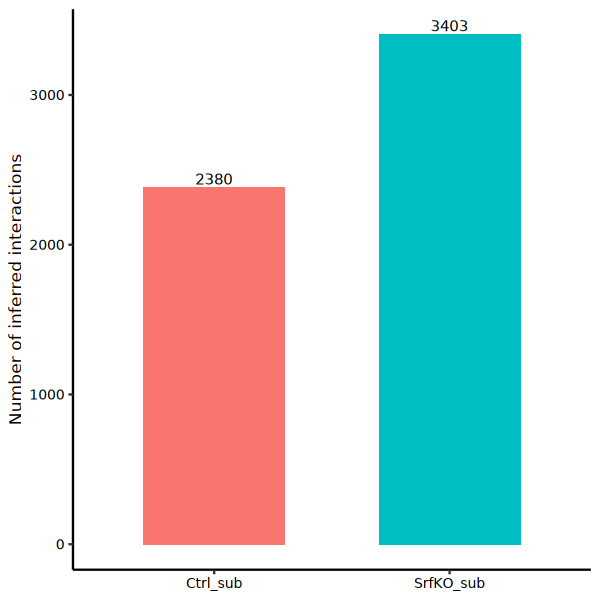

In [17]:
## Part I: Predict general principles of cell-cell communication.

saved <- options(repr.plot.width = 5, repr.plot.height = 5) # Make the plots bigger from here on out, save old options

compareInteractions(CCobjMerged_sub, show.legend=F, group=c(1,2))

options(saved) # restore old settings

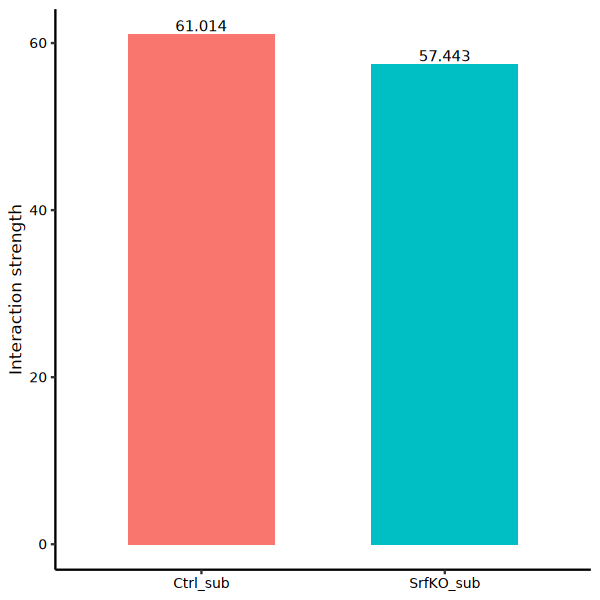

In [18]:
saved <- options(repr.plot.width = 5, repr.plot.height = 5) # Make the plots bigger from here on out, save old options

compareInteractions(CCobjMerged_sub, show.legend=F, group=c(1,2), measure="weight")

options(saved) # restore old settings

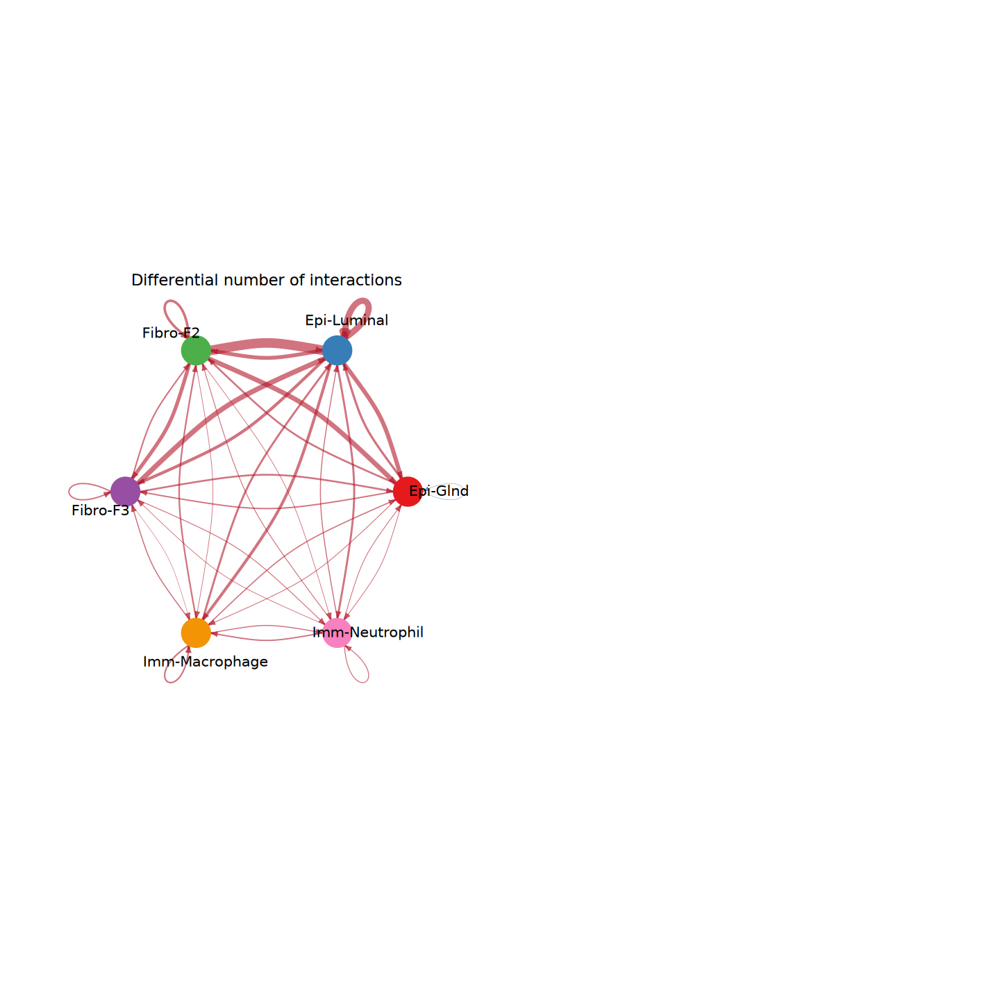

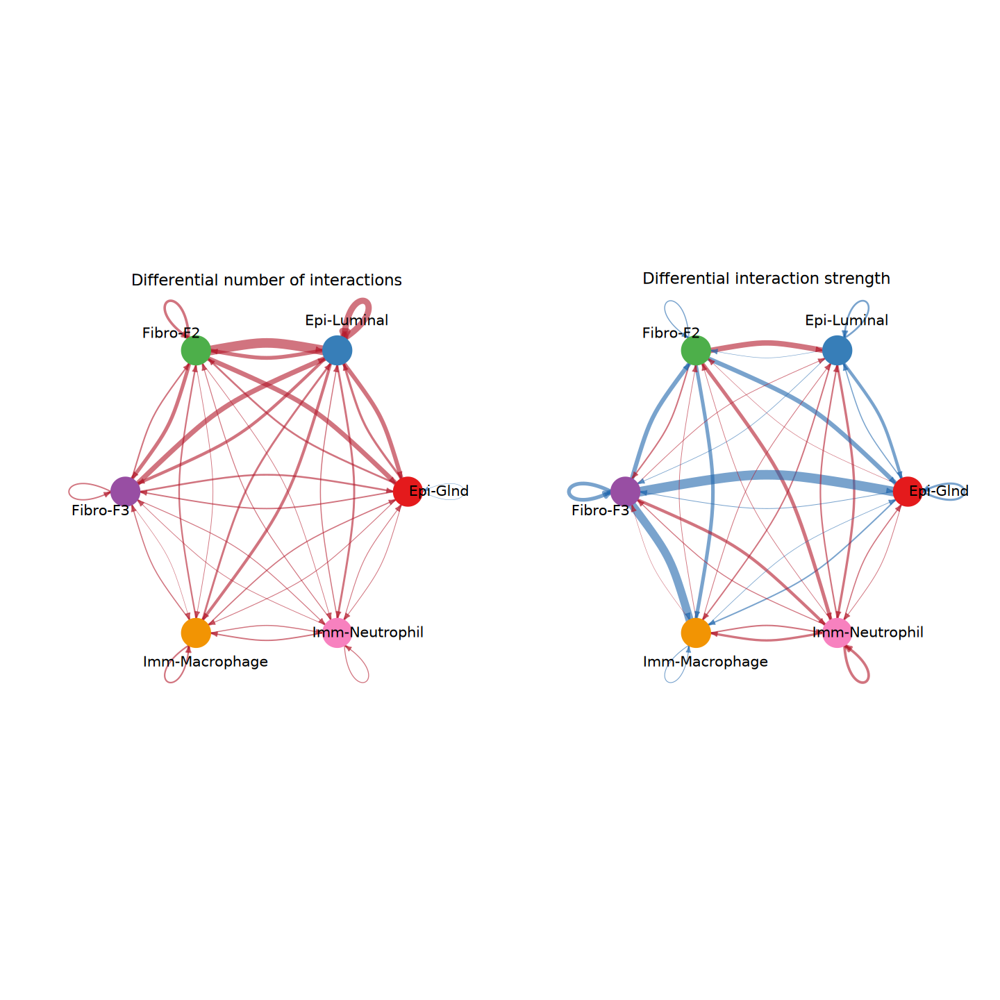

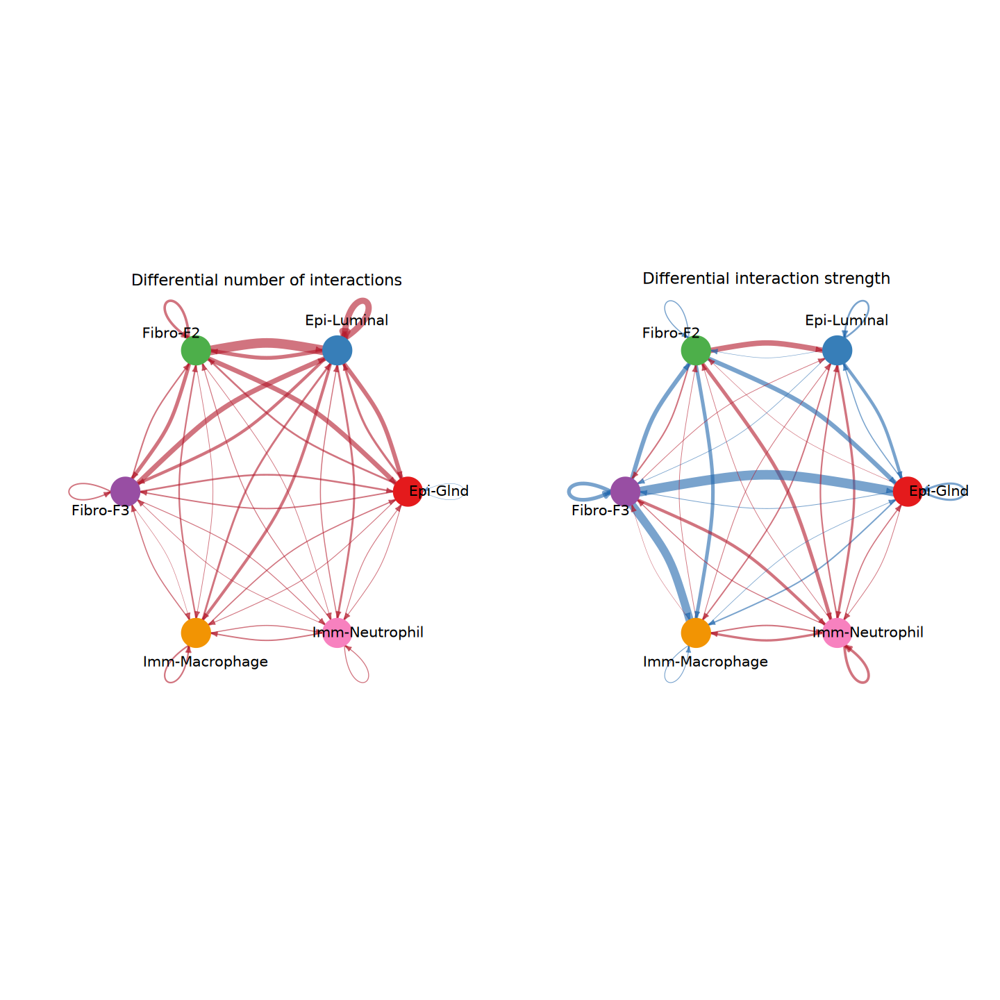

In [19]:
saved <- options(repr.plot.width = 12, repr.plot.height = 12) # Make the plots bigger from here on out, save old options

par(mfrow = c(1,2), xpd=TRUE)
netVisual_diffInteraction(CCobjMerged_sub, weight.scale = T)
netVisual_diffInteraction(CCobjMerged_sub, weight.scale = T, measure = "weight")

options(saved) # restore old settings

Do heatmap based on a merged object 




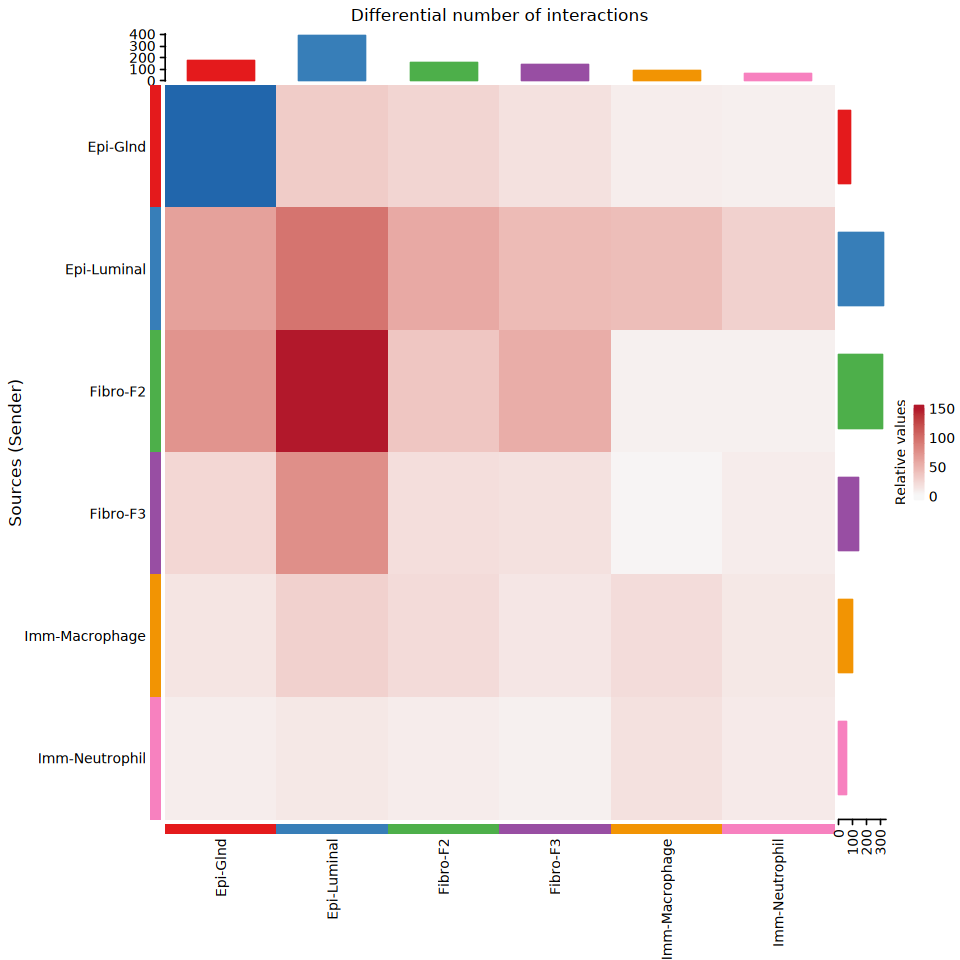

In [20]:
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

netVisual_heatmap(CCobjMerged_sub)

options(saved) # restore old settings

Do heatmap based on a merged object 




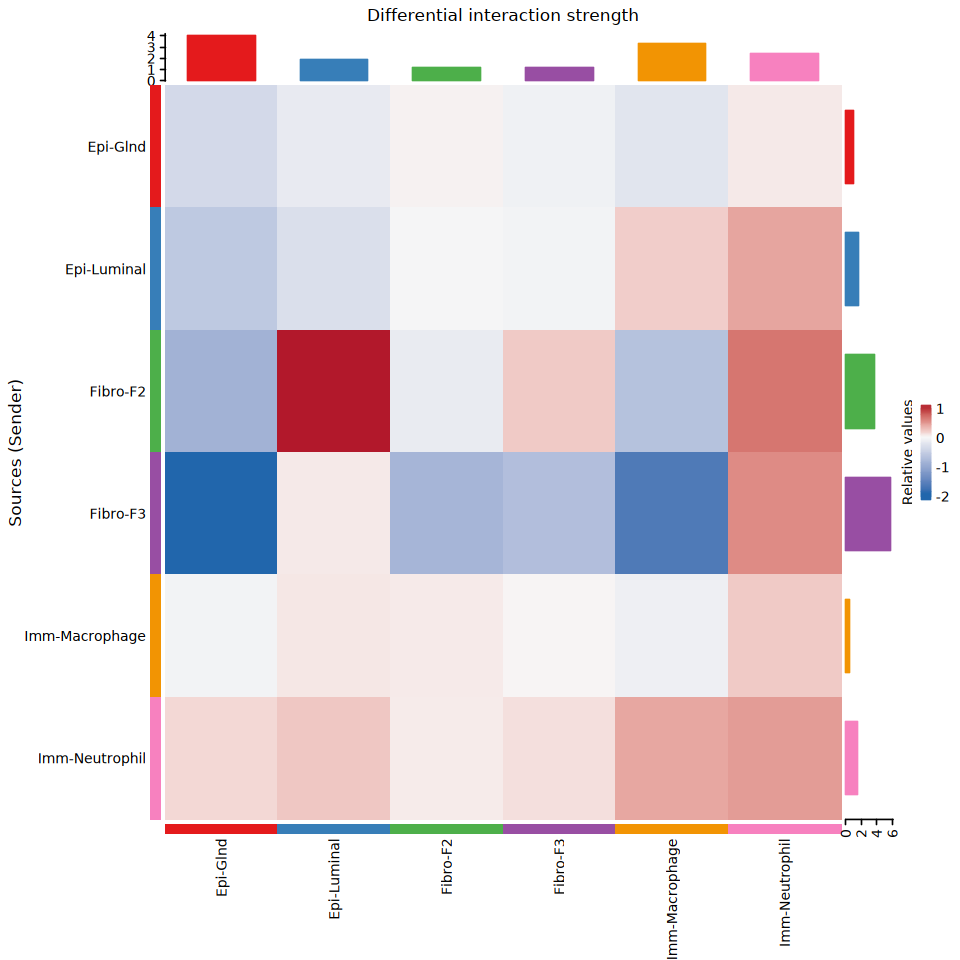

In [21]:
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

netVisual_heatmap(CCobjMerged_sub, measure="weight")

options(saved) # restore old settings

Do heatmap based on a merged object 




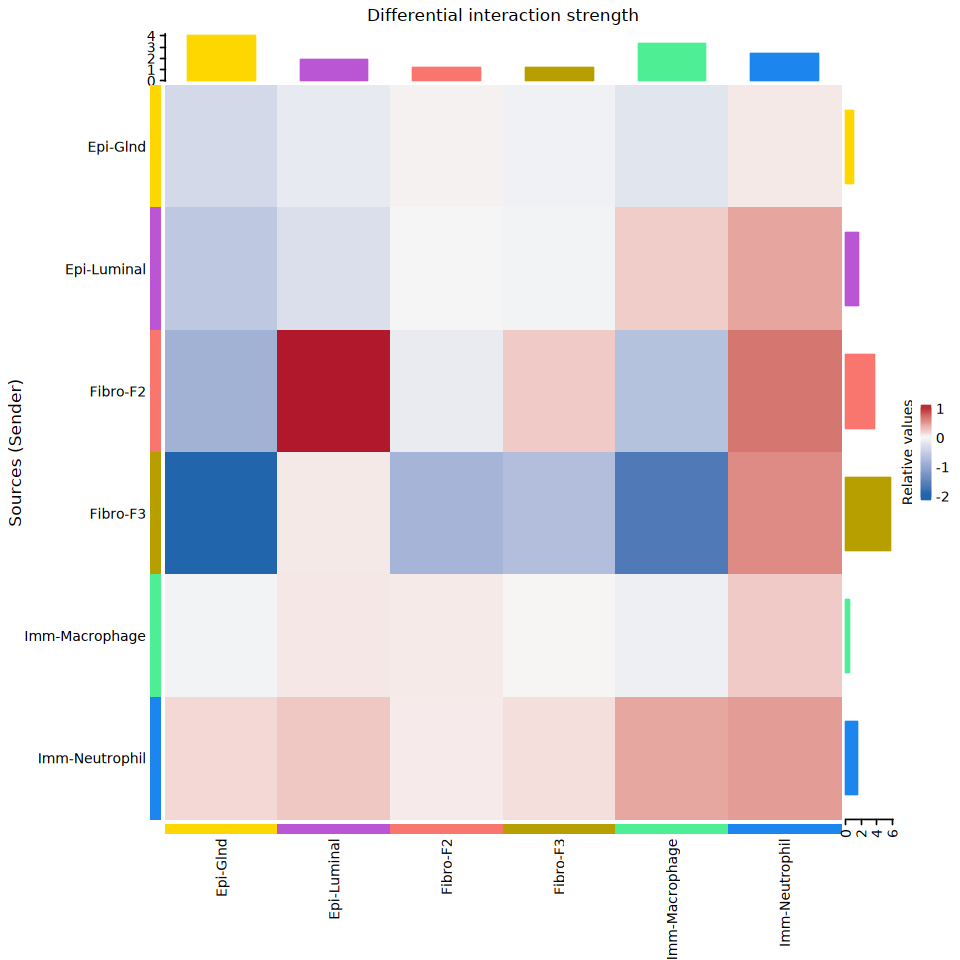

In [183]:
#adjust colors


my_color_palette = c("Epi-Glnd"="gold", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="#B79F00", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")


saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

netVisual_heatmap(CCobjMerged_sub, color.use = my_color_palette, measure="weight")

options(saved) # restore old settings


In [182]:
?netVisual_heatmap

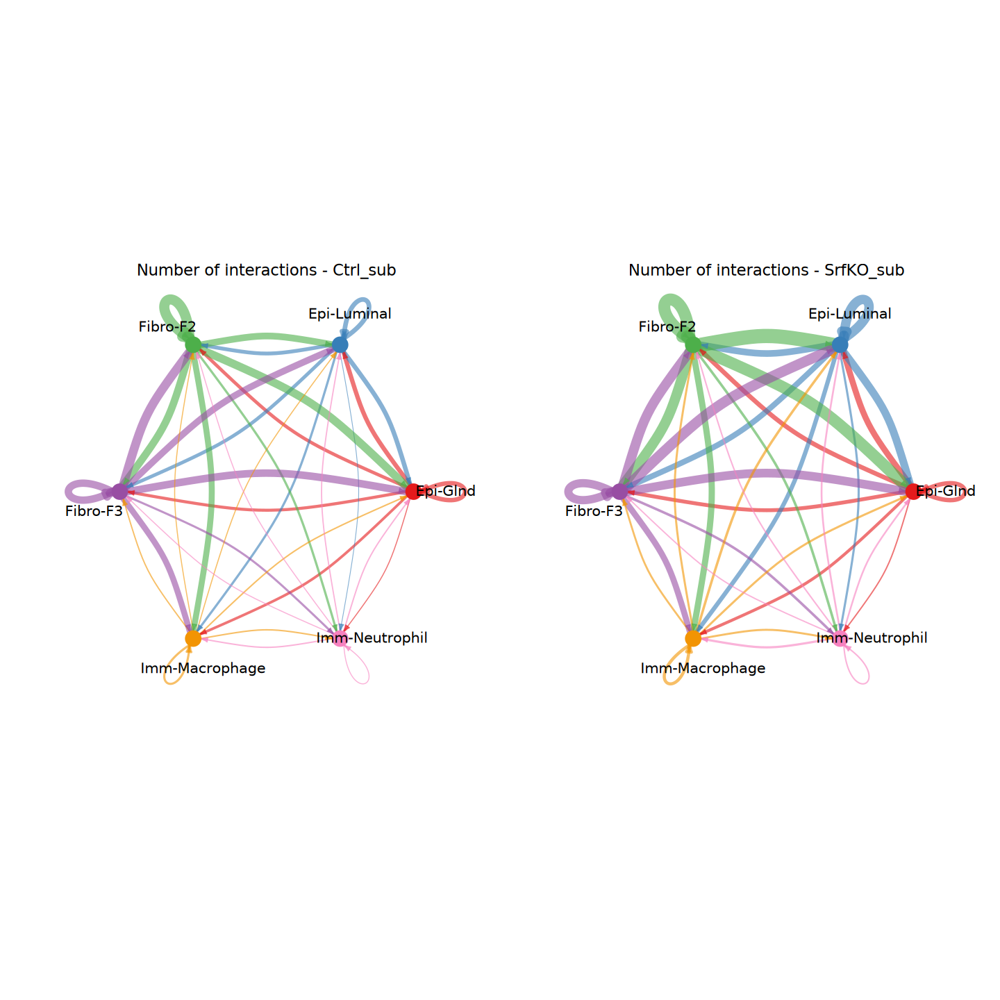

In [22]:
saved <- options(repr.plot.width = 12, repr.plot.height = 12) # Make the plots bigger from here on out, save old options

weight.max <- getMaxWeight(object.list_sub, attribute = c("idents","count"))
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list_sub)) {
  netVisual_circle(object.list_sub[[i]]@net$count, weight.scale = T, label.edge= F, edge.weight.max = weight.max[2], edge.width.max = 12, title.name = paste0("Number of interactions - ", names(object.list_sub)[i]))
}

options(saved) # restore old settings

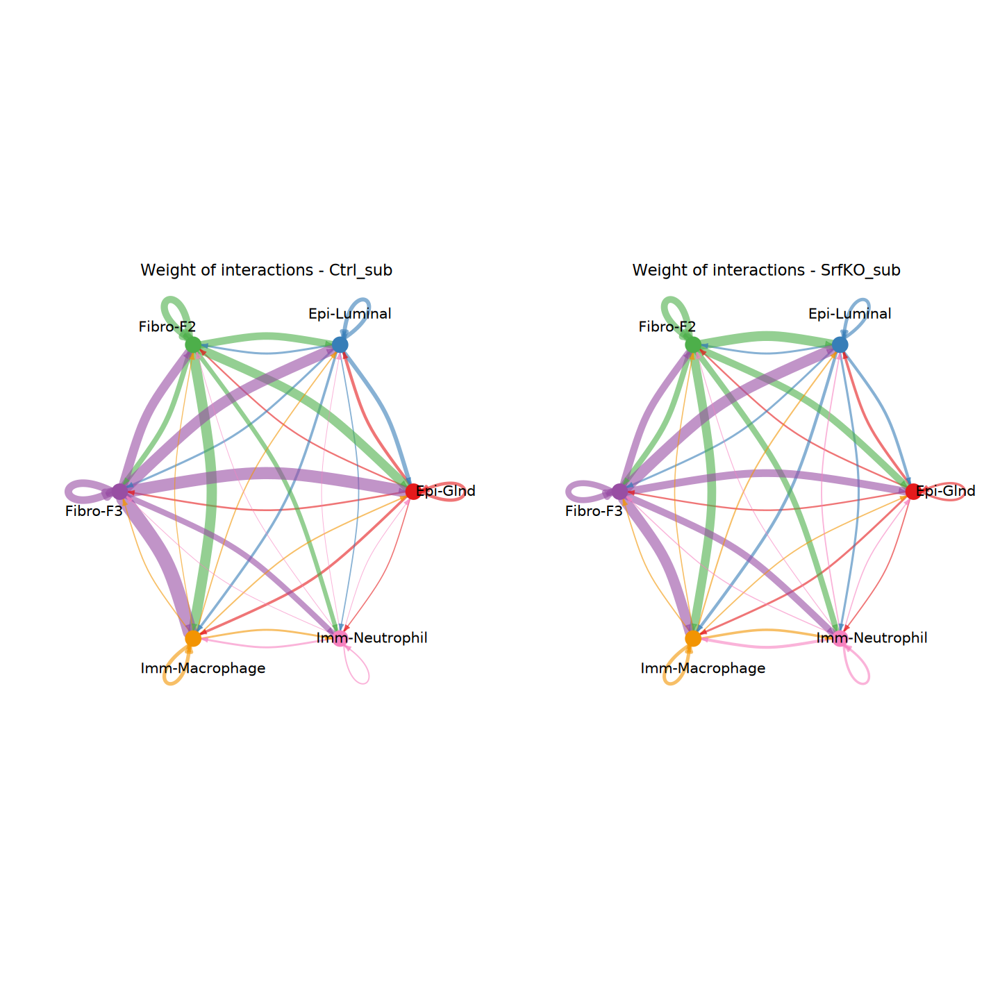

In [23]:
saved <- options(repr.plot.width = 12, repr.plot.height = 12) # Make the plots bigger from here on out, save old options

weight.max <- getMaxWeight(object.list_sub, attribute = c("idents","weight"))
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list_sub)) {
  netVisual_circle(object.list_sub[[i]]@net$weight, weight.scale = T, label.edge= F, edge.weight.max = weight.max[2], edge.width.max = 12, title.name = paste0("Weight of interactions - ", names(object.list_sub)[i]))
}

options(saved) # restore old settings

Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways

Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways



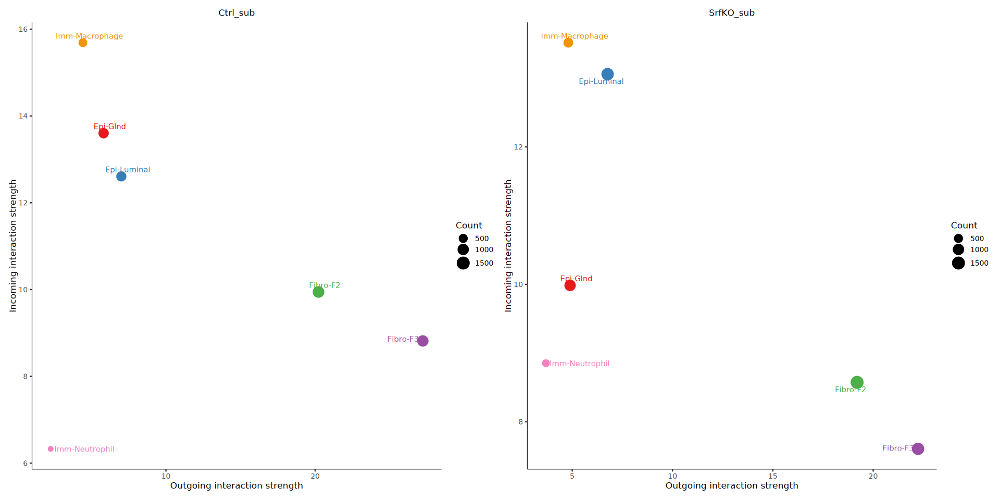

In [24]:
## compare major sources and targets in 2D space

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

num.link <- sapply(object.list_sub, function(x) {rowSums(x@net$count) + colSums(x@net$count)-diag(x@net$count)});
weight.MinMax <- c(min(num.link), max(num.link));
gg <- list();
for (i in 1:length(object.list_sub)) {
  gg[[i]] <- netAnalysis_signalingRole_scatter(object.list_sub[[i]], title=names(object.list_sub)[i], weight.MinMax=weight.MinMax);
}
patchwork::wrap_plots(plot=gg);

options(saved) # restore old settings



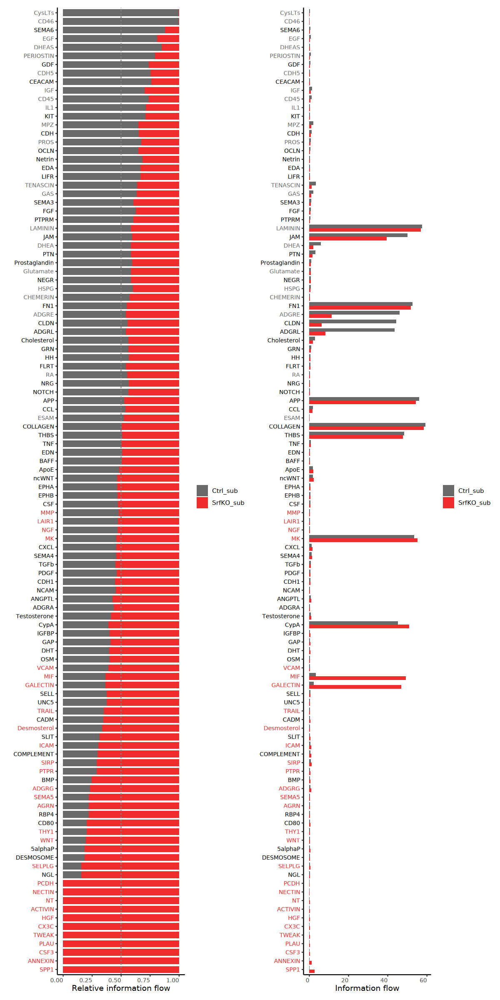

In [138]:
gg1 <- rankNet(CCobjMerged_sub, mode="comparison", stacked=T, do.stat=TRUE,color.use=c("dimgrey", "firebrick2"),);
gg2 <- rankNet(CCobjMerged_sub, mode="comparison", stacked=F, do.stat=TRUE,color.use=c("dimgrey", "firebrick2"),);

saved <- options(repr.plot.width = 10, repr.plot.height = 20) # Make the plots bigger from here on out, save old options

gg1+gg2

options(saved) #restore old settings


In [118]:
?rankNet

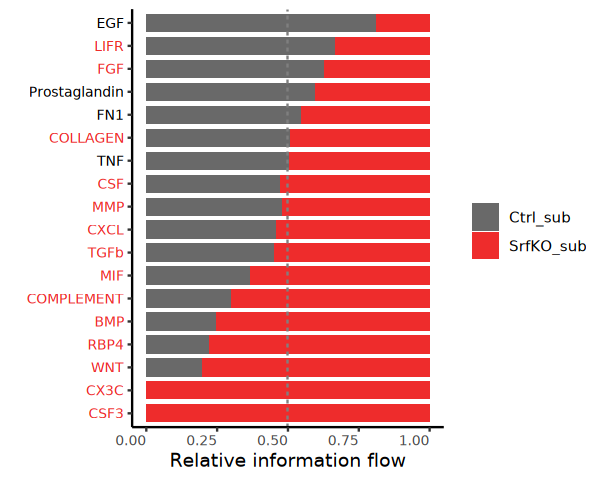

In [142]:
#Reduce list by selecting signaling types
gg1 <- rankNet(CCobjMerged_sub, mode="comparison", stacked=T, do.stat=TRUE, color.use=c("dimgrey", "firebrick2"),
               signaling = c("EGF", "COMPLEMENT", "MMP", "MIF", "LIFR", "FGF", "Prostaglandin", "FN1", "COLLAGEN", "TNF", 
                             "CSF", "CXCL", "TGFb", "WNT", "CX3C", "CSF3", "RBP4", "BMP"))

saved <- options(repr.plot.width = 5, repr.plot.height = 4) # Make the plots bigger from here on out, save old options

gg1

options(saved) #restore old settings


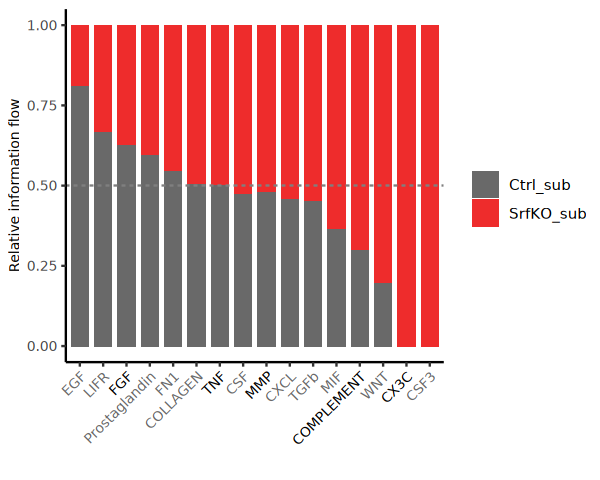

In [141]:
#flip
gg1 <- rankNet(CCobjMerged_sub, mode="comparison", stacked=T, do.stat=TRUE, color.use=c("dimgrey", "firebrick2"), do.flip = F,
               signaling = c("EGF", "COMPLEMENT", "MMP", "MIF", "LIFR", "FGF", "Prostaglandin", "FN1", "COLLAGEN", "TNF", 
                             "CSF", "CXCL", "TGFb", "WNT", "CX3C", "CSF3"))

saved <- options(repr.plot.width = 5, repr.plot.height = 4) # Make the plots bigger from here on out, save old options

gg1

options(saved) #restore old settings


In [28]:
levels(CCobjSrfKO_sub@idents);

#1 'Epi-Glnd'
#2 'Epi-Luminal'
#3 'Fibro-F2'
#4 'Fibro-F3'
#5 'Imm-Macrophage'
#6 'Imm-Neutrophil'

[1] "Epi-Glnd"       "Epi-Luminal"    "Fibro-F2"       "Fibro-F3"      
[5] "Imm-Macrophage" "Imm-Neutrophil"

Comparing communications on a merged object 




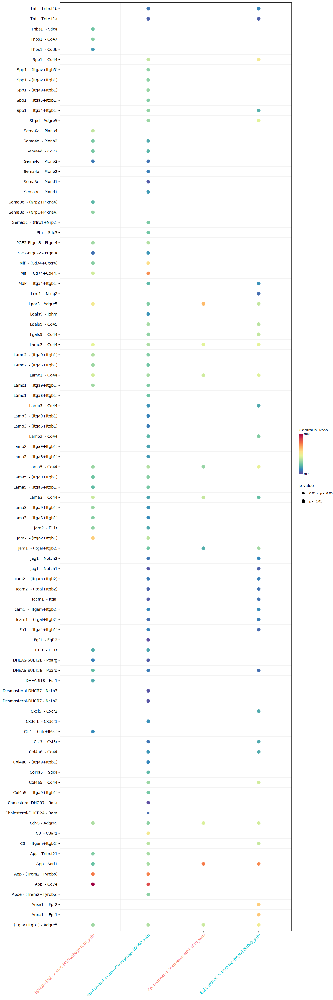

In [29]:
## Part III: Identify the upgulated and down-regulated signaling ligand-receptor pairs.
## NOTE FROM SARA -- Most plots in part III require specifying the source & target cell types ... 
# I'm only making example views here, you'll want to modify the sources.use and targets.use parameters according to your interests.

saved <- options(repr.plot.width = 10, repr.plot.height = 30) # Make the plots bigger from here on out, save old options

## identify the up- and down-regulated signaling ligand-receptor pairs based on communication probabilties

netVisual_bubble(CCobjMerged_sub, sources.use=2, targets.use=c(5:6), comparison=c(1,2), angle.x=45);

options(saved) #restore old settings


Comparing communications on a merged object 




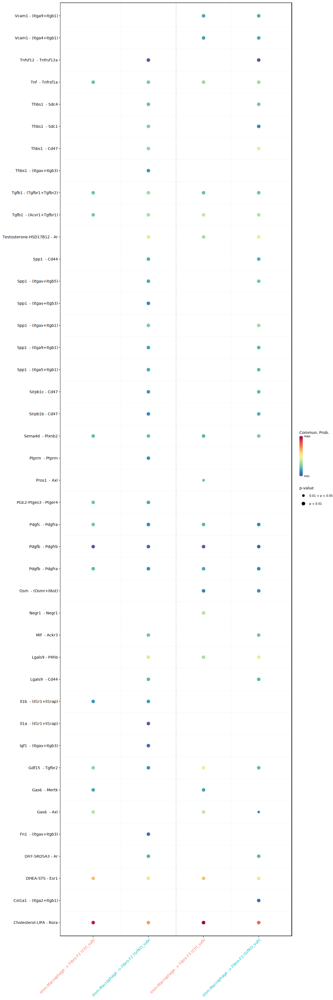

In [30]:
#Confirmed that it matches the full set - try one more just to be safe
saved <- options(repr.plot.width = 10, repr.plot.height = 30) # Make the plots bigger from here on out, save old options

## identify the up- and down-regulated signaling ligand-receptor pairs based on communication probabilties

netVisual_bubble(CCobjMerged_sub, sources.use=5, targets.use=c(3:4), comparison=c(1,2), angle.x=45);

options(saved) #restore old settings


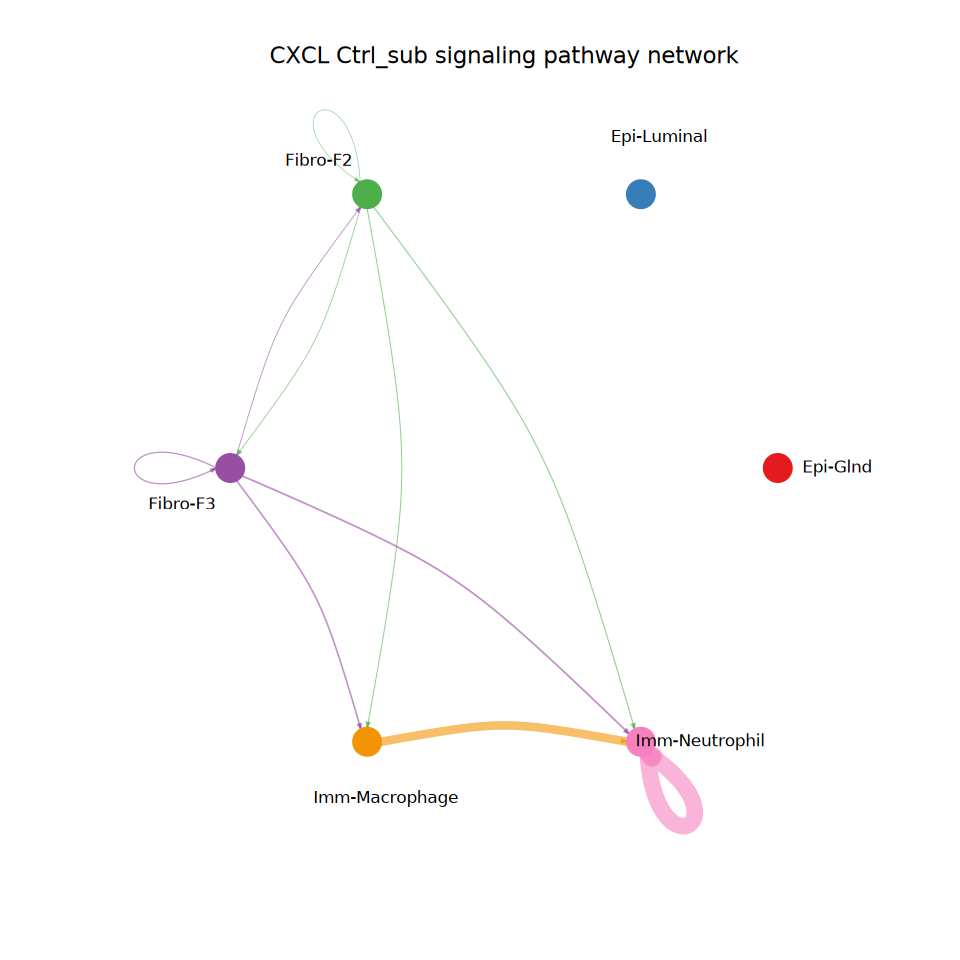

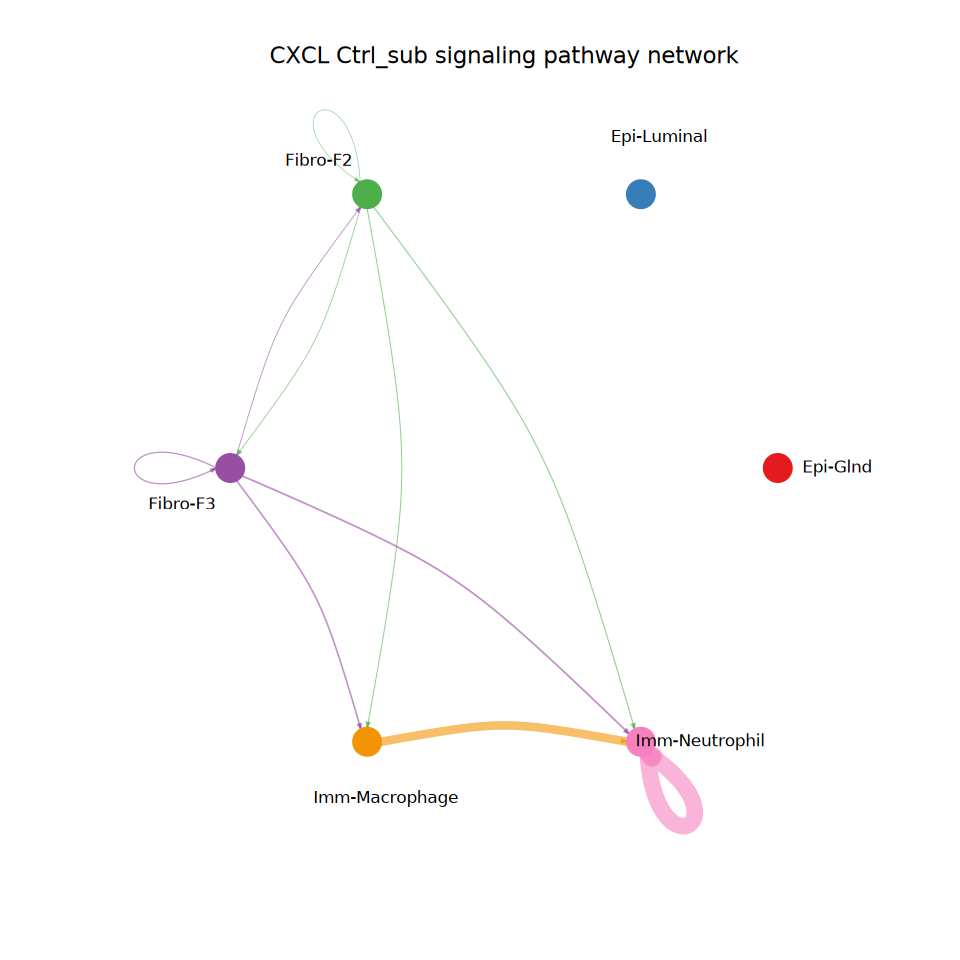

In [31]:
## Part IV: Visually compare cell-cell communication using Hierarchy plot, Circle plot or Chord diagram.
## NOTE FROM SARA -- Most plots in part IV require specifying pathways and sometimes also the source & target cell types; you'll want to modify the signaling/sources.use/targets.use parameters according to your interests.

saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

pathways.show <- c("CXCL"); 
weight.max <- getMaxWeight(object.list_sub, slot.name=c("netP"), attribute=pathways.show);
par(mfrow=c(1,1), xpd=TRUE);
netVisual_aggregate(object.list_sub[[1]], signaling=pathways.show, layout="circle", edge.weight.max=weight.max[1], edge.width.max=10, signaling.name=paste(pathways.show, names(object.list_sub)[1]));

options(saved) #restore old settings

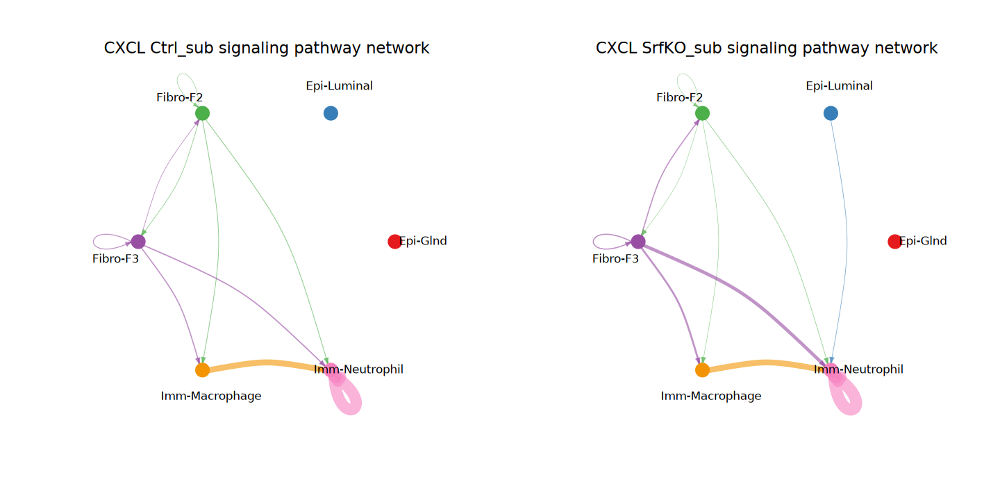

In [32]:
## Part IV: Visually compare cell-cell communication using Hierarchy plot, Circle plot or Chord diagram.
## NOTE FROM SARA -- Most plots in part IV require specifying pathways and sometimes also the source & target cell types; you'll want to modify the signaling/sources.use/targets.use parameters according to your interests.

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("CXCL") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

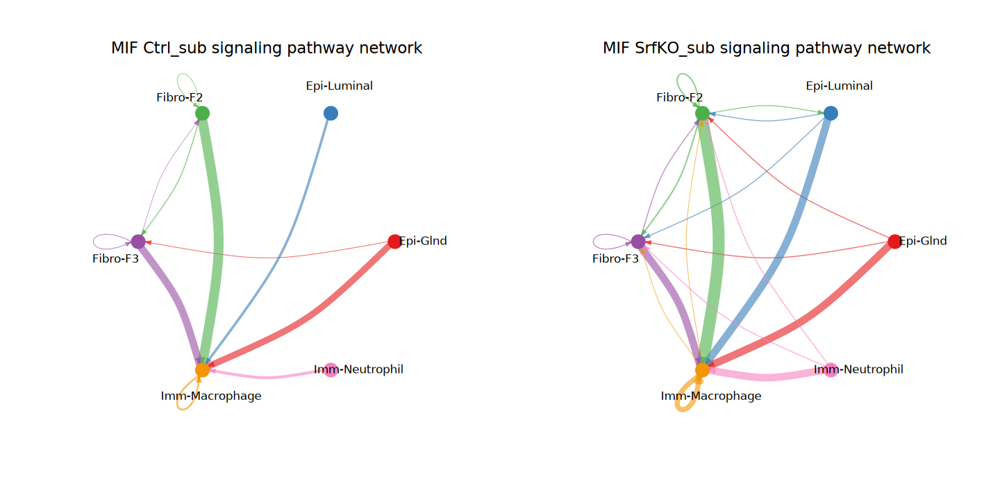

In [33]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("MIF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

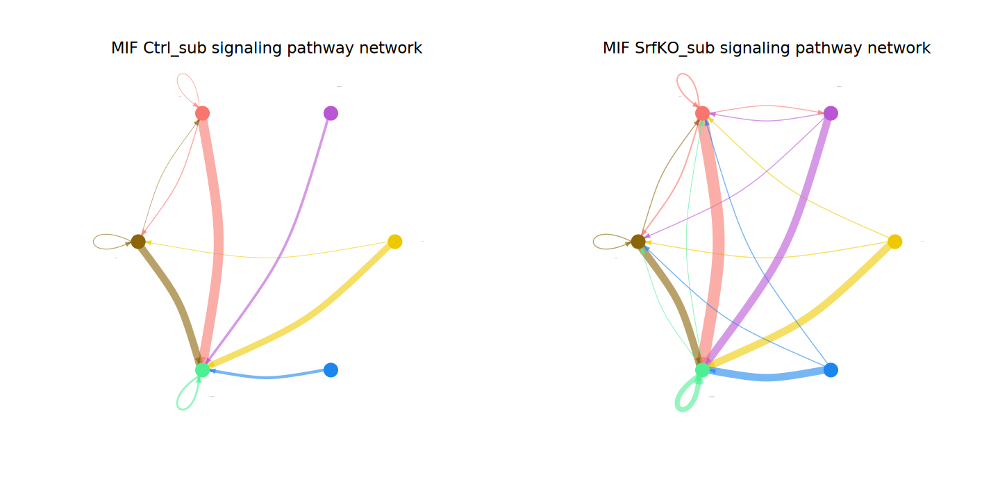

In [184]:
#adjust colors, remove labels by making them tiny

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

my_color_palette = c("Epi-Glnd"="gold2", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="darkgoldenrod4", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")

pathways.show <- c("MIF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], 
                      edge.width.max = 10, color.use = my_color_palette,   vertex.label.cex = 0.000000001,
                      signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

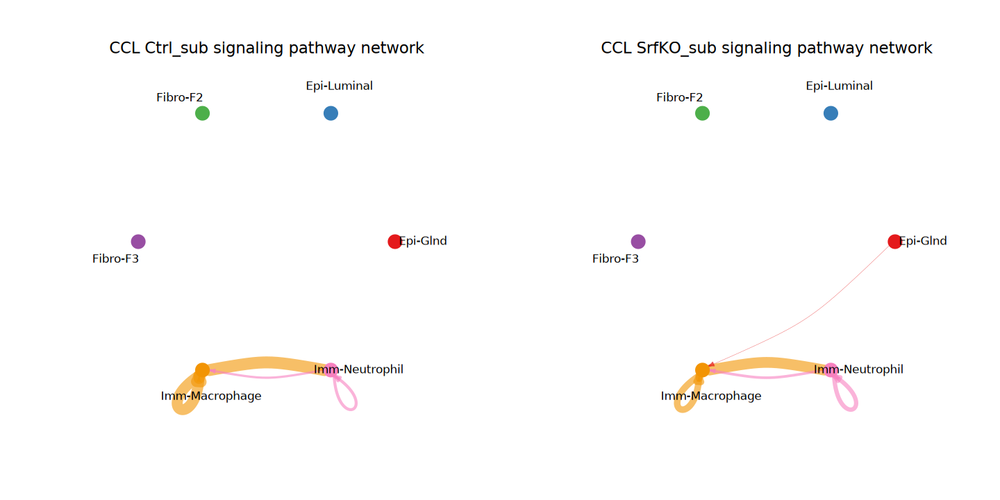

In [34]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("CCL") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

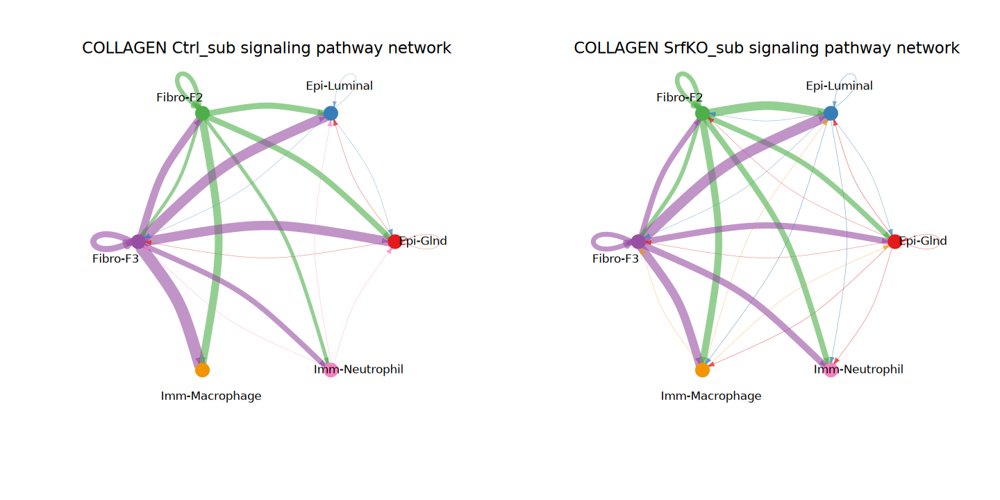

In [35]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("COLLAGEN") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

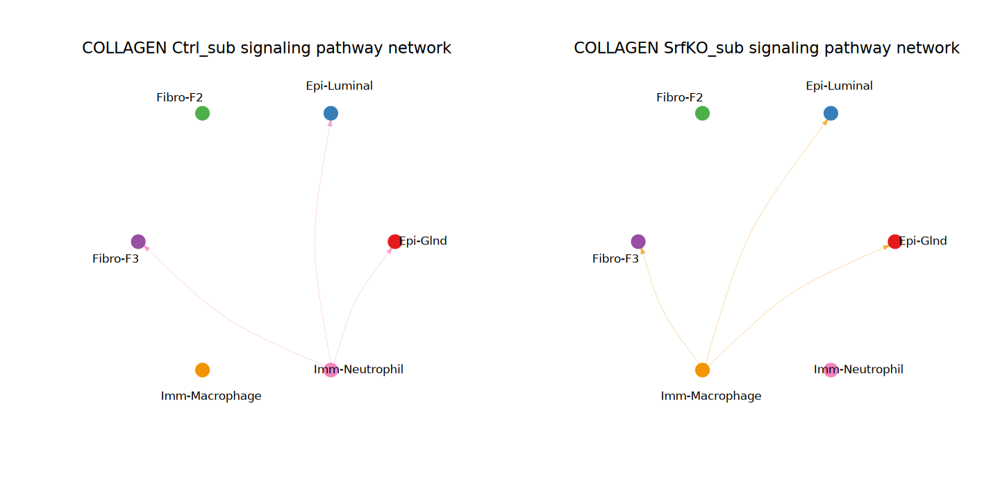

In [86]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

#show only signal coming from macrophages and neutrophils

pathways.show <- c("COLLAGEN") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, sources.use = c("Imm-Macrophage", "Imm-Neutrophil"), layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings



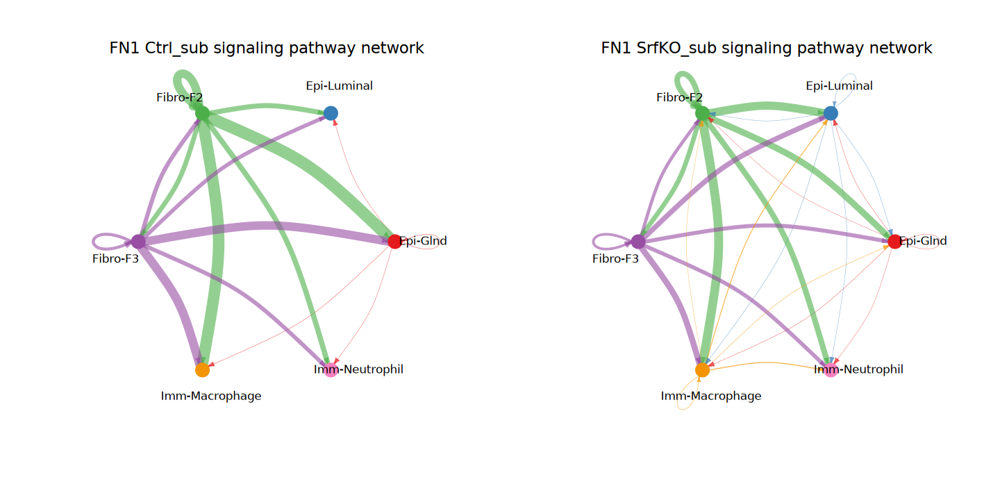

In [83]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("FN1") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

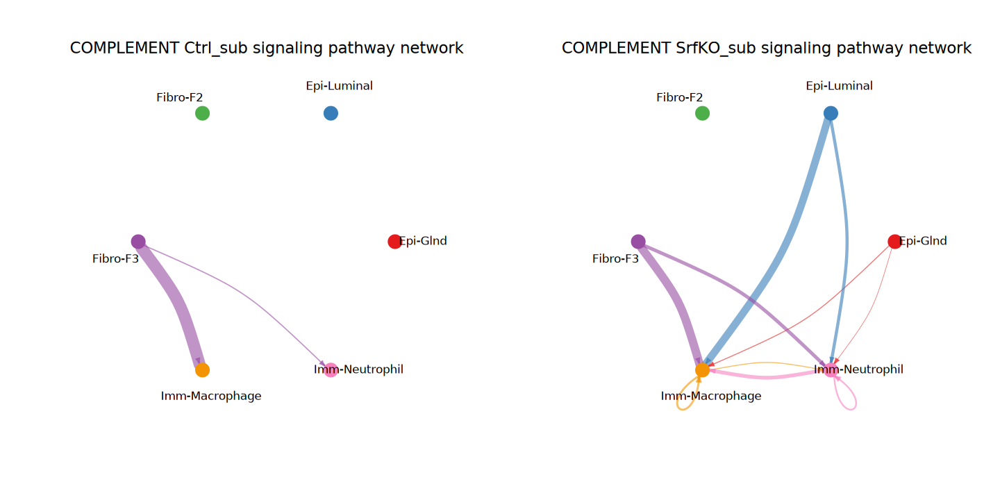

In [144]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("COMPLEMENT") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

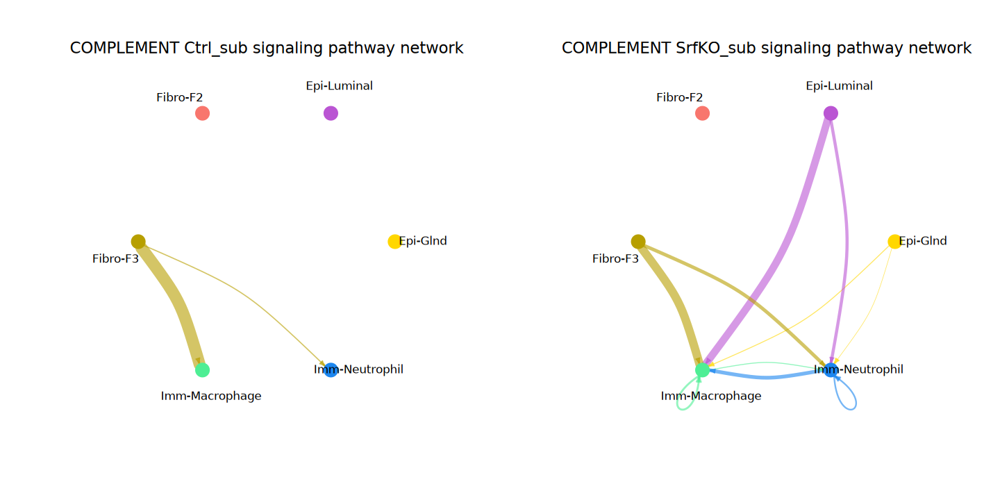

In [159]:
#adjust colors

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

my_color_palette = c("Epi-Glnd"="gold", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="#B79F00", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")

pathways.show <- c("COMPLEMENT") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, color.use = my_color_palette, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

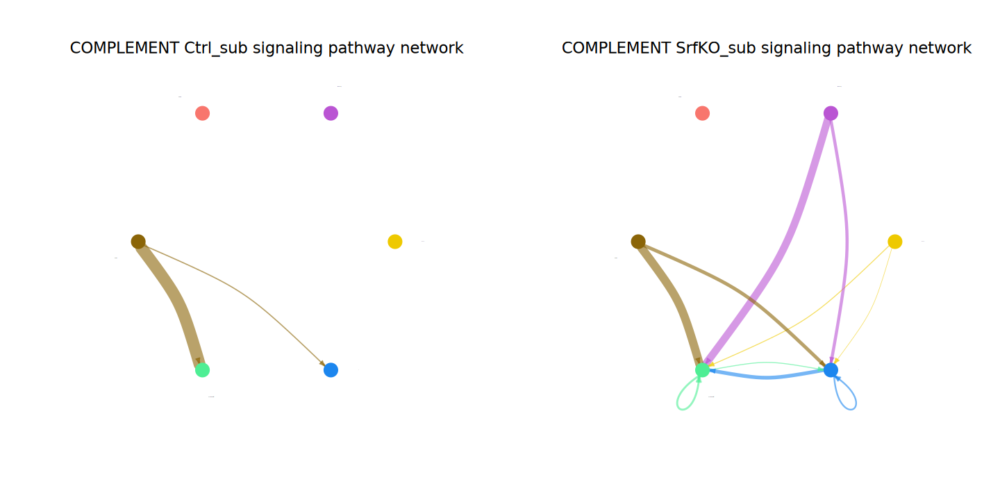

In [180]:
#adjust colors, remove labels by making them tiny

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

my_color_palette = c("Epi-Glnd"="gold2", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="darkgoldenrod4", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")

pathways.show <- c("COMPLEMENT") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], 
                      edge.width.max = 10, color.use = my_color_palette,   vertex.label.cex = 0.000000001,
                      signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

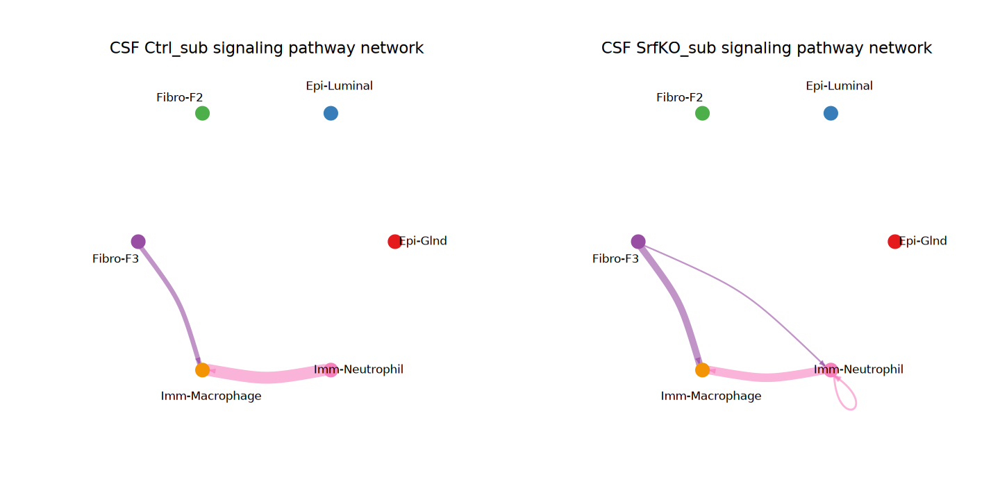

In [37]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("CSF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

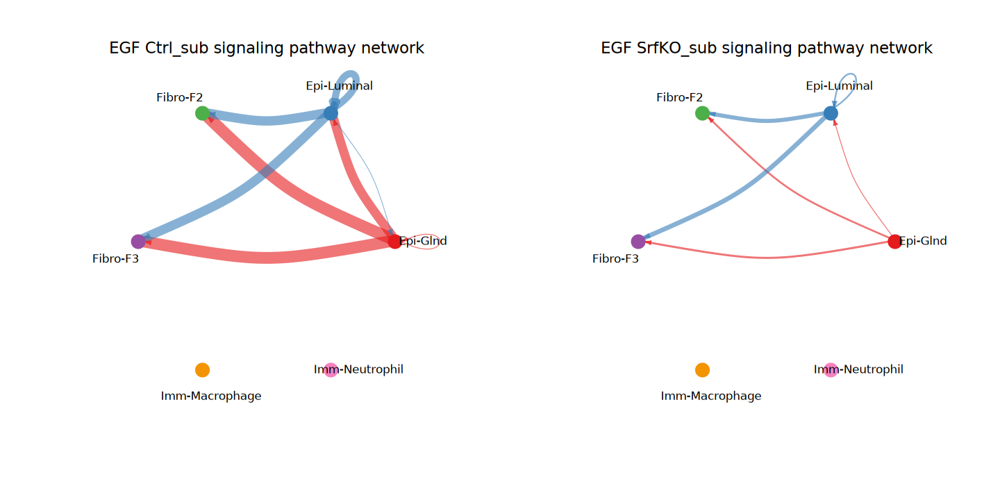

In [38]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("EGF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

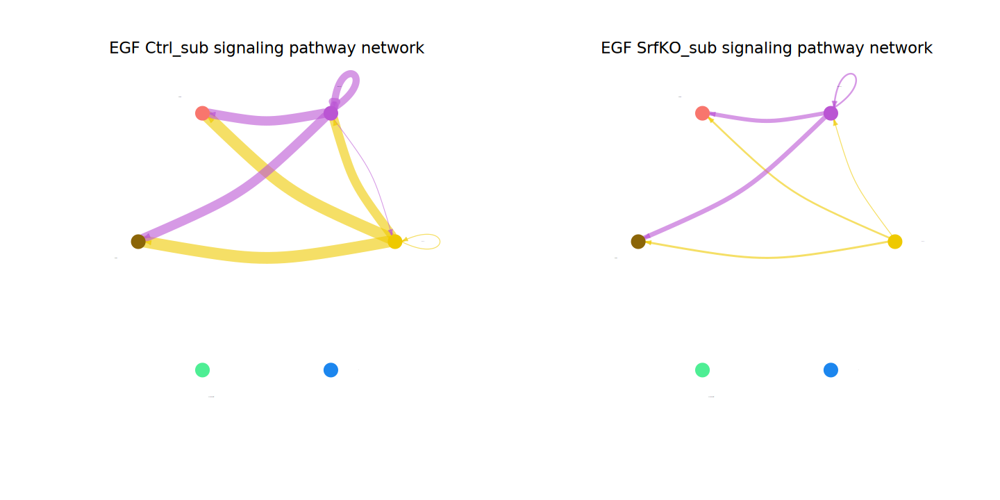

In [181]:
#adjust colors, remove labels by making them tiny

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

my_color_palette = c("Epi-Glnd"="gold2", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="darkgoldenrod4", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")

pathways.show <- c("EGF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], 
                      edge.width.max = 10, color.use = my_color_palette,   vertex.label.cex = 0.000000001,
                      signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

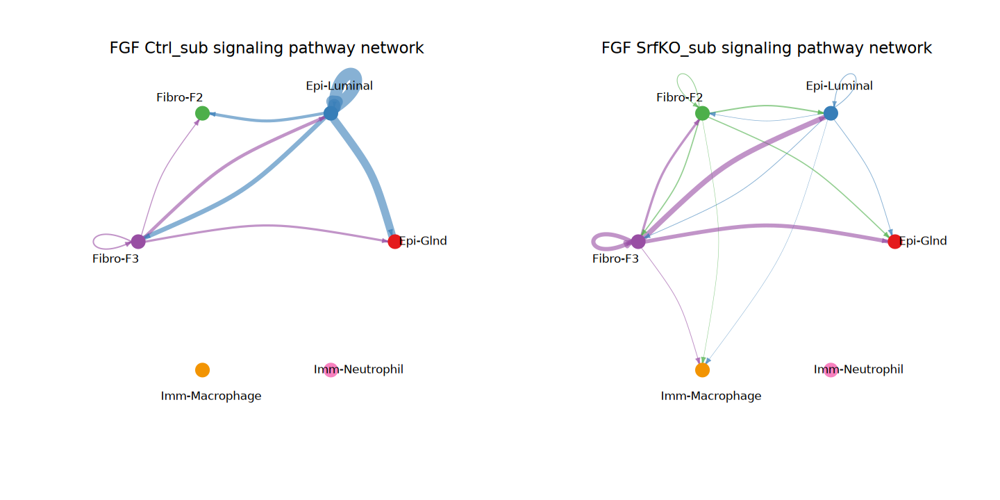

In [39]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("FGF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

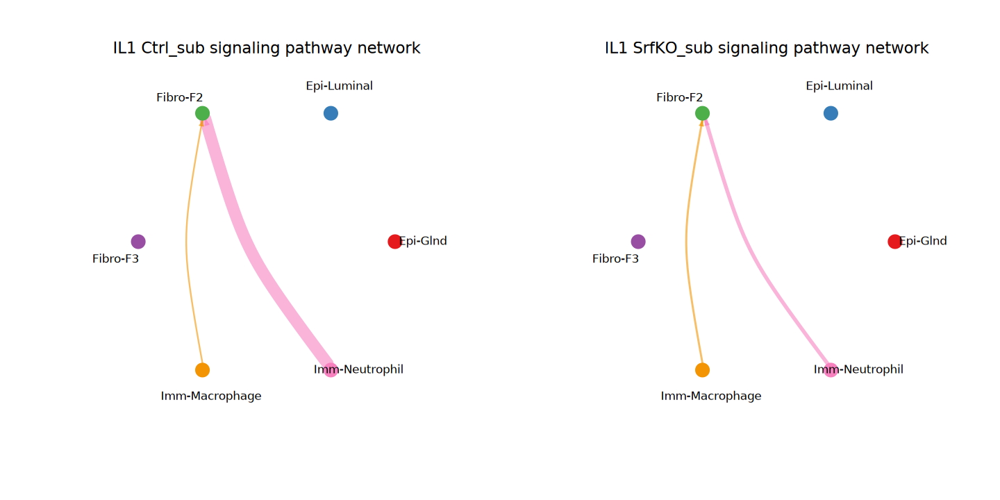

In [40]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("IL1") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings


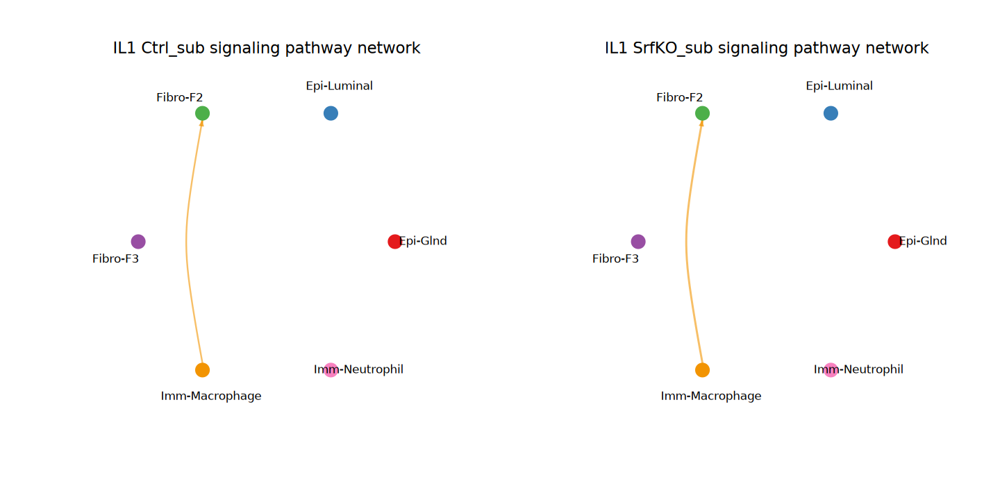

In [85]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

#Show only signal coming from macrophages

pathways.show <- c("IL1") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, sources.use = "Imm-Macrophage", signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings


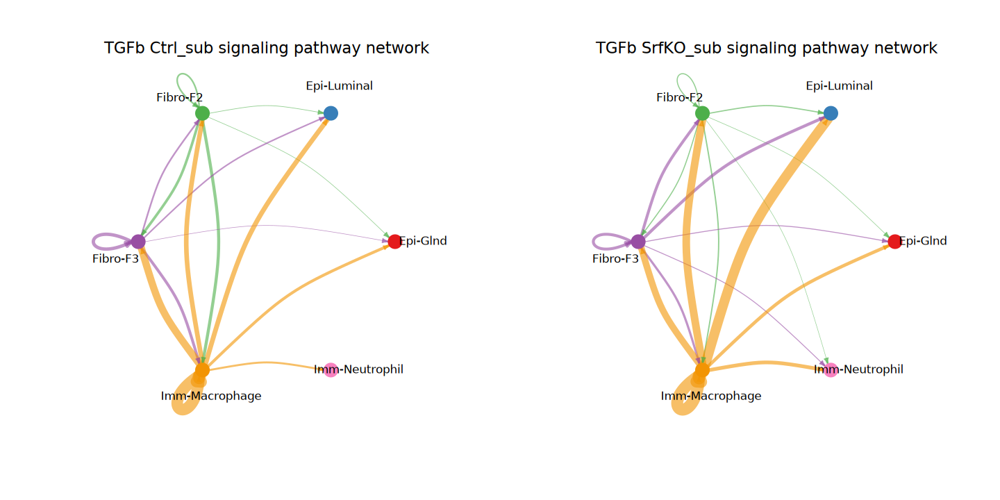

In [41]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("TGFb") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings


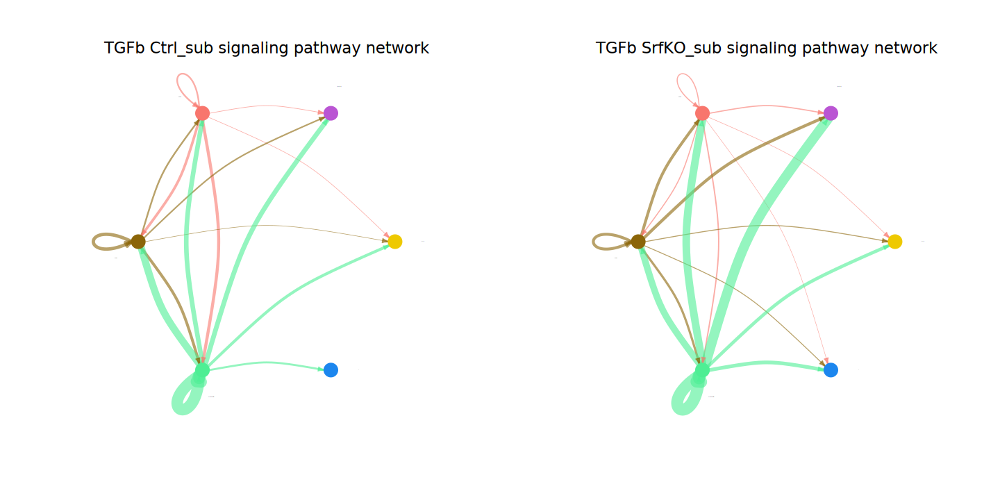

In [179]:
#adjust colors, remove labels by making them tiny

saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

my_color_palette = c("Epi-Glnd"="gold2", "Epi-Luminal"="mediumorchid", "Fibro-F2"="#F8766D", "Fibro-F3"="darkgoldenrod4", "Imm-Macrophage"="seagreen2", "Imm-Neutrophil"="dodgerblue2")

pathways.show <- c("TGFb") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], 
                      edge.width.max = 10, color.use = my_color_palette,   vertex.label.cex = 0.000000001,
                      signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings

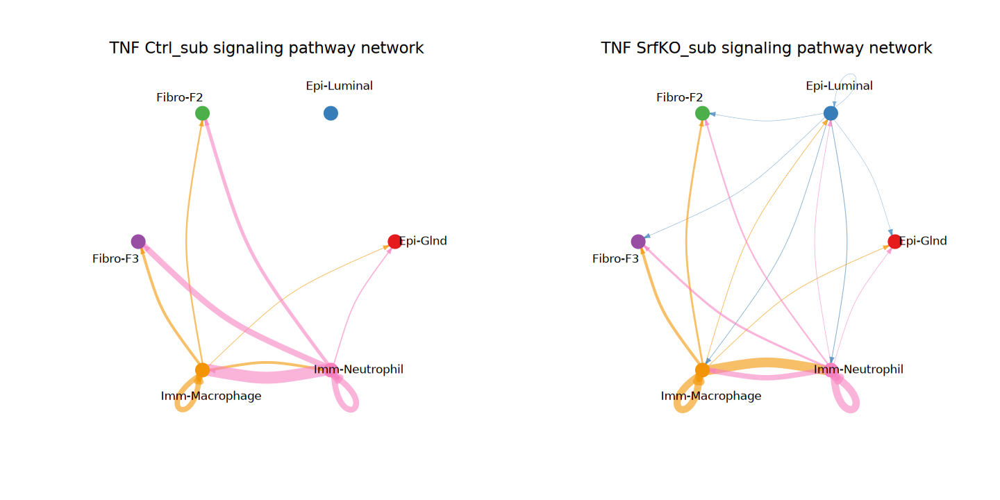

In [42]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("TNF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings


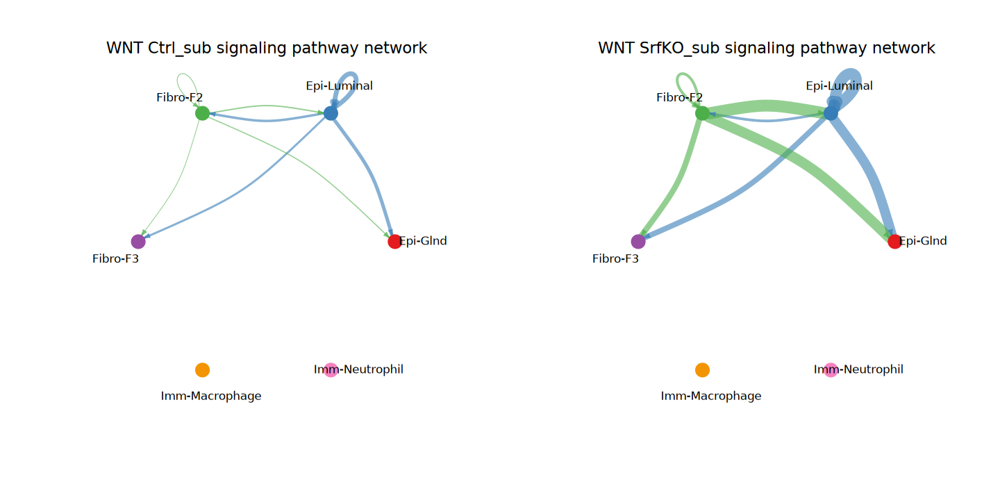

In [43]:
saved <- options(repr.plot.width = 12, repr.plot.height = 6) # Make the plots bigger from here on out, save old options

pathways.show <- c("WNT") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow = c(1,2), xpd=TRUE)
for (i in 1:length(object.list)) {
  netVisual_aggregate(object.list_sub[[i]], signaling = pathways.show, layout = "circle", edge.weight.max = weight.max[1], edge.width.max = 10, signaling.name = paste(pathways.show, names(object.list_sub)[i]))
}

options(saved) #restore old settings


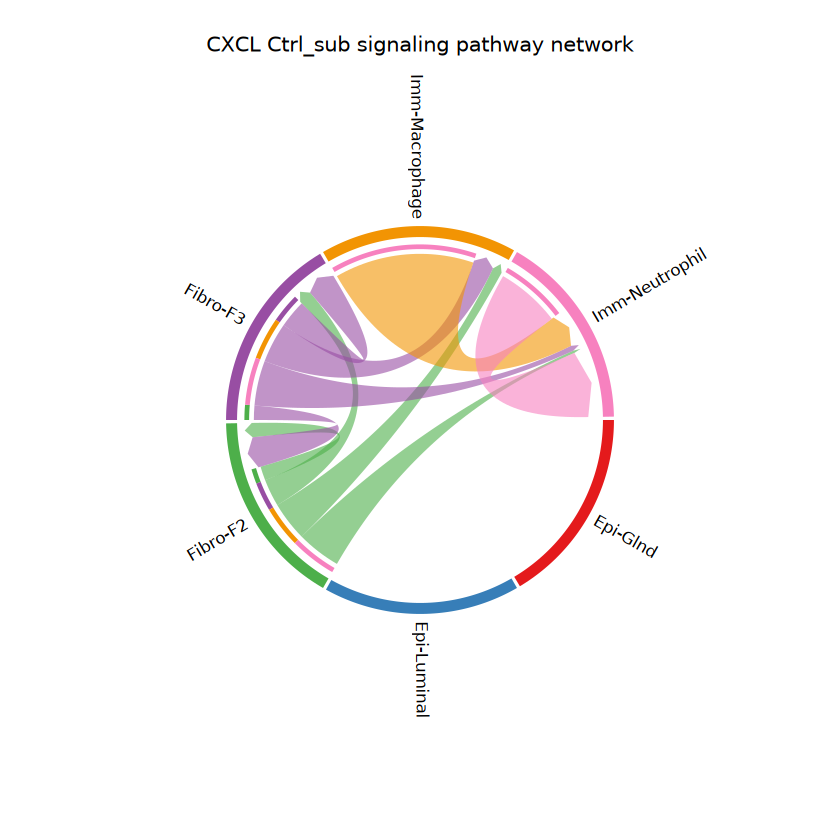

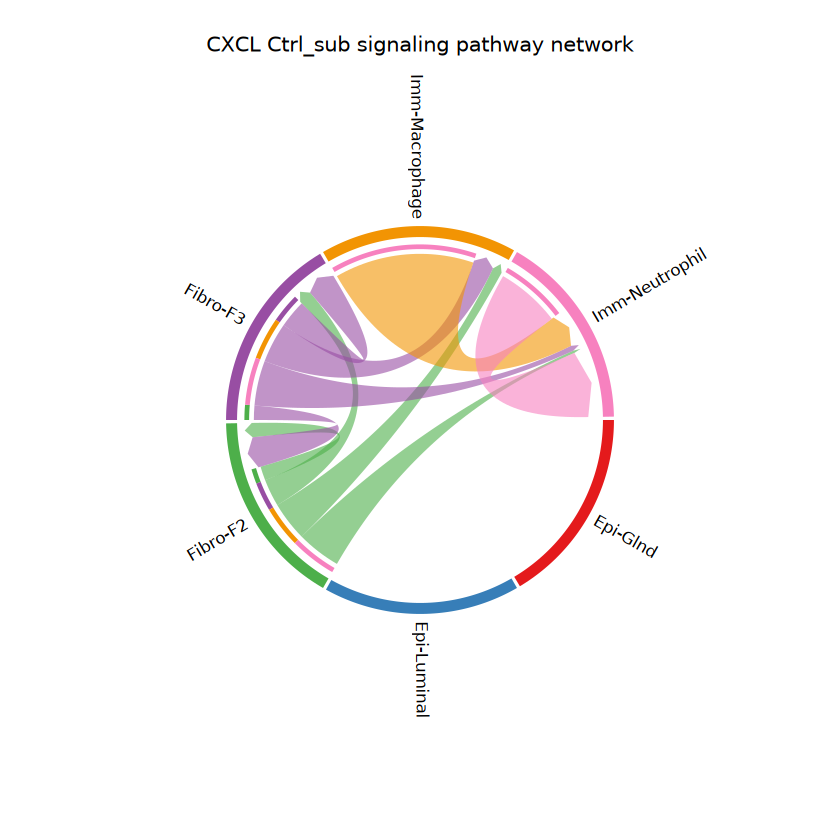

In [44]:
pathways.show <- c("CXCL") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow=c(1,1), xpd=TRUE);
netVisual_aggregate(object.list_sub[[1]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[1]));


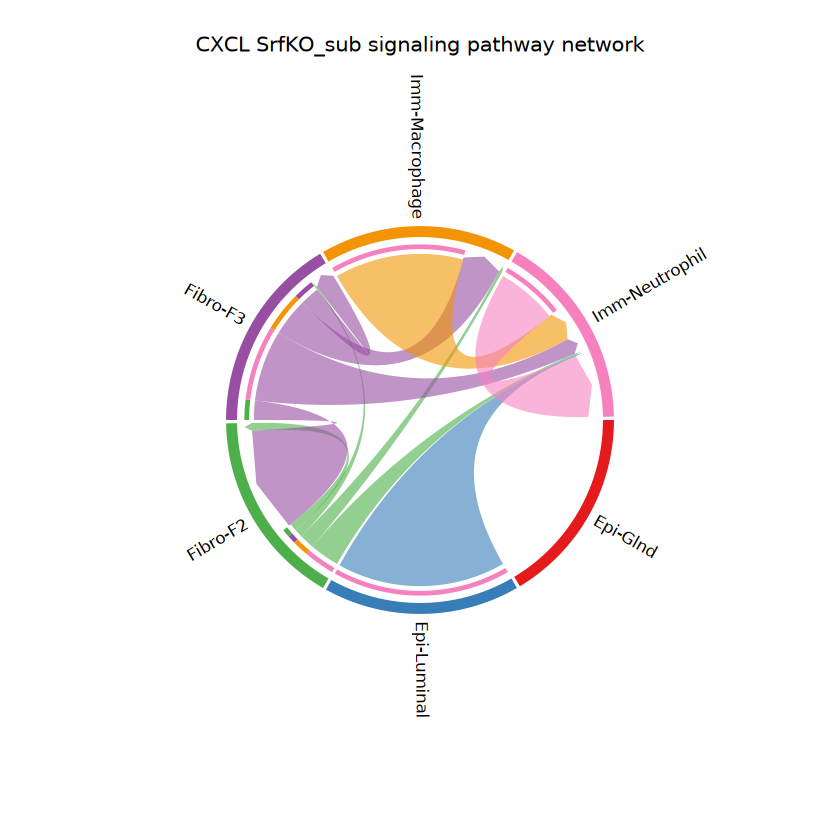

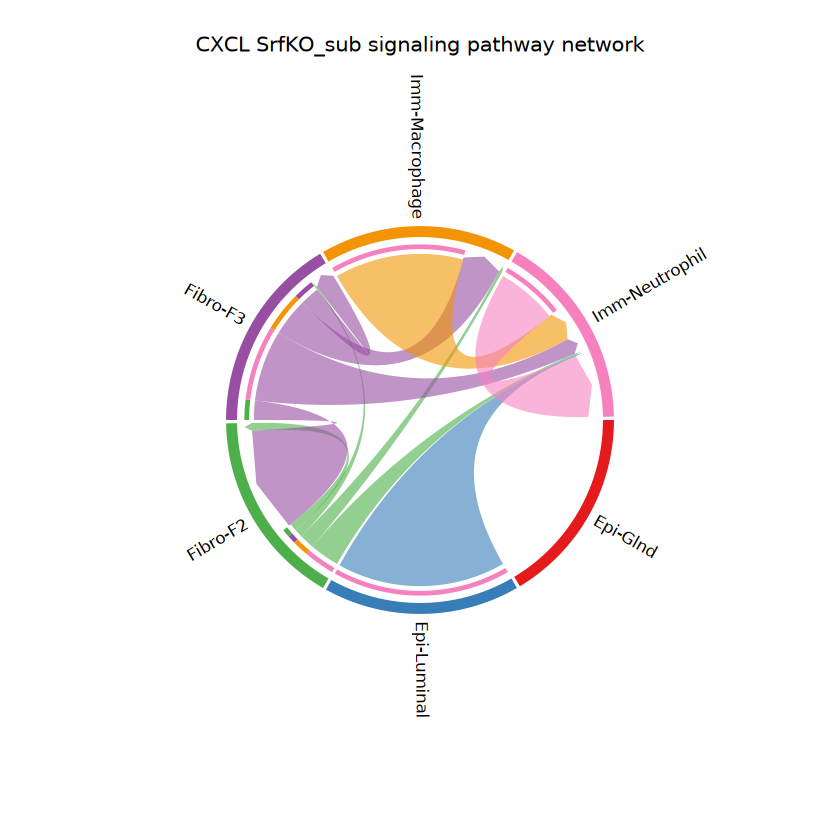

In [45]:
netVisual_aggregate(object.list_sub[[2]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[2]));

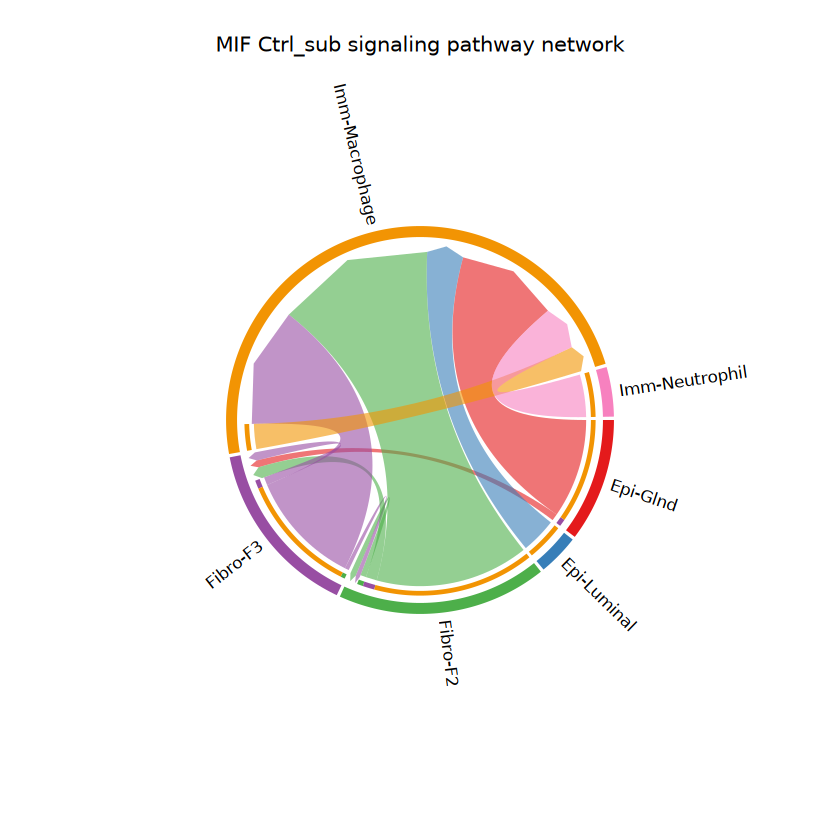

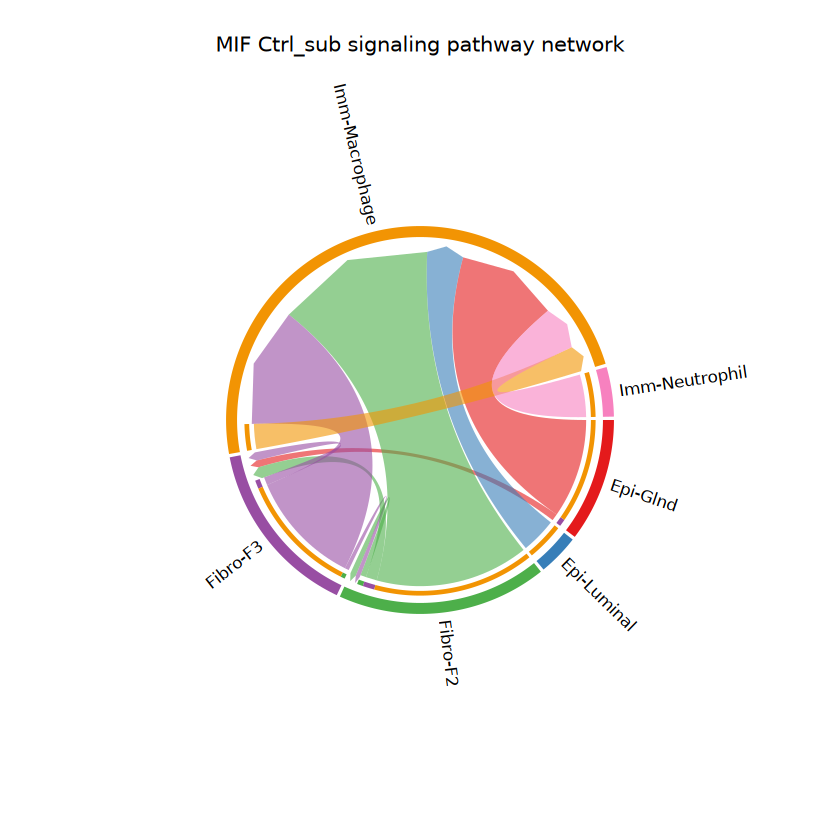

In [46]:
pathways.show <- c("MIF") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow=c(1,1), xpd=TRUE);
netVisual_aggregate(object.list_sub[[1]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[1]));


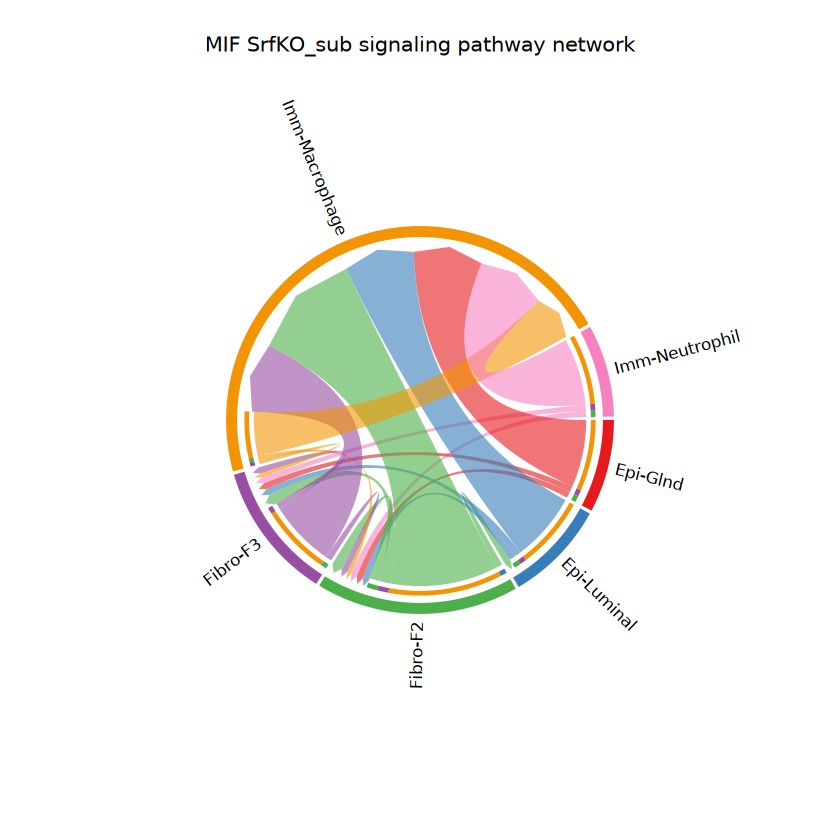

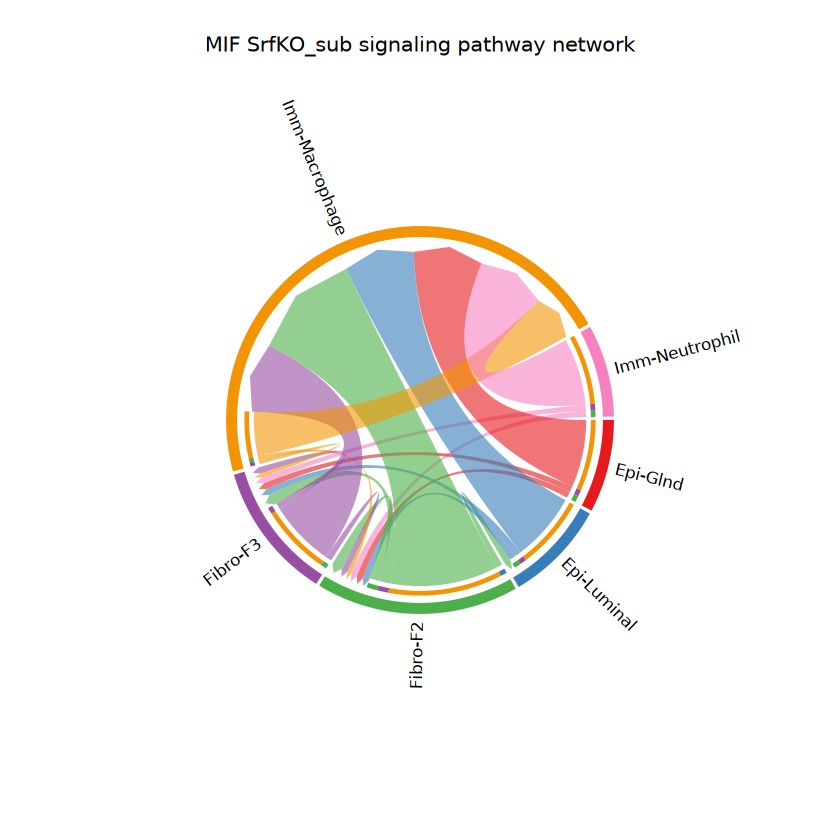

In [47]:
netVisual_aggregate(object.list_sub[[2]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[2]));

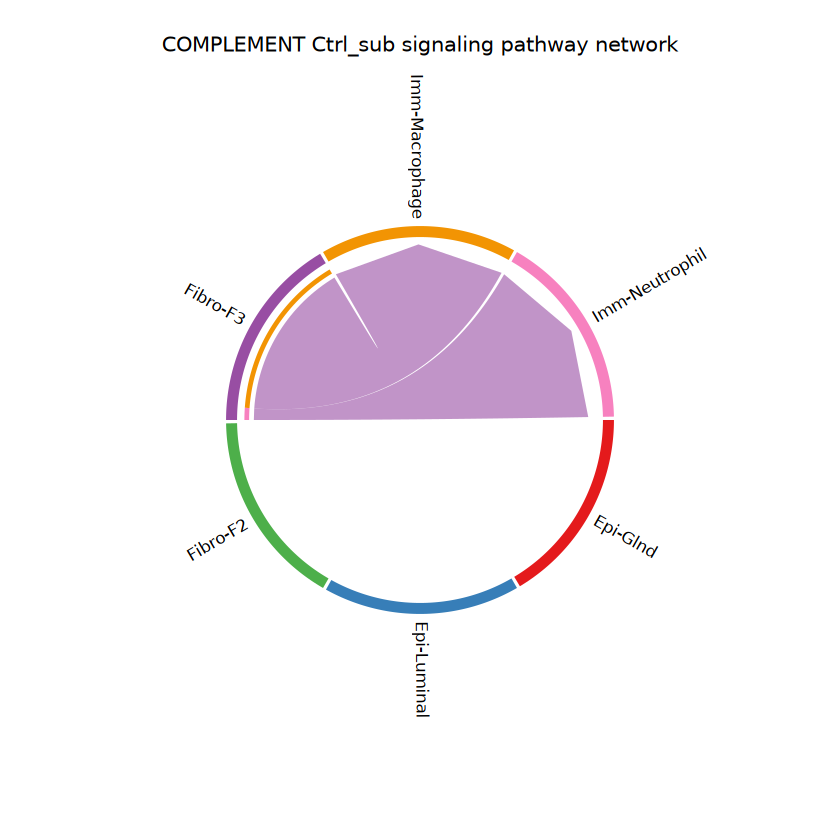

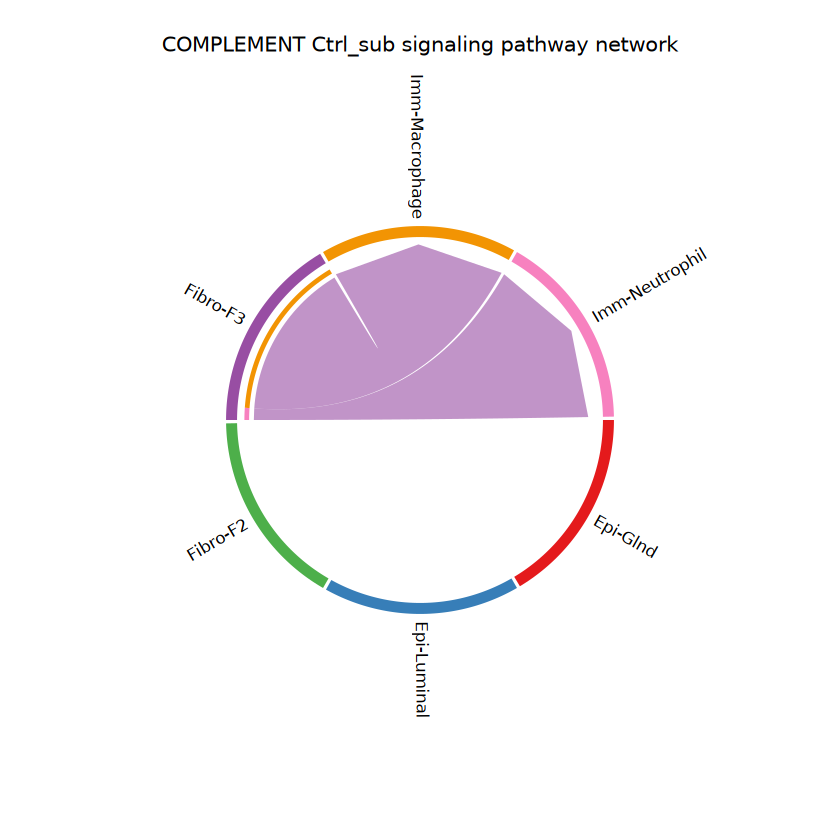

In [48]:
pathways.show <- c("COMPLEMENT") 
weight.max <- getMaxWeight(object.list_sub, slot.name = c("netP"), attribute = pathways.show) # control the edge weights across different datasets
par(mfrow=c(1,1), xpd=TRUE);
netVisual_aggregate(object.list_sub[[1]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[1]));


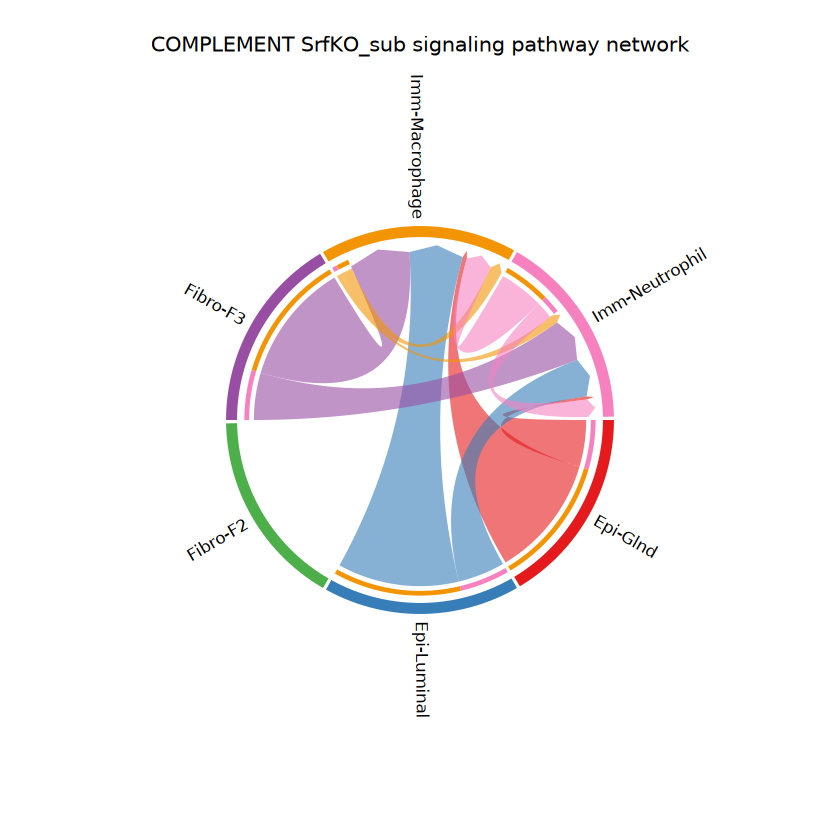

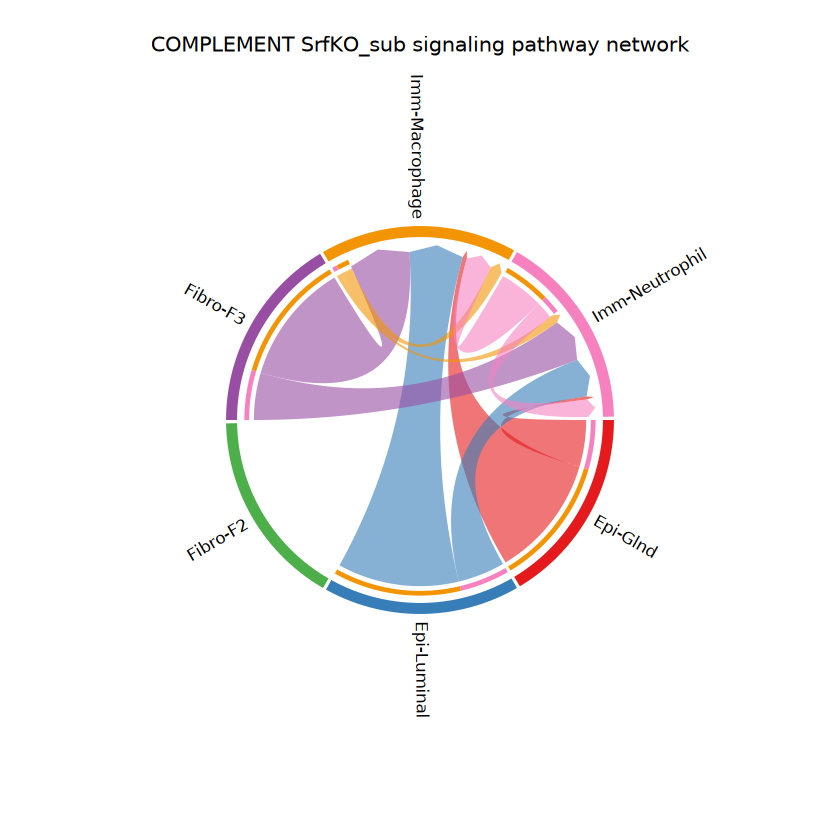

In [49]:
netVisual_aggregate(object.list_sub[[2]], signaling=pathways.show, layout="chord", signaling.name=paste(pathways.show, names(object.list_sub)[2]));

In [50]:
# All the signaling pathways showing significant communications can be accessed by
CCobjSrfKO_sub@netP$pathways

[1] "COLLAGEN"      "LAMININ"       "MK"            "APP"          
  [5] "FN1"           "CypA"          "MIF"           "THBS"         
  [9] "GALECTIN"      "JAM"           "ADGRE"         "ADGRL"        
 [13] "CLDN"          "SPP1"          "ncWNT"         "DHEA"         
 [17] "ApoE"          "Cholesterol"   "PTN"           "CXCL"         
 [21] "CCL"           "SEMA4"         "TENASCIN"      "ANNEXIN"      
 [25] "SIRP"          "ICAM"          "ANGPTL"        "COMPLEMENT"   
 [29] "GAS"           "MPZ"           "Testosterone"  "ADGRG"        
 [33] "GRN"           "TGFb"          "TNF"           "Prostaglandin"
 [37] "CDH"           "IGF"           "Glutamate"     "SEMA3"        
 [41] "NEGR"          "EPHA"          "HSPG"          "EPHB"         
 [45] "CD45"          "SLIT"          "SELL"          "FGF"          
 [49] "CDH1"          "CADM"          "CD80"          "PROS"         
 [53] "PDGF"          "BMP"           "HH"            "IGFBP"        
 [57] "GAP"           "PTPR"          "SELPLG"        "CSF"          
 [61] "DHT"           "FLRT"          "5alphaP"       "ADGRA"        
 [65] "EGF"           "WNT"           "PTPRM"         "THY1"         
 [69] "PERIOSTIN"     "MMP"           "SEMA5"         "RA"           
 [73] "AGRN"          "VCAM"          "LAIR1"         "OCLN"         
 [77] "GDF"           "NCAM"          "CHEMERIN"      "IL1"          
 [81] "EDN"           "NRG"           "DESMOSOME"     "OSM"          
 [85] "UNC5"          "KIT"           "EDA"           "Netrin"       
 [89] "LIFR"          "SEMA6"         "NOTCH"         "CSF3"         
 [93] "CDH5"          "PLAU"          "RBP4"          "Desmosterol"  
 [97] "TWEAK"         "DHEAS"         "NGL"           "NGF"          
[101] "CX3C"          "HGF"           "TRAIL"         "CEACAM"       
[105] "ACTIVIN"       "BAFF"          "NT"            "ESAM"         
[109] "NECTIN"        "PCDH"

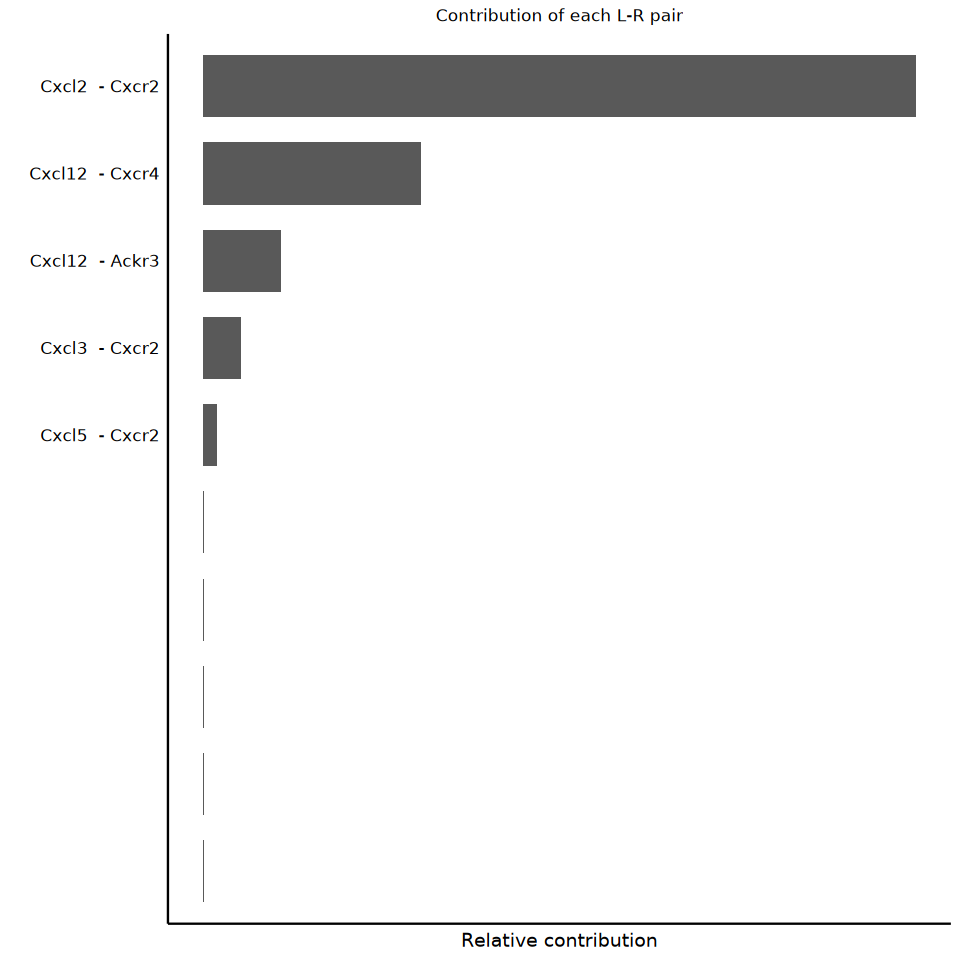

In [51]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("CXCL") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


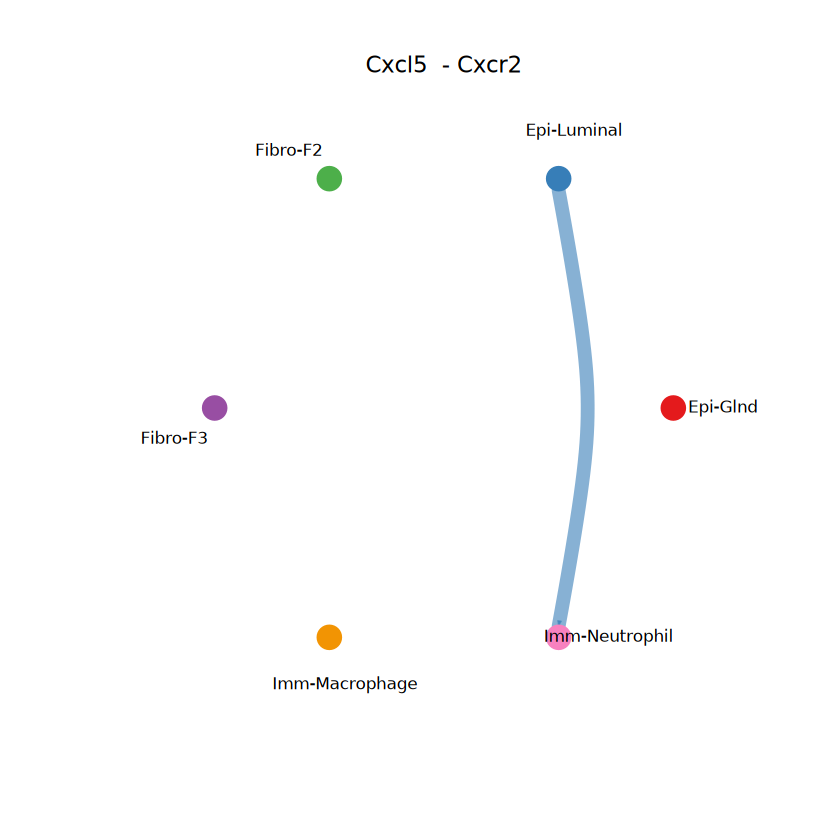

In [52]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CXCL <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CXCL[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


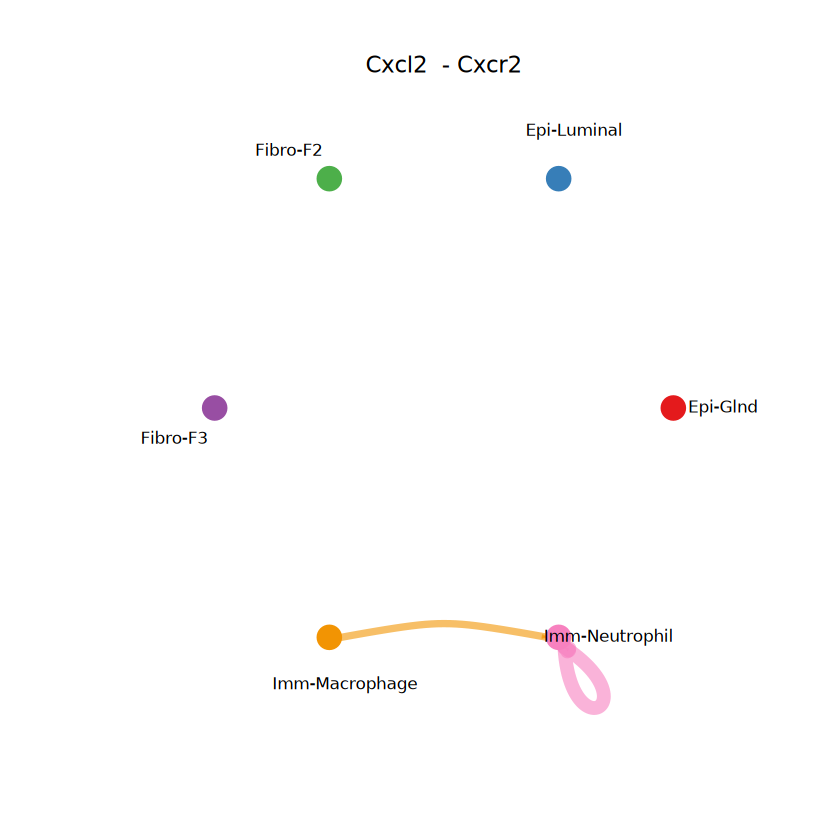

In [53]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CXCL <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CXCL[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

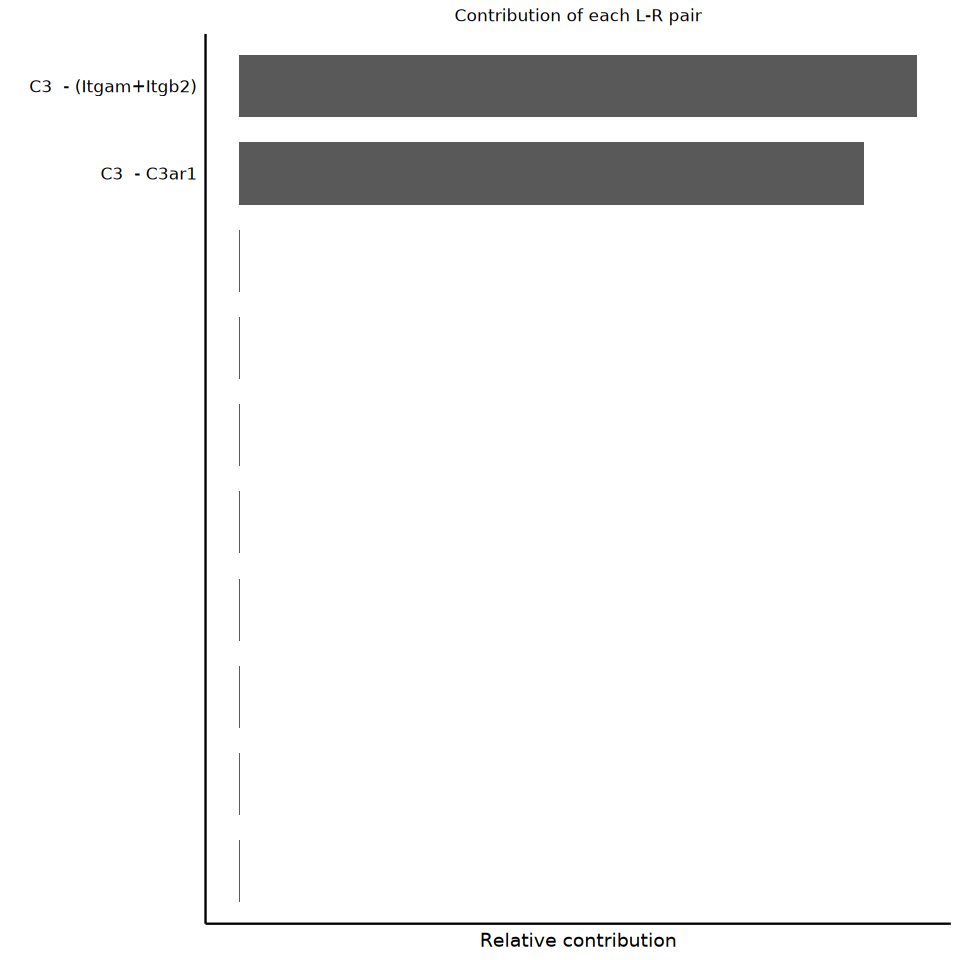

In [114]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("COMPLEMENT") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


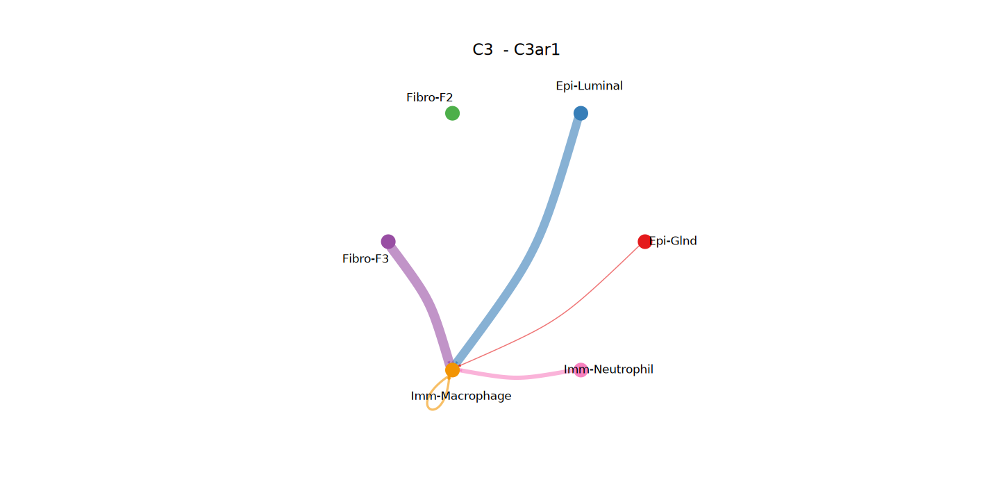

In [115]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COMPLEMENT <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COMPLEMENT[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


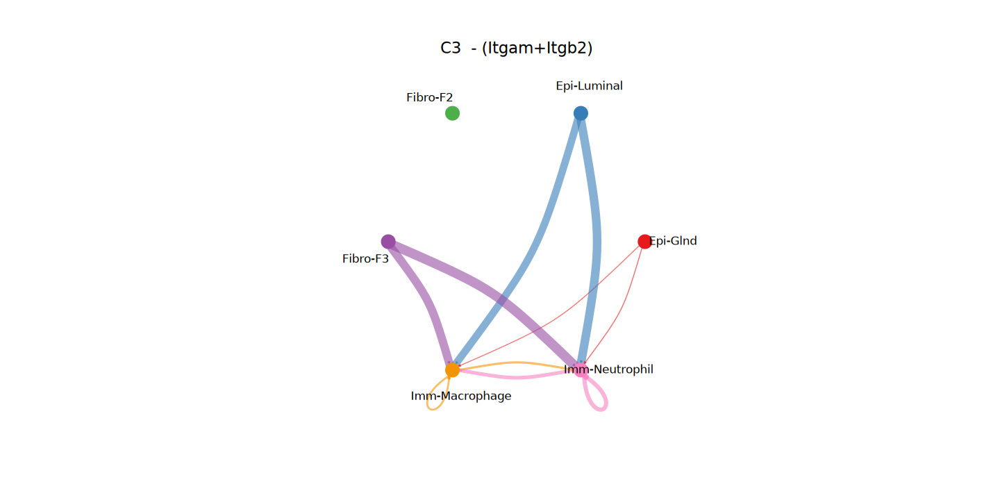

In [116]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COMPLEMENT <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COMPLEMENT[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

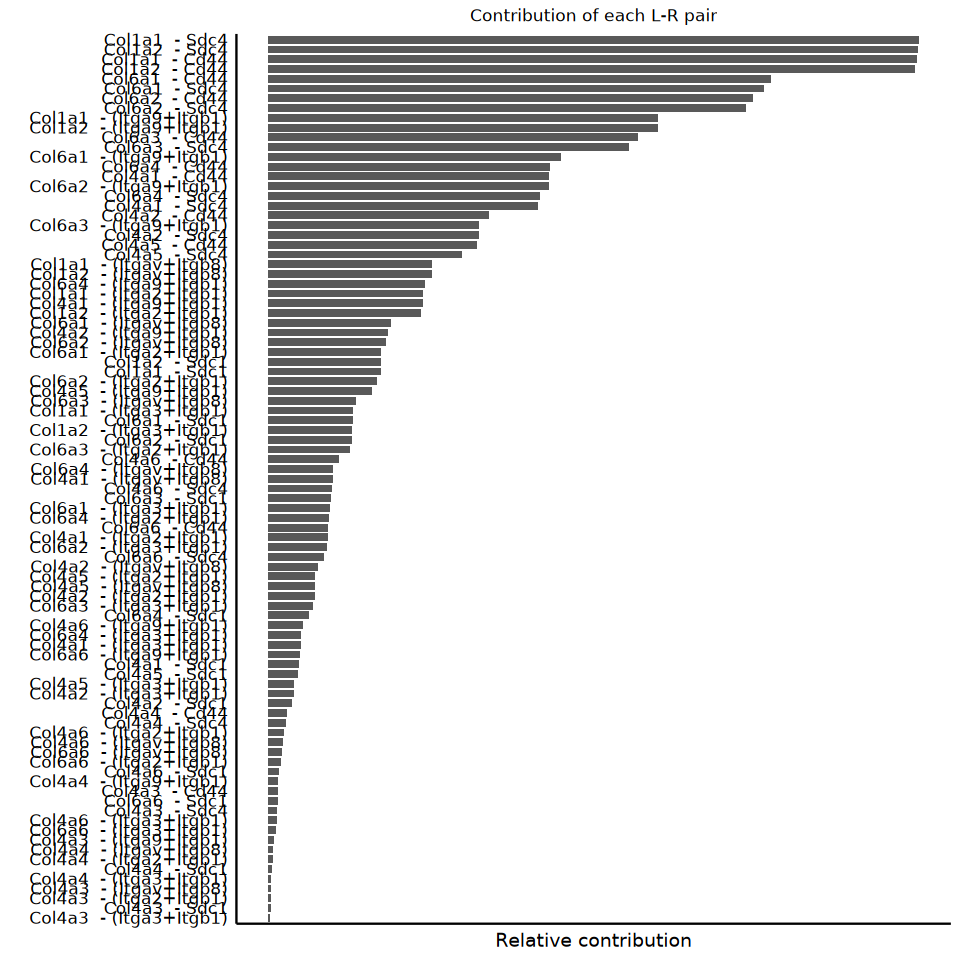

In [57]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("COLLAGEN") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


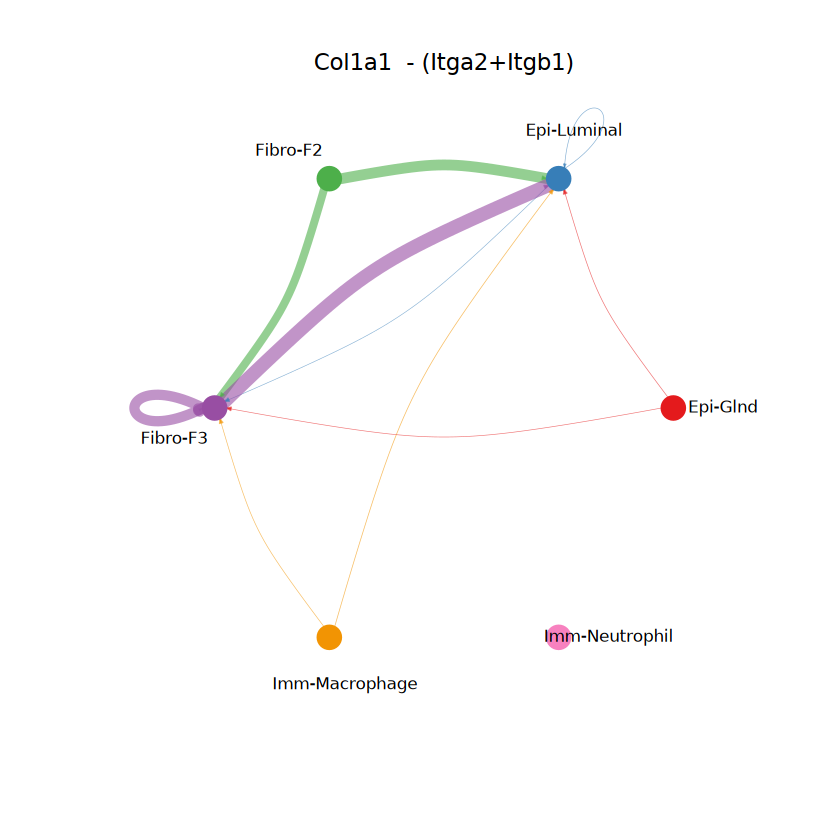

In [58]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COLLAGEN <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COLLAGEN[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


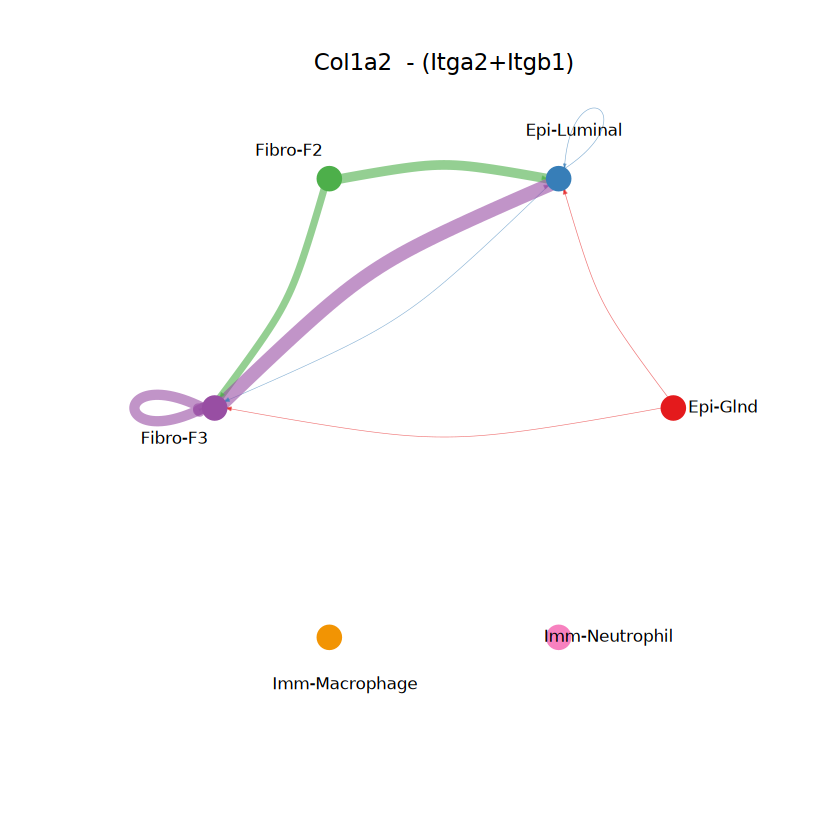

In [59]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COLLAGEN <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COLLAGEN[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


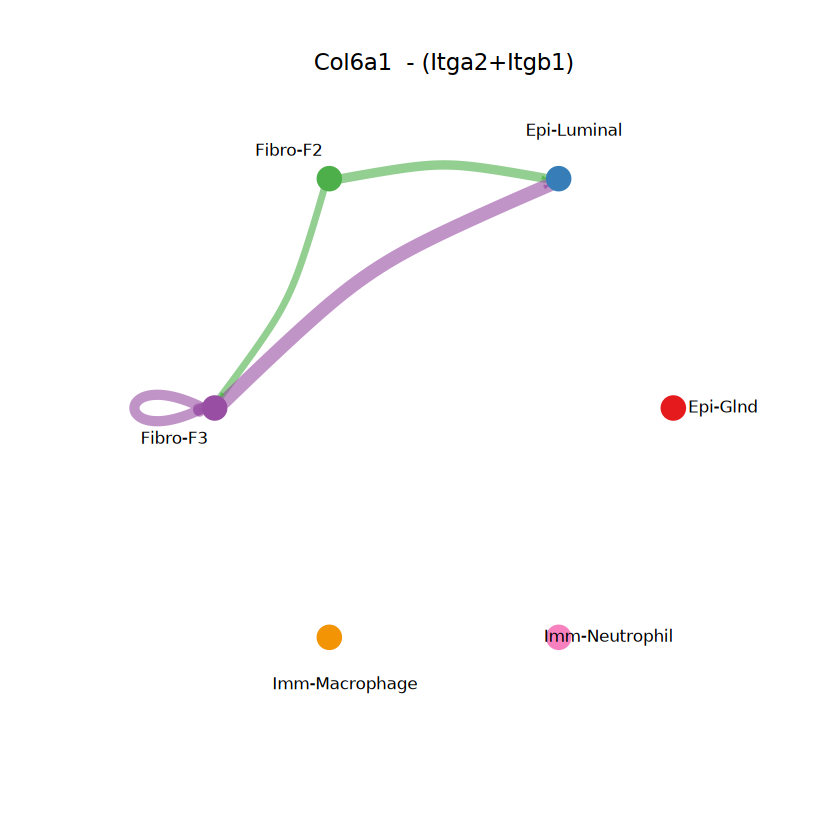

In [60]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COLLAGEN <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COLLAGEN[9,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


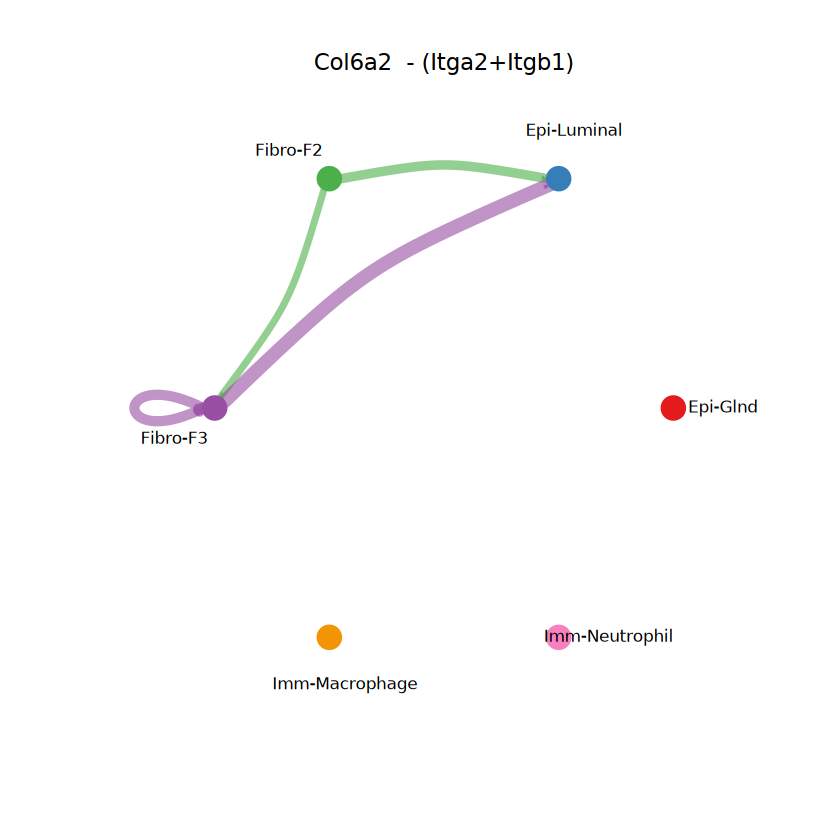

In [61]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.COLLAGEN <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.COLLAGEN[10,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

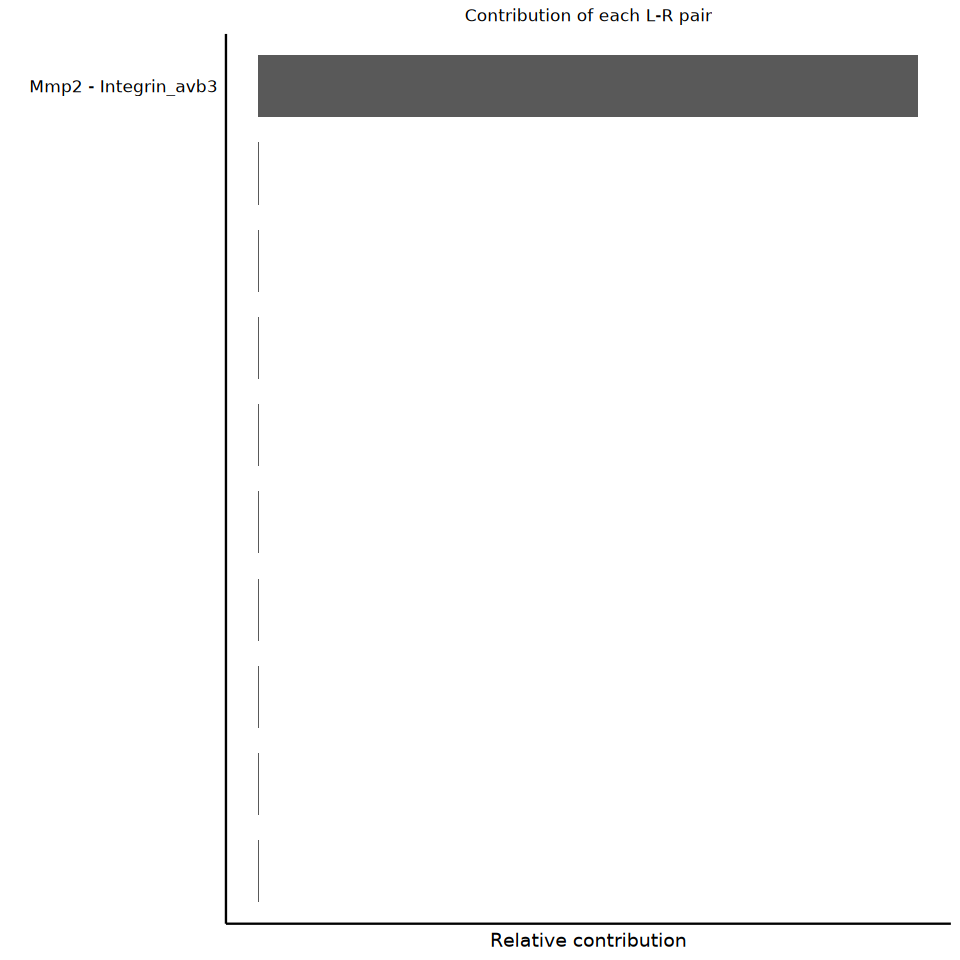

In [62]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("MMP") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


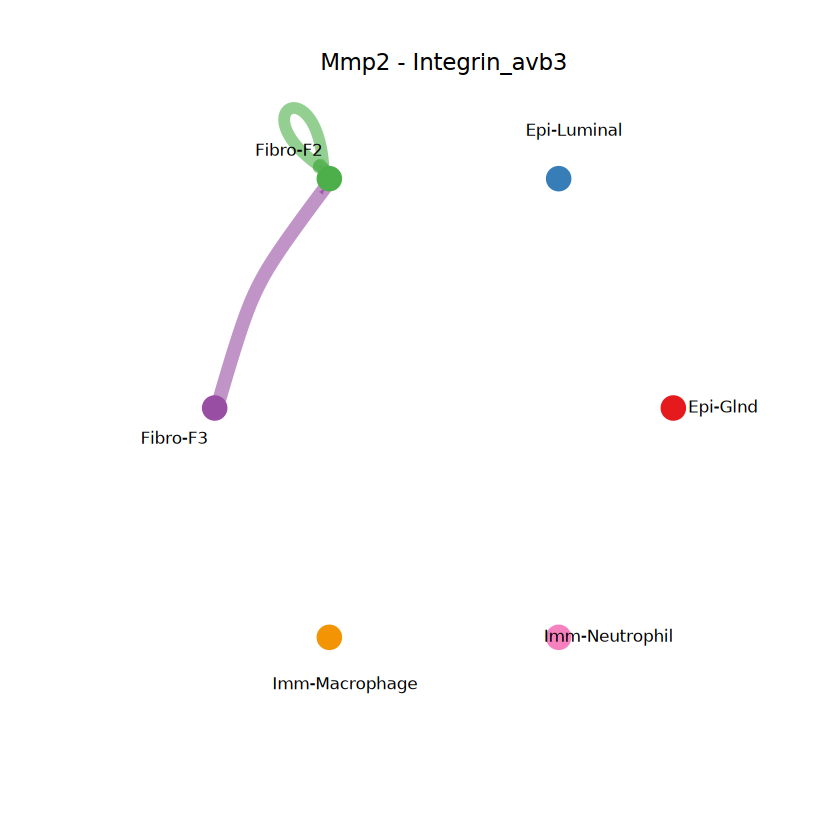

In [63]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.MMP <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.MMP[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

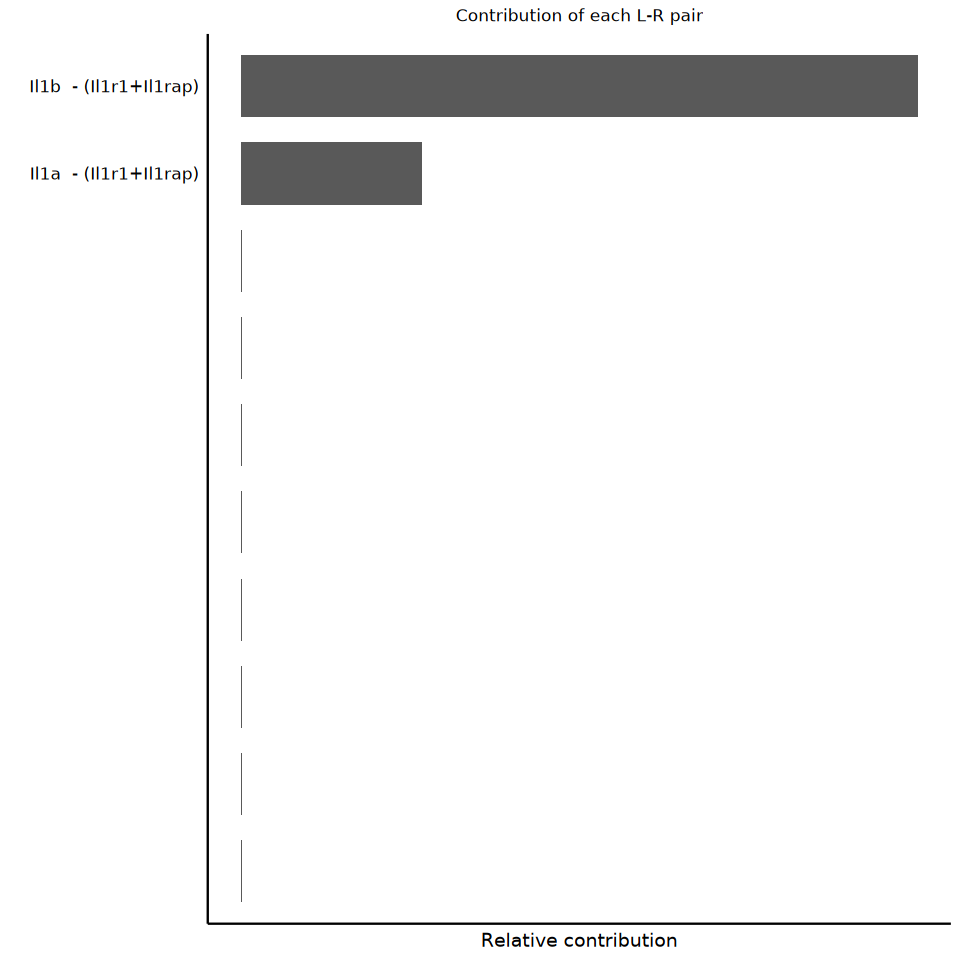

In [64]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("IL1") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


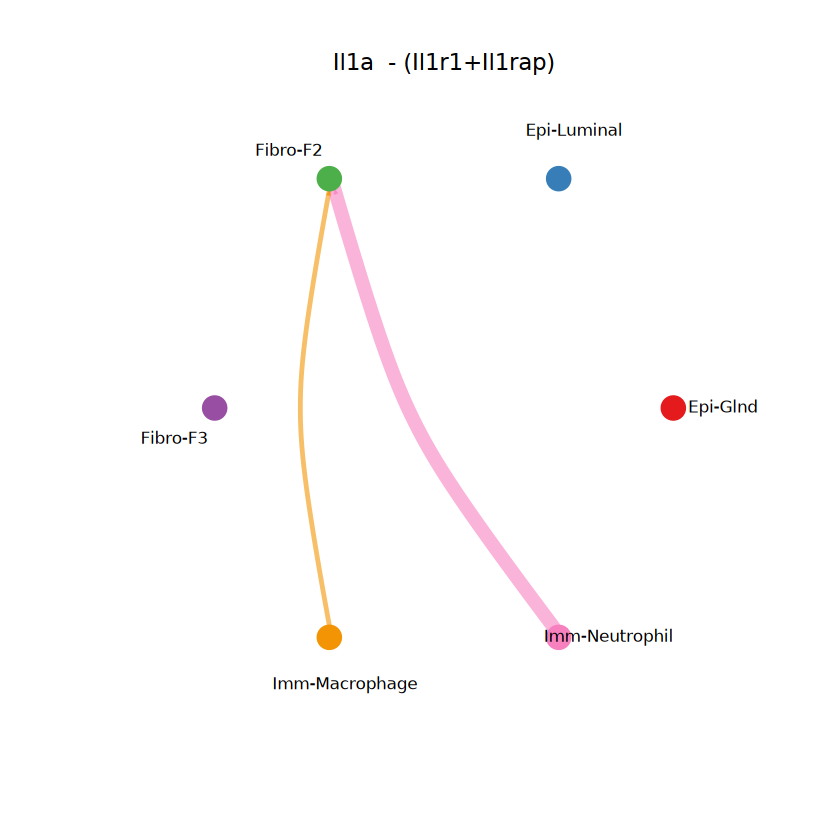

In [65]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.IL1 <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.IL1[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


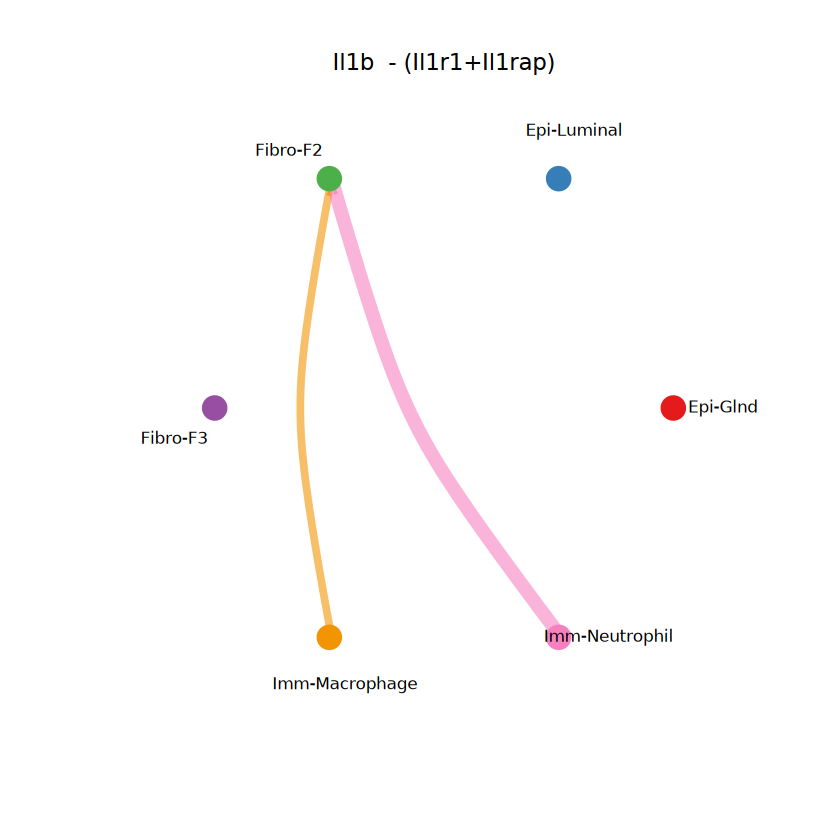

In [66]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.IL1 <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.IL1[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

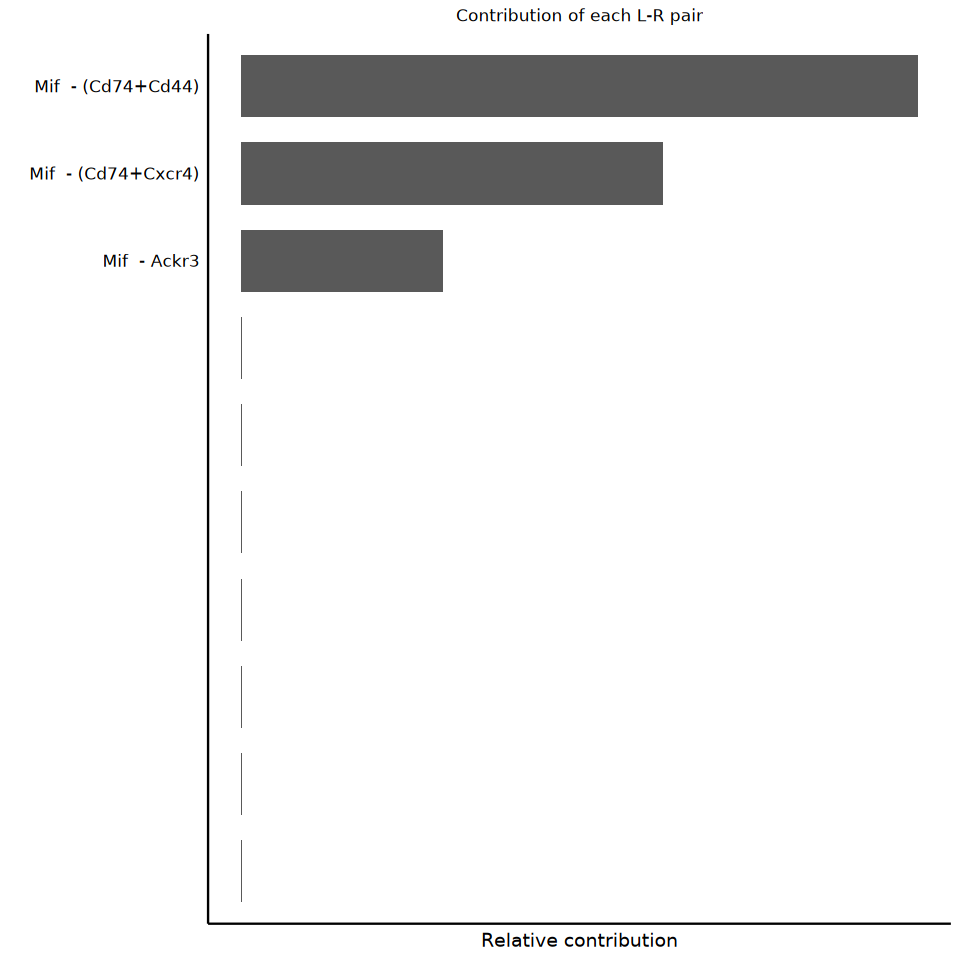

In [67]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("MIF") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


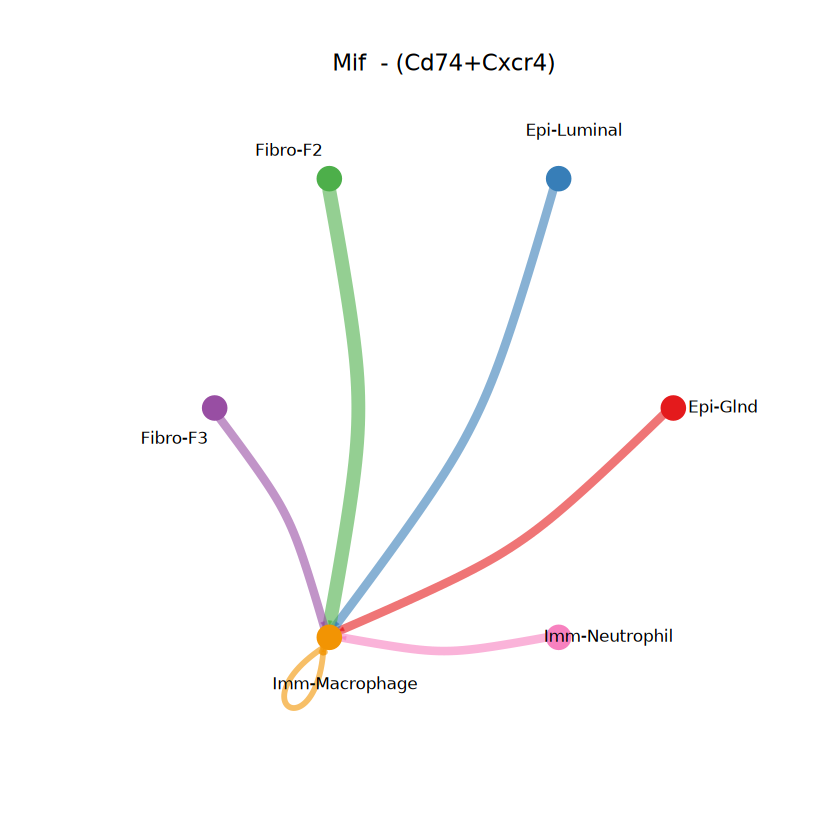

In [68]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.MIF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.MIF[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


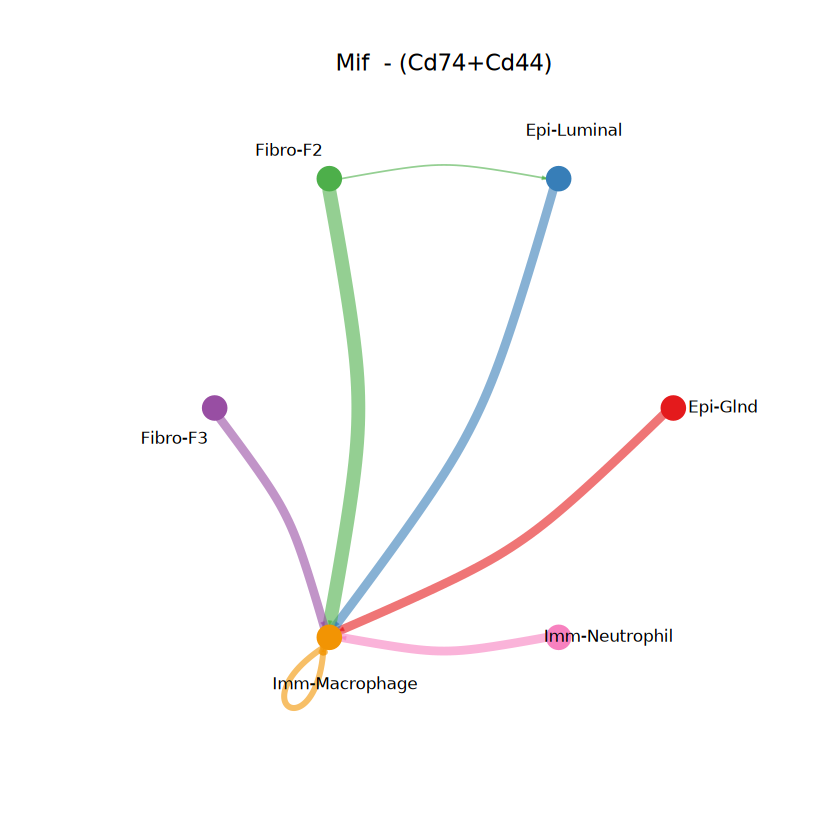

In [69]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.MIF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.MIF[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

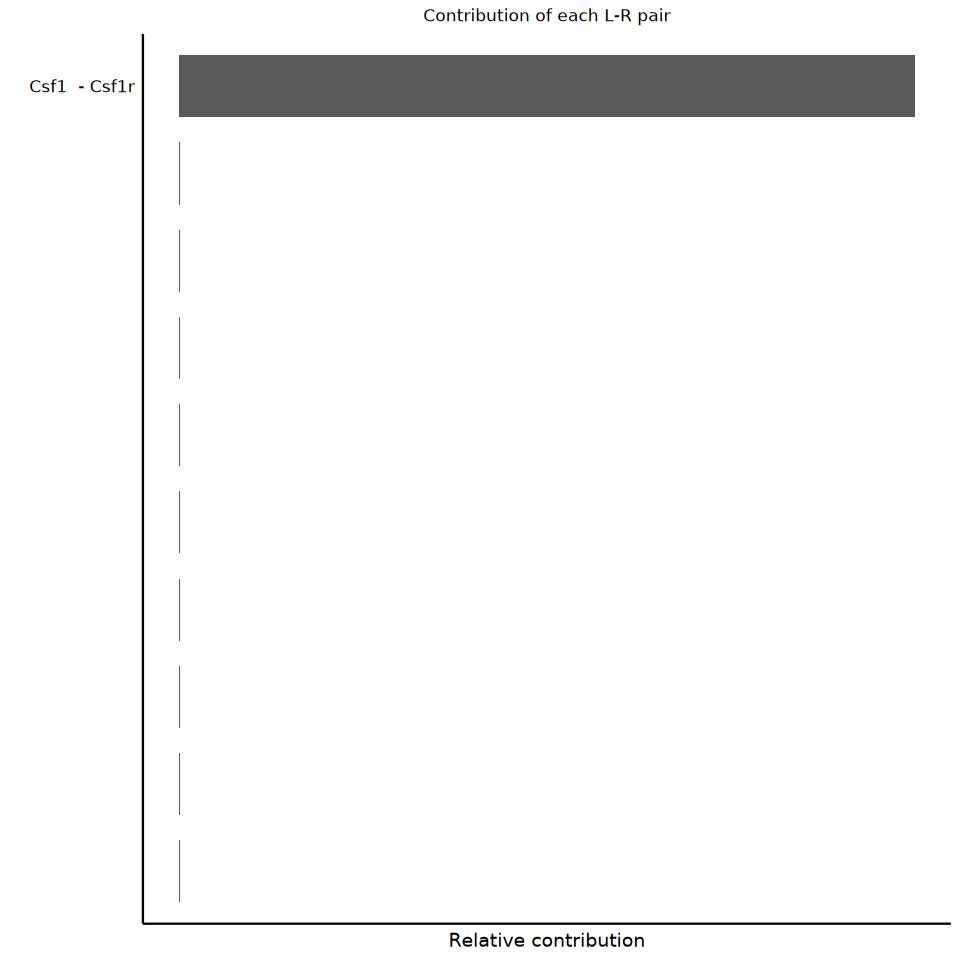

In [70]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("CSF") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


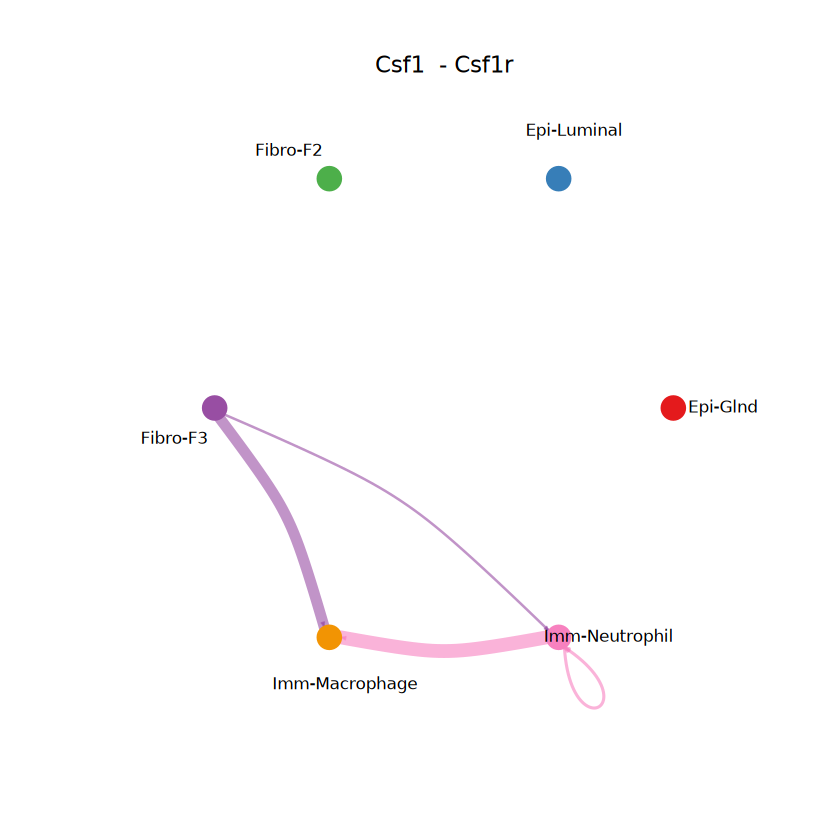

In [71]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CSF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CSF[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

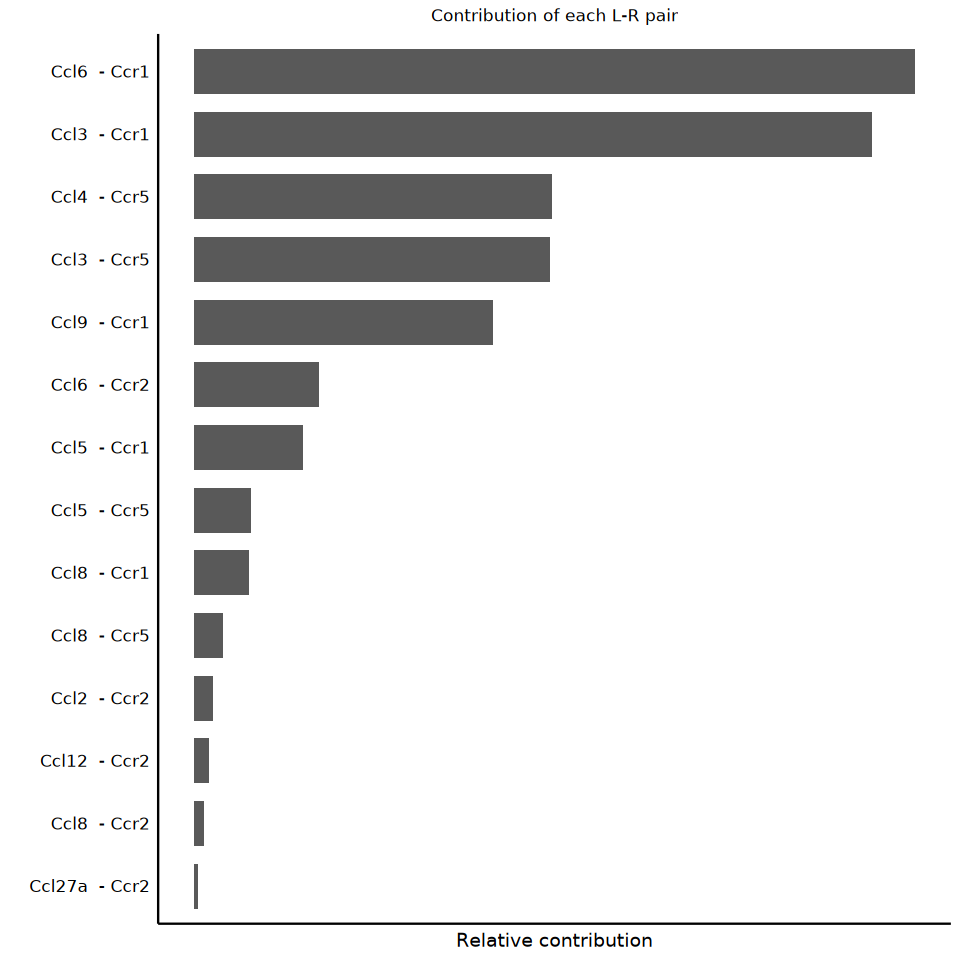

In [72]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("CCL") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


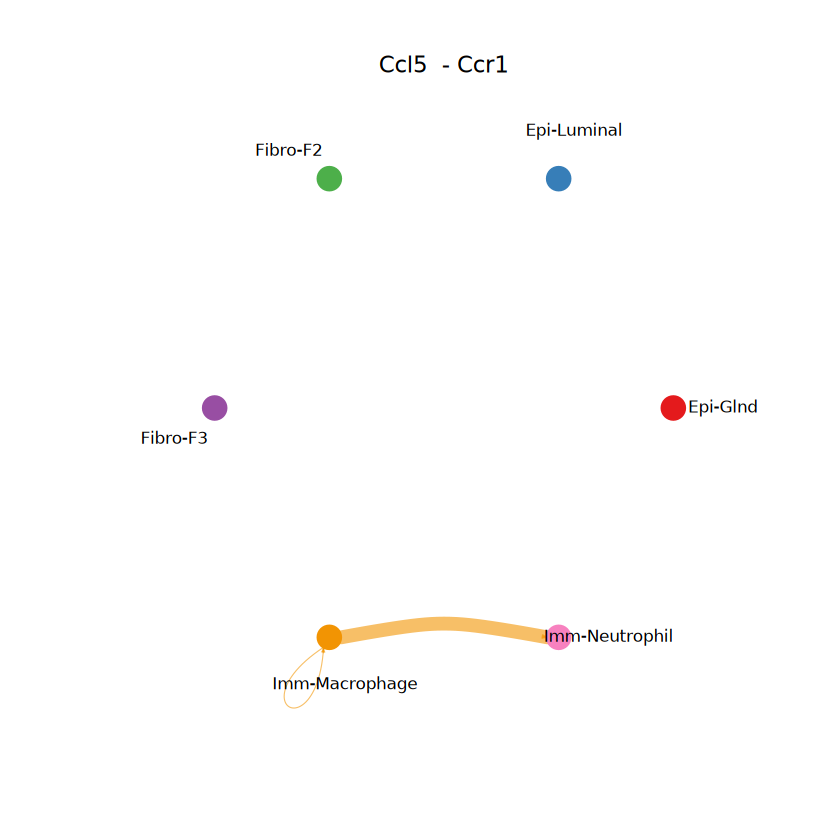

In [73]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CCL <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CCL[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


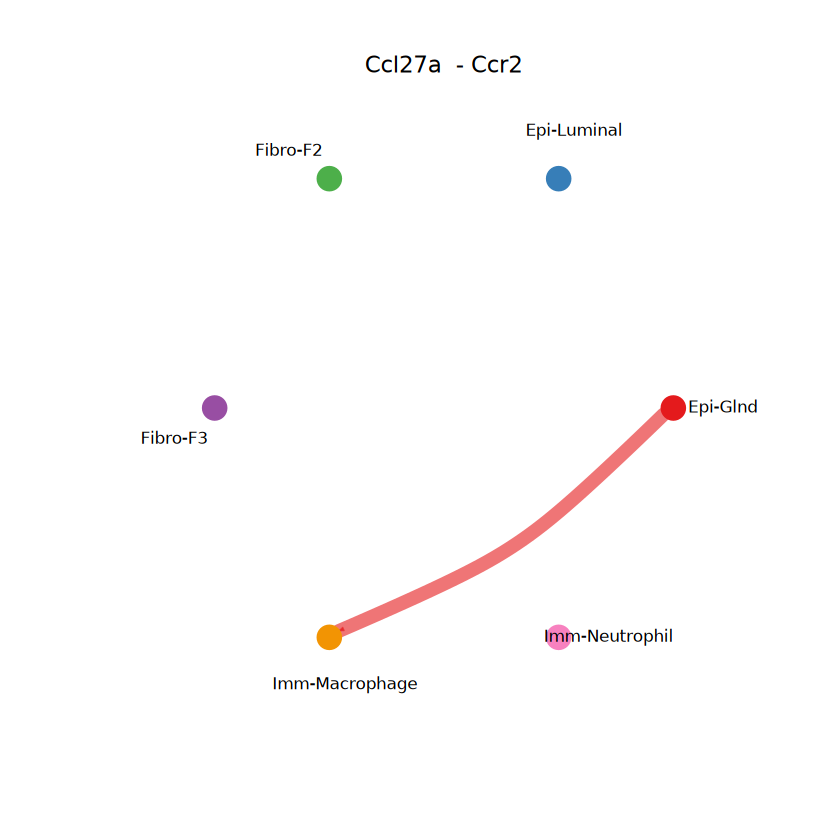

In [74]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CCL <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CCL[10,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

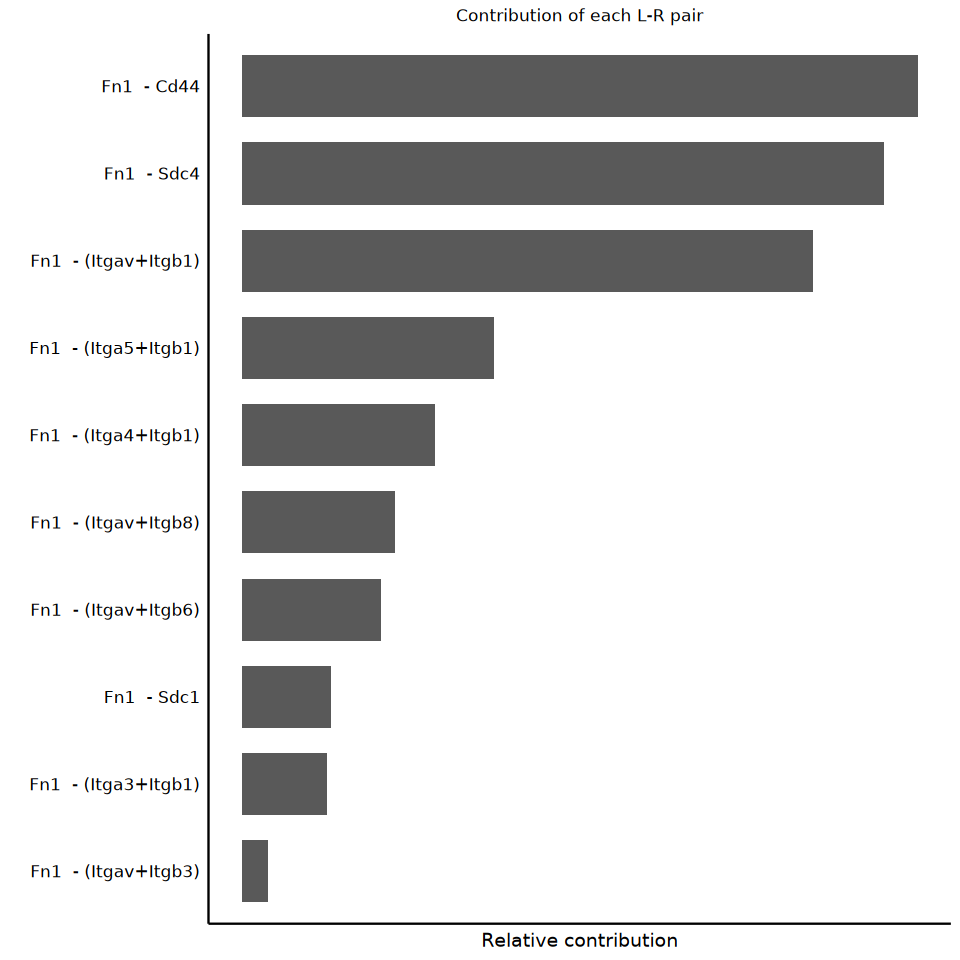

In [75]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("FN1") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


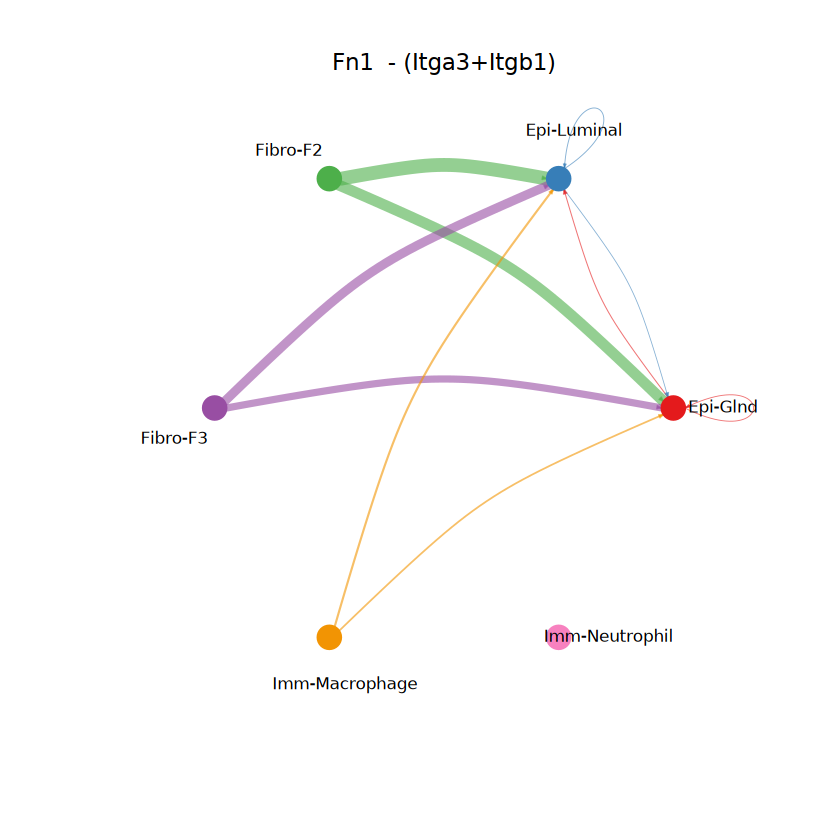

In [76]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.FN1 <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.FN1[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


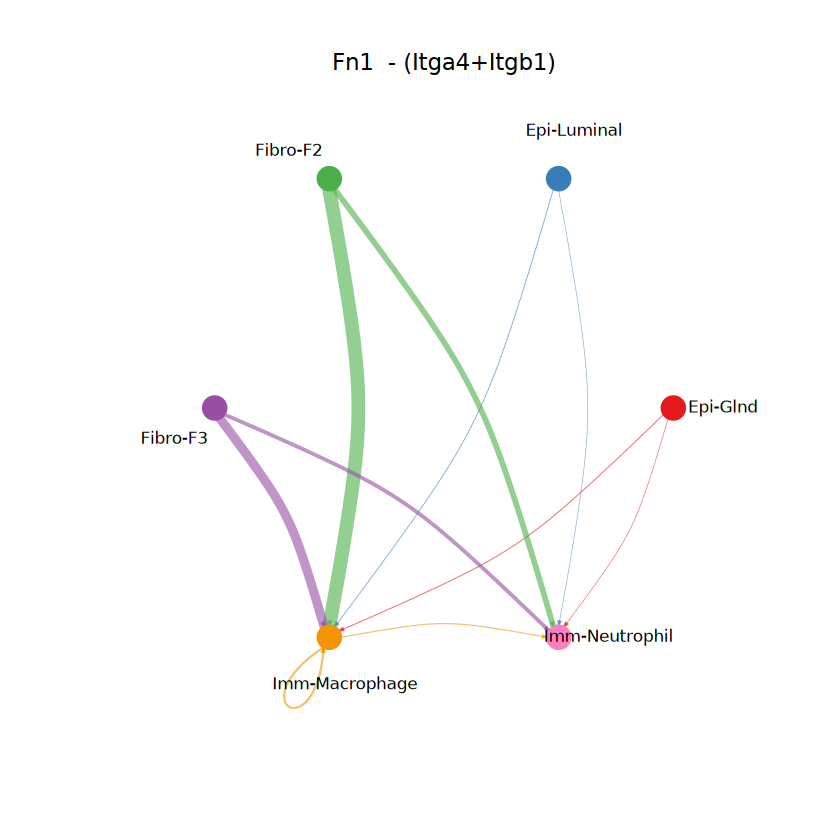

In [77]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.FN1 <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.FN1[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

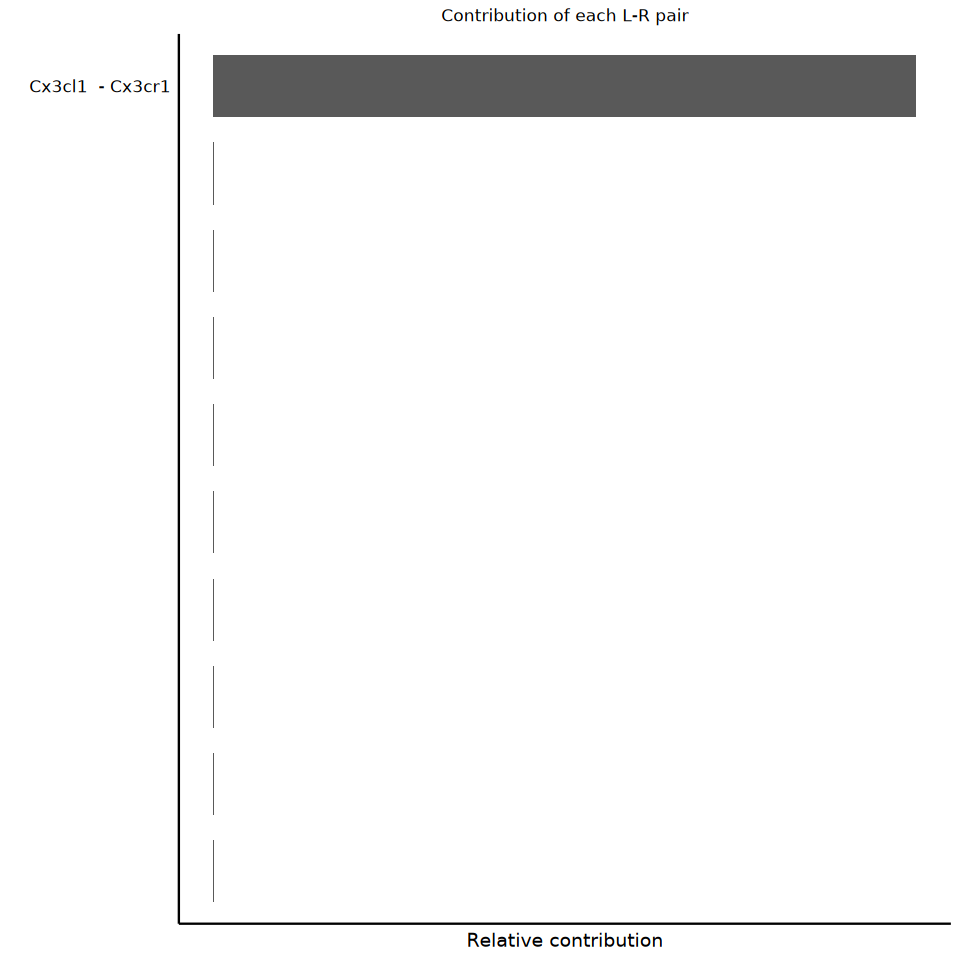

In [78]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("CX3C") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


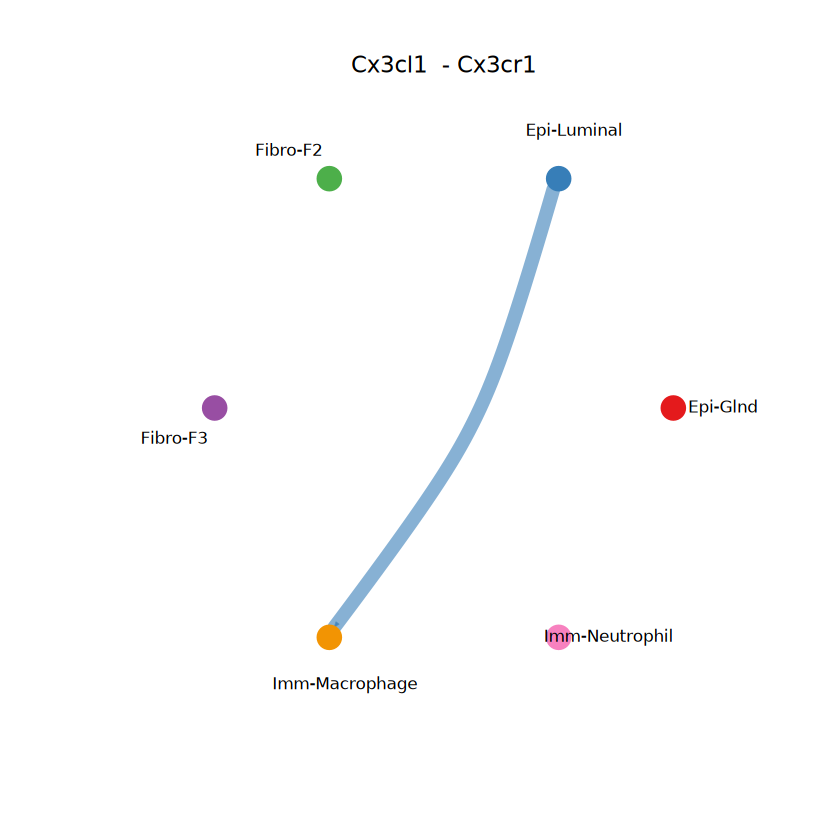

In [79]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.CX3C <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CX3C[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

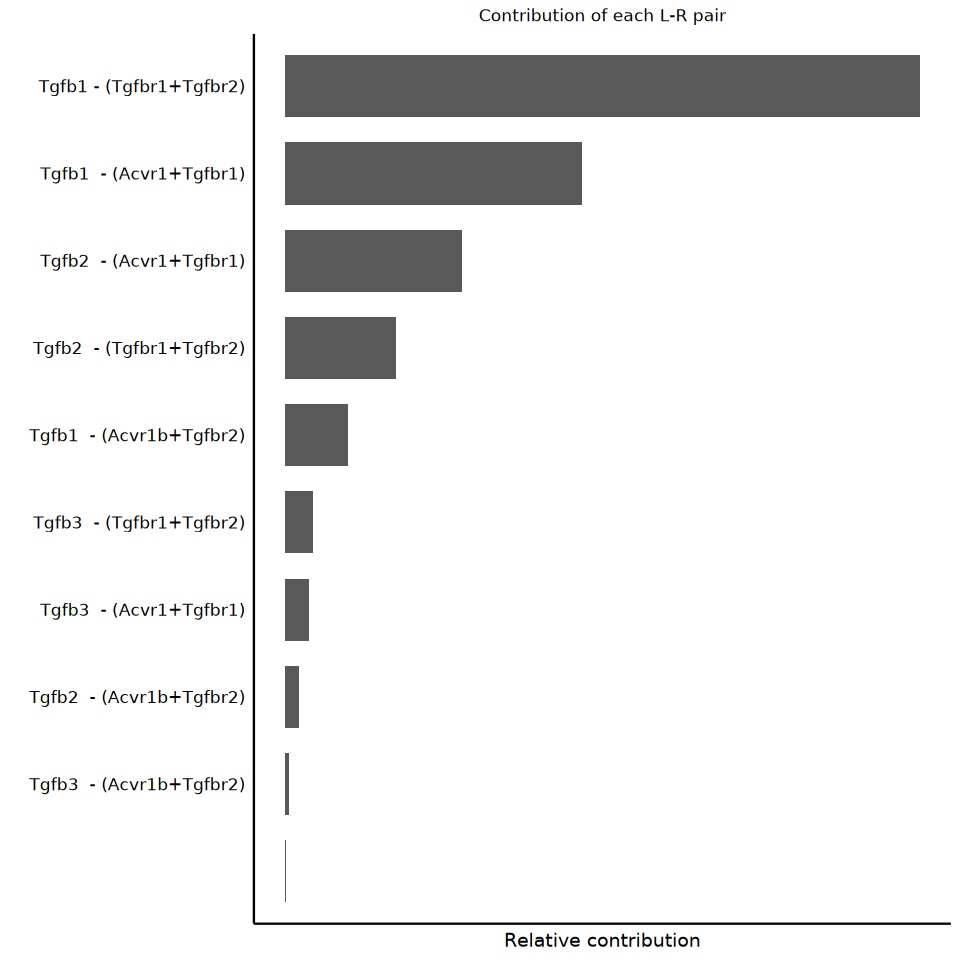

In [89]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("TGFb") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


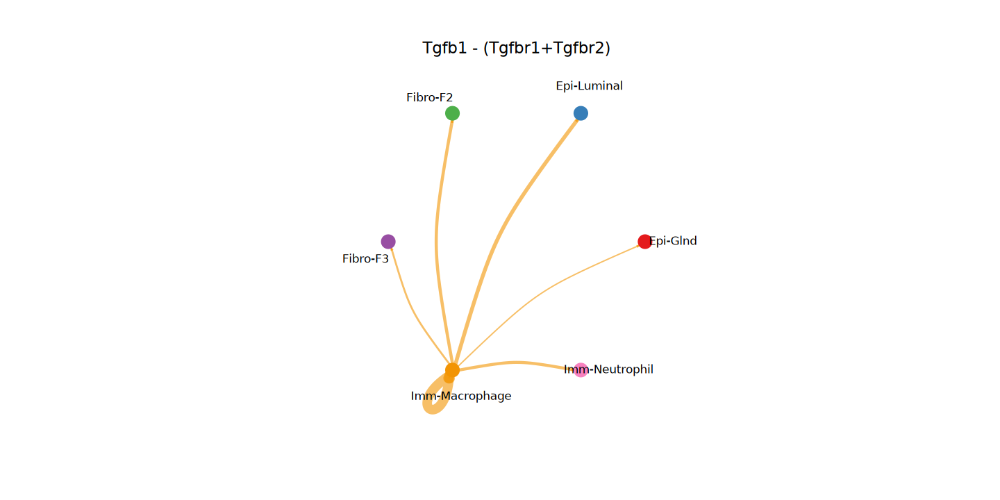

In [90]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


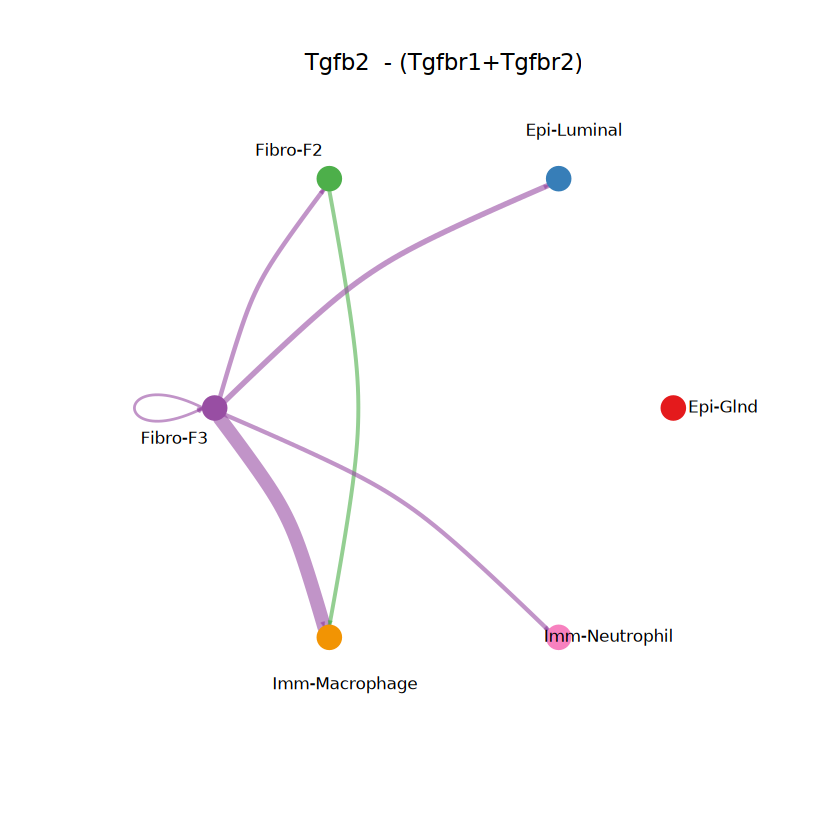

In [82]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


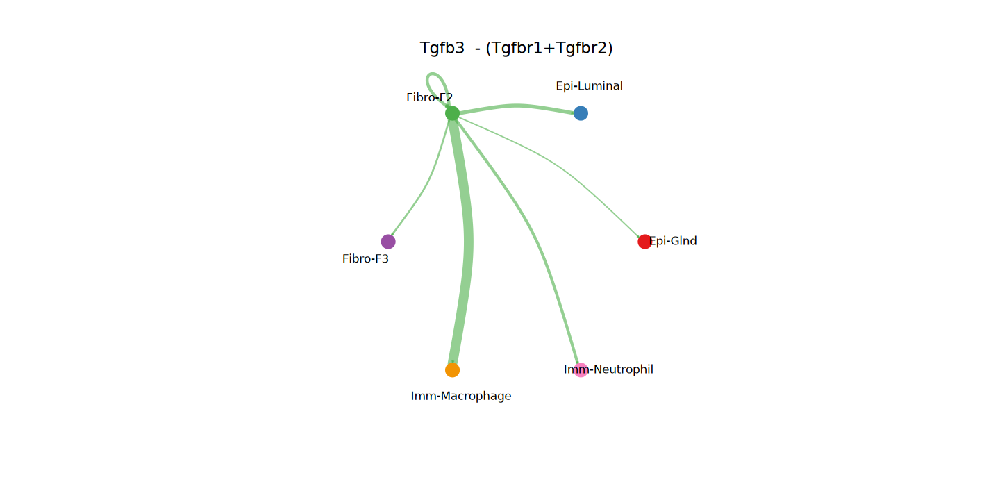

In [91]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[3,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


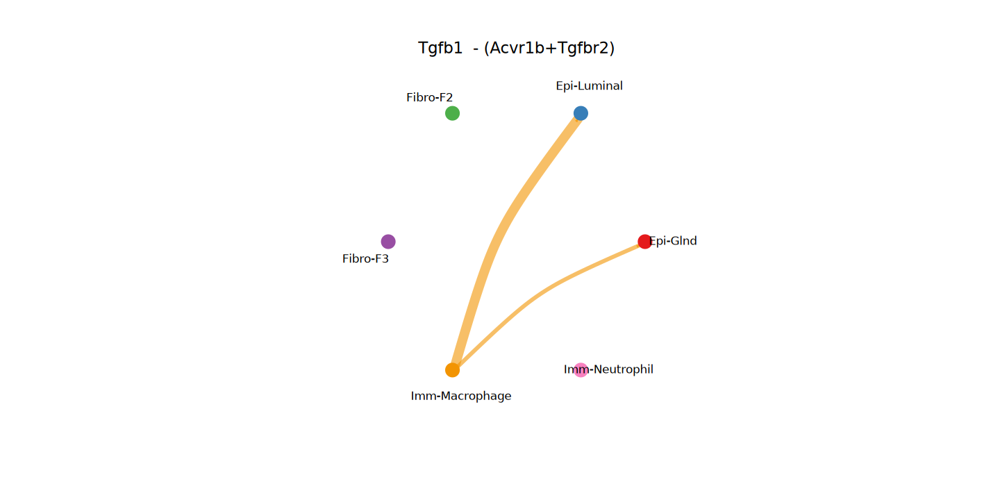

In [92]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[4,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


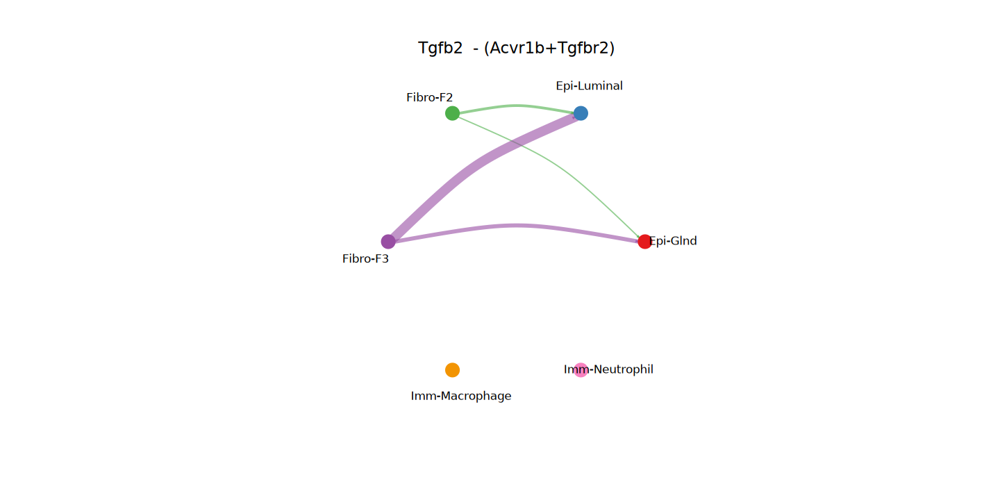

In [93]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[5,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


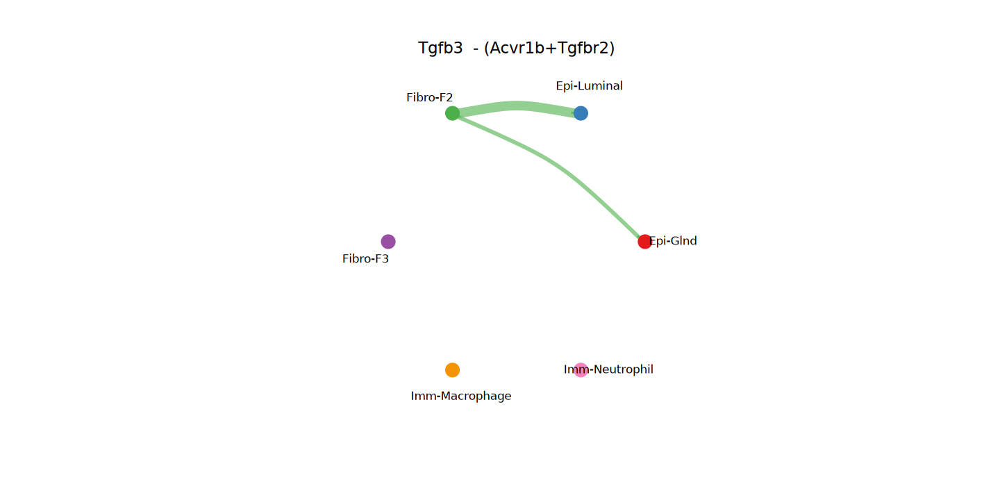

In [94]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[6,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


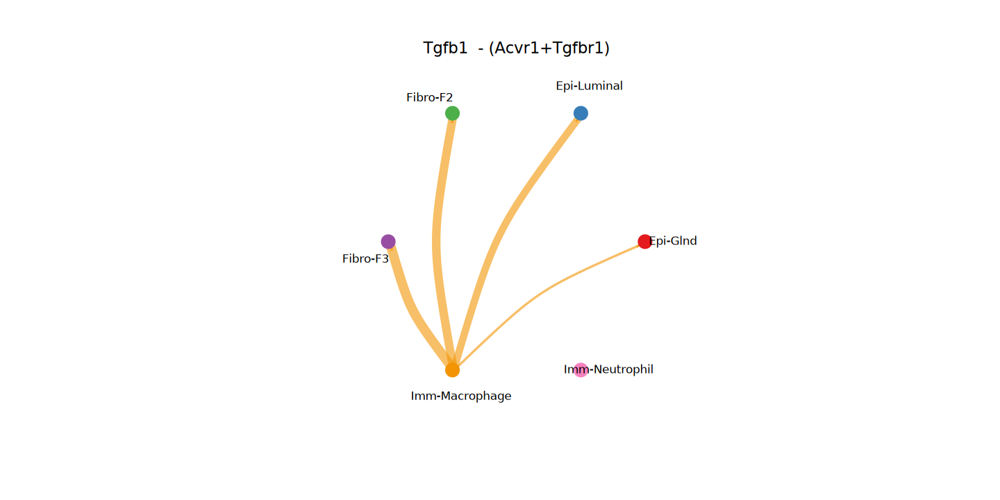

In [95]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[7,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


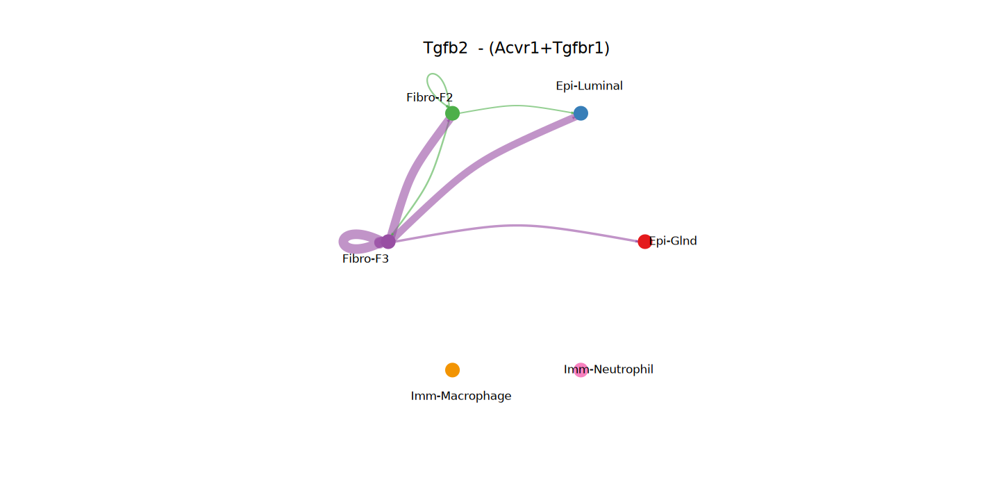

In [96]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[8,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


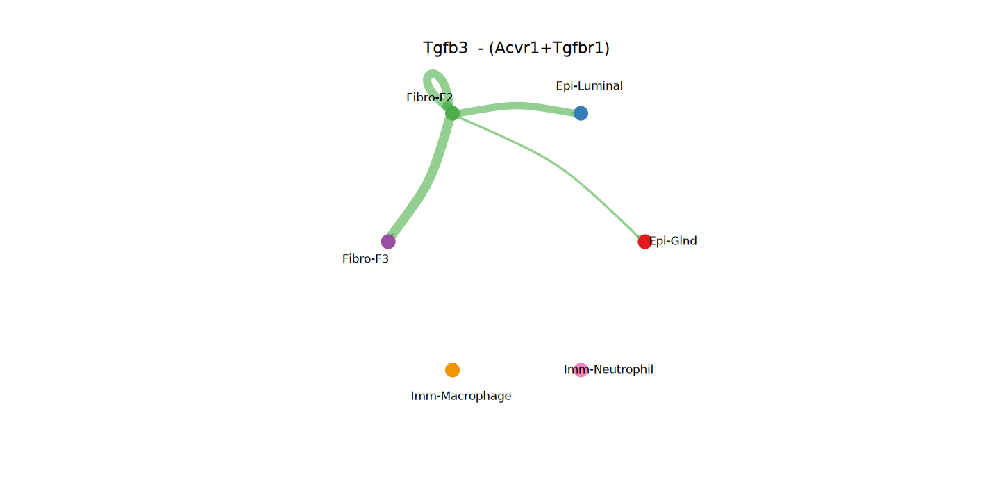

In [97]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.TGFb <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.TGFb[9,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

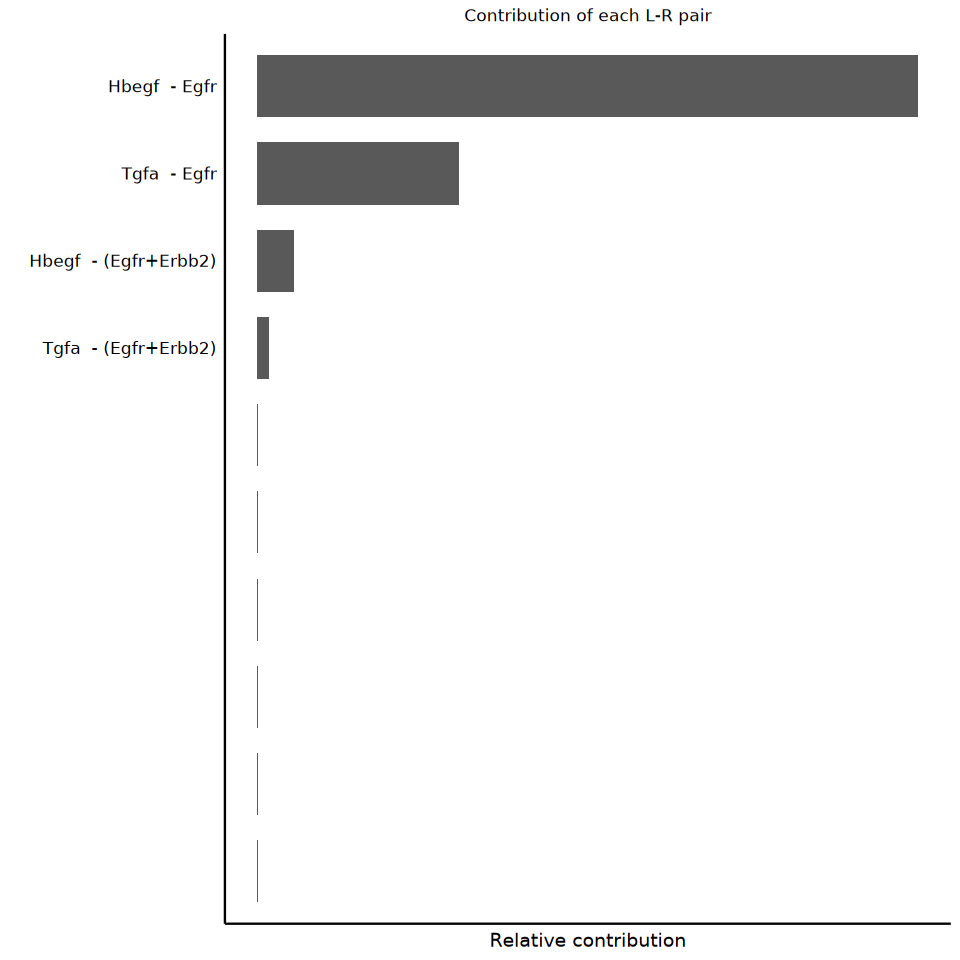

In [99]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("EGF") 
netAnalysis_contribution(CCobjSrfKO_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


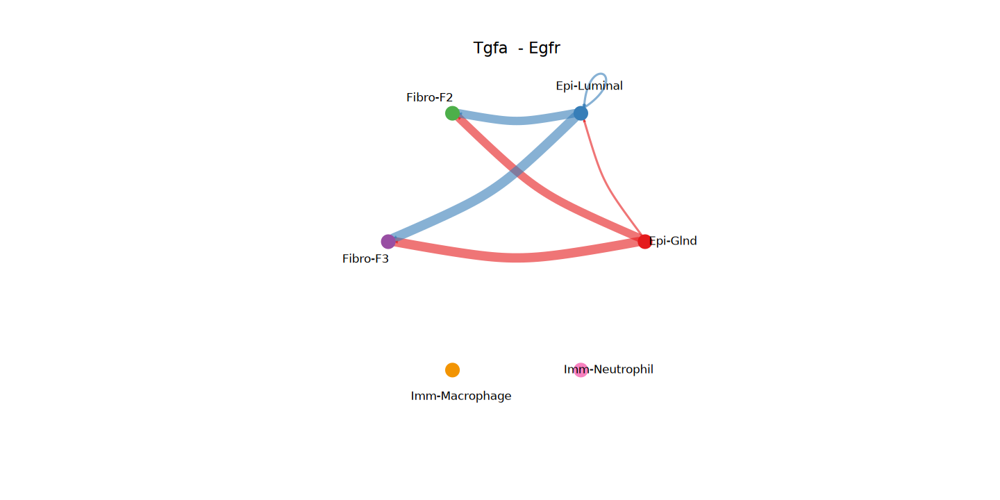

In [100]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


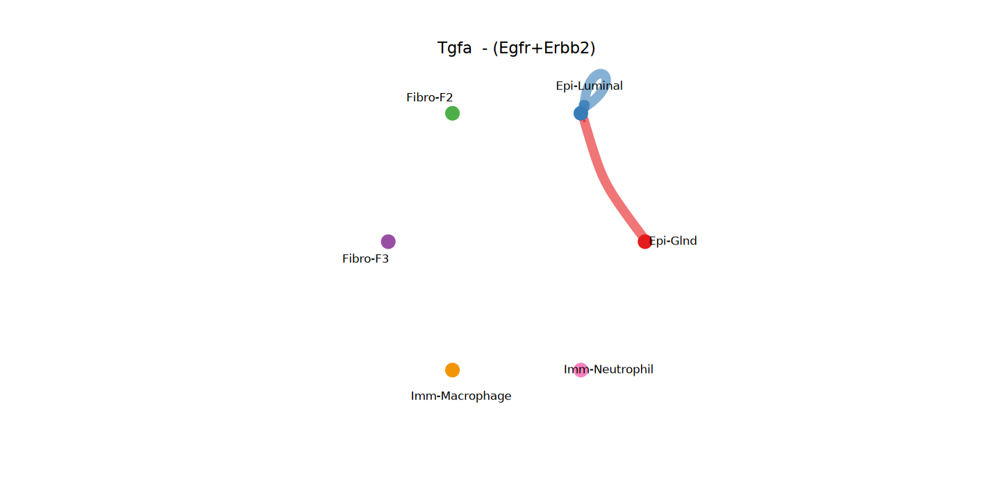

In [102]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


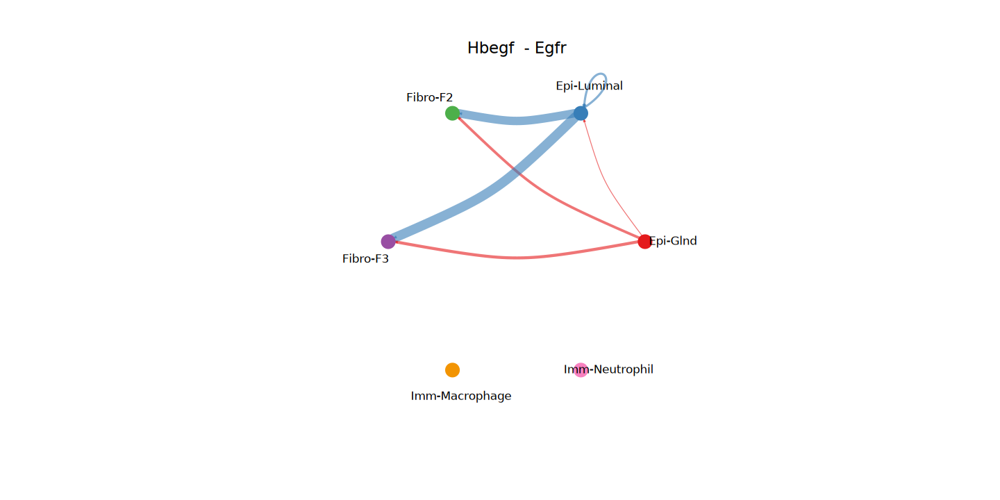

In [103]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjSrfKO_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[3,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjSrfKO_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

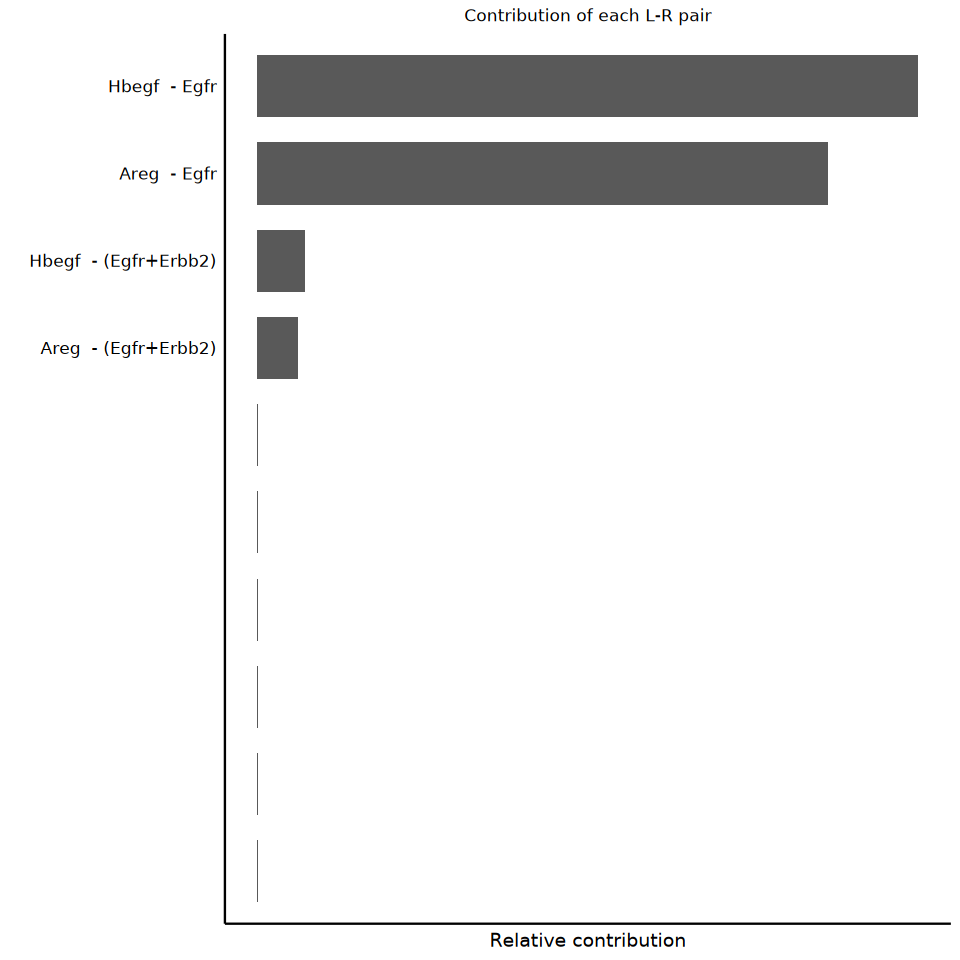

In [105]:
# Compute the contribution of each ligand-receptor pair to the overall signaling pathway and visualize cell-cell communication mediated by a single ligand-receptor pair
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options
pathways.show <- c("EGF") 
netAnalysis_contribution(CCobjCtrl_sub, signaling = pathways.show)
options(saved) # restore old settings

[[1]]


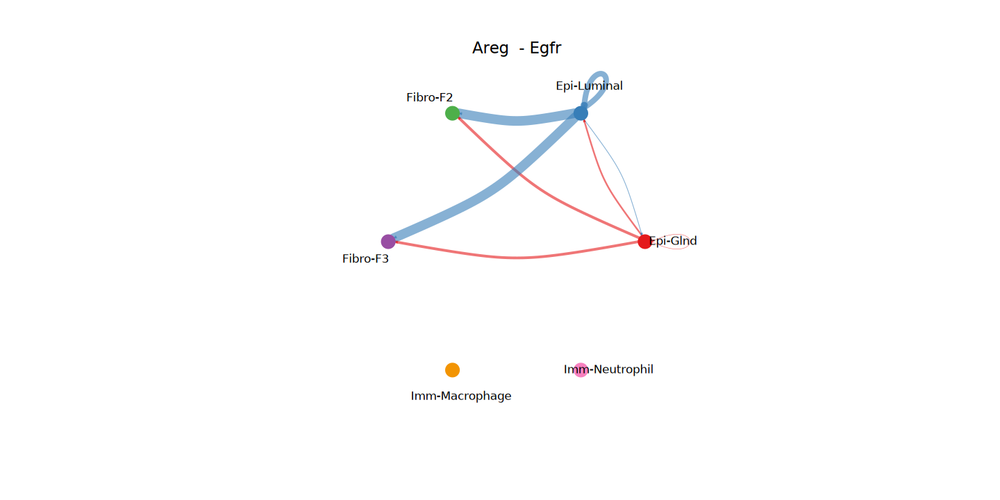

In [106]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjCtrl_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[1,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjCtrl_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


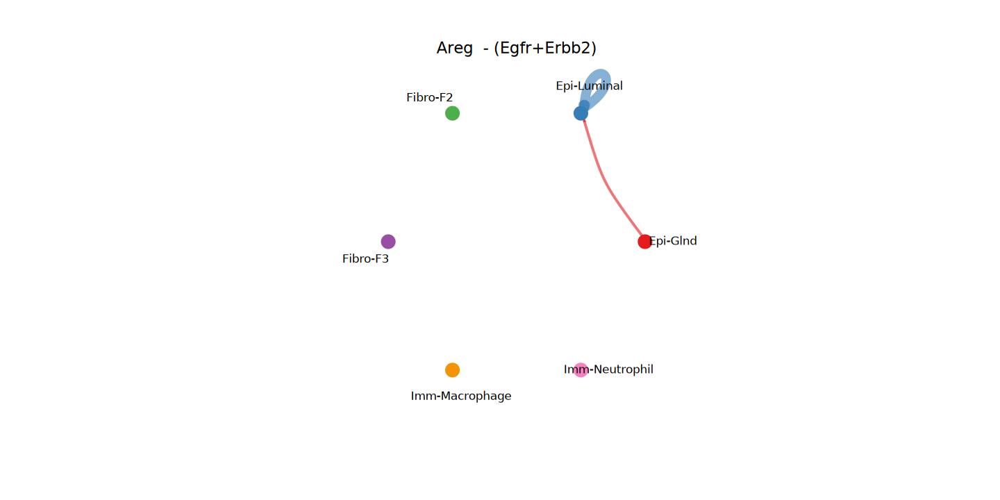

In [107]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjCtrl_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[2,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjCtrl_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


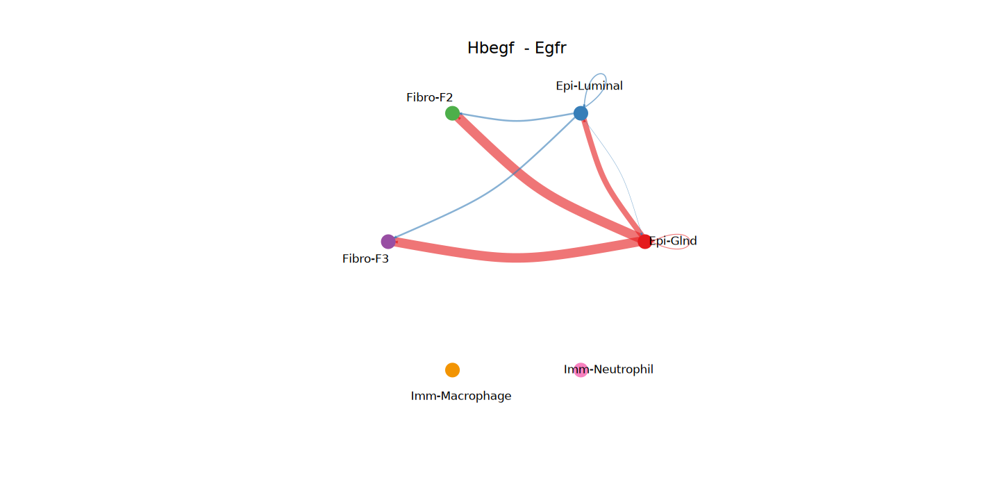

In [108]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjCtrl_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[3,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjCtrl_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

[[1]]


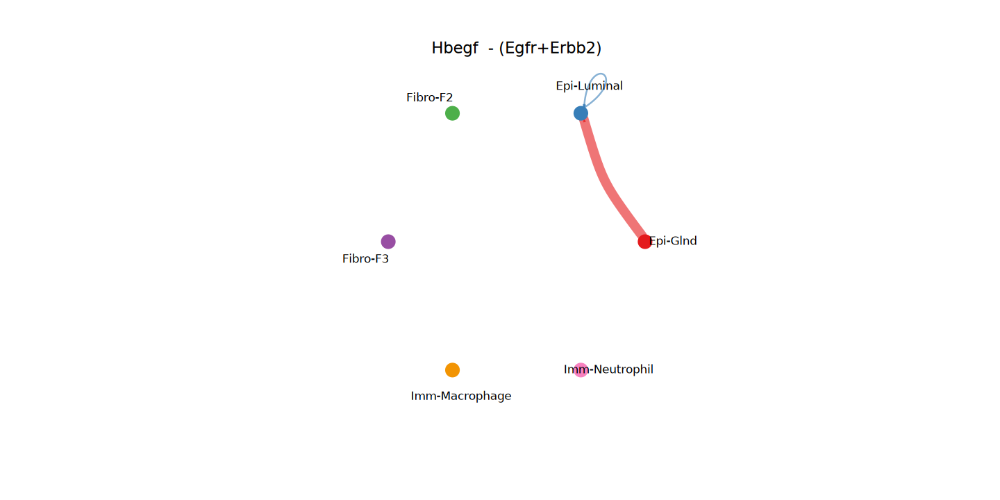

In [109]:
# We can also visualize the cell-cell communication mediated by a single ligand-receptor pair. 
# We provide a function extractEnrichedLR to extract all the significant interactions (L-R pairs) and related signaling genes for a given signaling pathway.
pairLR.EGF <- extractEnrichedLR(CCobjCtrl_sub, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.EGF[4,] # show one ligand-receptor pair (in this case #1)

# Circle plot
netVisual_individual(CCobjCtrl_sub, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")